In [ ]:
# Title: BayesAge_atlas_sex_specific_clocks.ipynb
# Author: Lajoyce Mboning
# Date:2025
# Related publication: Emma K. Costa, and Jingxun Chen, in prep


# Description - Run the BayesAge clock on Atlas tissue data

In [1]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LassoCV
from numpy import arange
from numpy import absolute
from numpy import mean
from numpy import std
import numpy as np
from scipy import stats
from sklearn.metrics import mean_absolute_error as mae
import statsmodels.api as sm
from scipy.stats import spearmanr
lowess = sm.nonparametric.lowess
from scipy.stats import poisson
from scipy.stats import pearsonr
from datetime import datetime
import time
from scipy.stats import poisson, pearsonr, linregress

In [2]:
def transcriptome_reference(training_matrix,
                        reference_name,
                        output_path="./predictions/",
                        age_prediction="list",
                        age_list=[],
                        min_age=-20,
                        max_age=100,
                        age_step=1,
                        tau=0.7,
                        ):

    start_time = time.time()

    training_cv_df = pd.read_csv(training_matrix, sep="\t", index_col=0, low_memory=False)

    training_df_frequency = training_cv_df.iloc[:,:-1]

    #print(training_df_frequency)

    training_df_frequency = training_df_frequency.div(training_df_frequency.sum(axis=1), axis=0)
    
    genes = training_cv_df.iloc[:,:-1].columns.tolist()

    age_steps = np.arange(min_age, max_age + age_step, age_step)

    # Age values from the reference data
    age_training = training_cv_df["age"].values.flatten()

    final_training_matrix = []

    if age_prediction == "list":

        for gene in genes:
            # Frequency level of current gene
            gene_frequency = training_df_frequency[gene].values.flatten()

            # Perform lowess smoothing
            predicted_frequency_levels = lowess(gene_frequency, age_training, xvals=age_list, frac=tau)

            # Calculate Spearman rank correlation
            rho, p = spearmanr(age_training, gene_frequency)

            spearman_rank = rho

            p_value = p

            final_gene_frequency_tuple = (gene, ) + tuple(predicted_frequency_levels) + (spearman_rank, p_value)

            final_training_matrix.append(final_gene_frequency_tuple)

        df_columns = ["Gene"] + [str(num) for num in age_list] + ["spearman_rank", "p_value"]

    elif age_prediction == "steps":

        for gene in genes:
            # Frequency level of current gene
            gene_frequency = training_df_frequency[gene].values.flatten()

            # Perform lowess smoothing
            predicted_frequency_levels = lowess(gene_frequency, age_training, xvals=age_steps, frac=tau)

            # Calculate Spearman rank correlation
            rho, p = spearmanr(age_training, gene_frequency)

            spearman_rank = rho

            p_value = p

            final_gene_frequency_tuple = (gene, ) + tuple(predicted_frequency_levels) + (spearman_rank, p_value)

            final_training_matrix.append(final_gene_frequency_tuple)

        df_columns = ["Gene"] + [str(num) for num in age_steps] + ["spearman_rank", "p_value"]


    df = pd.DataFrame(final_training_matrix, columns=df_columns)
    df.set_index("Gene", inplace=True)

    # Create output directory if it doesn't exist
    os.makedirs(output_path, exist_ok=True)
    
    # Save the DataFrame to a TSV file
    df.to_csv(os.path.join(output_path, reference_name), sep="\t")
    print(f"\nReference model dataset written to '{os.path.join(output_path, reference_name)}'")

    number_of_samples = training_cv_df.shape[0] 
    
    # Write report file detailing input matrix
    report_file_path = os.path.join(output_path, f'{reference_name}.report.txt')
    with open(report_file_path, 'w') as writer:
        writer.write("BayesAge reference report for %s\n" % reference_name)
        now = datetime.now()
        write_datetime = now.strftime("%m/%d/%Y %H:%M:%S")
        writer.write("Reference file created: %s\n\n" % write_datetime)
        writer.write("Number of input samples = %s\n" % number_of_samples)
        writer.write("Number of input Genes = %s\n" % len(genes))
        if age_prediction == "list":
            writer.write("Predictions made for ages: %s\n" % age_list)
        elif age_prediction == "steps":
            writer.write("Predictions made for age steps from %s to %s with step %s\n" % (min_age, max_age, age_step))

    print(f"Report file generated at '{report_file_path}'")
    print("-----------------------------------------------------\n\n")

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("\nTime to run construct reference: %0.3f seconds" % elapsed_time)
    print("\nThe reference is constructed and saved!")

    return df  # Optionally return the DataFrame

In [3]:
os.chdir("/labs/twc/Emma/Atlas_feature_importance/BayesAge_outs/")

In [6]:
# df_norm = pd.read_csv("../AtlasFiles_forLajoyce_240507/CountsNormDESeq2_AllTissue_240506.csv")

In [7]:
df_unnorm = pd.read_csv("../AtlasFiles_forLajoyce_240507/Counts_Atlas_allbatches_merged_v3.csv")

In [8]:
df_unnorm.rename(columns={"Unnamed: 0": "Gene"}, inplace=True)

df_unnorm.head(5)

,Gene,A1_1,A1_2,A10_1,A10_2,A11_1,A11_2,A12_1,A12_2,A13_1,...,P4_2,P5_1,P5_2,P6_1,P6_2,P7_1,P7_2,P8_2,P9_1,P9_2
0,a1cf,21686,52,5891,6,7544,18,10043,9,0,...,12,45920,3113,9682,4020,37522,1383,36,7855,14
1,aaas,623,585,1108,720,824,1072,1004,611,192,...,484,310,143,336,487,178,148,735,1383,717
2,aacs,1980,502,266,1913,238,2252,308,1614,56,...,1061,6587,291,3347,552,329,178,1124,382,1232
3,aadat,523,537,676,484,674,790,812,536,302,...,976,307,147,121,294,262,118,1485,781,465
4,aaed1,200,709,233,462,292,413,356,378,204,...,124,16,56,14,237,20,66,158,248,264


In [9]:
df_unnorm.set_index("Gene", inplace=True)

In [10]:
df_unnorm = df_unnorm.T

df_unnorm.head(5)

Gene,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A1_1,21686,623,1980,523,200,802,1242,1224,562,577,...,829,161,1014,220,1560,42,515,3018,1422,325
A1_2,52,585,502,537,709,674,1385,2329,652,646,...,1113,92,963,153,1118,27,966,3871,275,364
A10_1,5891,1108,266,676,233,835,1374,809,716,778,...,635,156,1650,137,1370,380,662,3191,498,477
A10_2,6,720,1913,484,462,710,1745,747,1132,785,...,1918,209,1277,278,2082,44,2019,1827,251,380
A11_1,7544,824,238,674,292,726,1363,1049,795,767,...,452,206,1214,117,1139,428,560,2096,387,479


In [11]:
# df_norm = df_norm.T

In [12]:
# df_norm_frequency = df_norm.div(df_norm.sum(axis=1), axis=0)

In [13]:
df_metadata = pd.read_csv("../AtlasFiles_forLajoyce_240507/ExperimentDesign_allbatches_combined_v7.csv")

df_metadata.head(3)

,Unnamed: 0,animalID,sex,cohort,age_days,harvest_date,hatch_date,tissue,tissue_grind_date,RNA_extract_date,RNA_batch,RNA_extractor,RNAID,cDNA_batch,plate_well,sampleNames,lib,censored,censor_code,notes
0,A1_1,J9,F,2,155,8/16/22,3/14/22,Gut,NaN,3/8/23,Gut_1,EC,RNA352,1,A1,A1,A1_1,NaN,NaN,NaN
1,A1_2,A01,M,2,78,5/31/22,3/14/22,Bone,4/19/23,4/22/23,Bone_1,EC,RNA572,2,A1,A1,A1_2,NaN,NaN,NaN
2,A10_1,P_1B_10,M,1B,133,1/31/22,9/20/21,Kidney,NaN,3/4/23,Kidney_1,JC,R258,1,A10,A10,A10_1,NaN,NaN,NaN


In [14]:
df_metadata.reset_index()

,index,Unnamed: 0,animalID,sex,cohort,age_days,harvest_date,hatch_date,tissue,tissue_grind_date,...,RNA_batch,RNA_extractor,RNAID,cDNA_batch,plate_well,sampleNames,lib,censored,censor_code,notes
0,0,A1_1,J9,F,2,155,8/16/22,3/14/22,Gut,NaN,...,Gut_1,EC,RNA352,1,A1,A1,A1_1,NaN,NaN,NaN
1,1,A1_2,A01,M,2,78,5/31/22,3/14/22,Bone,4/19/23,...,Bone_1,EC,RNA572,2,A1,A1,A1_2,NaN,NaN,NaN
2,2,A10_1,P_1B_10,M,1B,133,1/31/22,9/20/21,Kidney,NaN,...,Kidney_1,JC,R258,1,A10,A10,A10_1,NaN,NaN,NaN
3,3,A10_2,J_1A_14,M,1A,75,11/22/21,9/8/21,SpinalCord,NaN,...,SpinalCord_1,EC,RNA423,2,A10,A10,A10_2,NaN,NaN,NaN
4,4,A11_1,J_1A_22,M,1A,47,10/25/21,9/8/21,Kidney,NaN,...,Kidney_2,JC,R274,1,A11,A11,A11_1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672,672,P7_1,J_1A_25,M,1A,103,12/20/21,9/8/21,Liver,NaN,...,Liver_1,IG,RNA689,1,P7,P7,P7_1,NaN,NaN,NaN
673,673,P7_2,P_1B_1,F,1B,77,12/6/21,9/20/21,Fat,4/13/23,...,Fat_3,EC,RNA566,2,P7,P7,P7_2,NaN,NaN,NaN
674,674,P8_2,J_1A_25,M,1A,103,12/20/21,9/8/21,Eye,NaN,...,Eye_1,MRW,642,2,P8,P8,P8_2,NaN,NaN,NaN
675,675,P9_1,J_1B_2,M,1B,49,11/8/21,9/20/21,Kidney,NaN,...,Kidney_1,JC,R257,1,P9,P9,P9_1,NaN,NaN,NaN


In [15]:
df_metadata.rename(columns={"Unnamed: 0": "sample"}, inplace=True)

df_metadata.head(3)

,sample,animalID,sex,cohort,age_days,harvest_date,hatch_date,tissue,tissue_grind_date,RNA_extract_date,RNA_batch,RNA_extractor,RNAID,cDNA_batch,plate_well,sampleNames,lib,censored,censor_code,notes
0,A1_1,J9,F,2,155,8/16/22,3/14/22,Gut,NaN,3/8/23,Gut_1,EC,RNA352,1,A1,A1,A1_1,NaN,NaN,NaN
1,A1_2,A01,M,2,78,5/31/22,3/14/22,Bone,4/19/23,4/22/23,Bone_1,EC,RNA572,2,A1,A1,A1_2,NaN,NaN,NaN
2,A10_1,P_1B_10,M,1B,133,1/31/22,9/20/21,Kidney,NaN,3/4/23,Kidney_1,JC,R258,1,A10,A10,A10_1,NaN,NaN,NaN


In [16]:
df_metadata.set_index("sample", inplace=True)

In [17]:
# Merge based on index
combined_df = pd.concat([df_unnorm, df_metadata[['sex', 'tissue', 'age_days']]], axis=1)

# Bone

In [18]:
bone_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Bone"]

bone_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A1_2,52,585,502,537,709,674,1385,2329,652,646,...,153,1118,27,966,3871,275,364,M,Bone,78
A2_2,18,404,134,224,317,421,1034,2230,491,372,...,78,548,16,421,2675,316,302,M,Bone,133
A3_2,3406,645,288,537,321,596,1294,1463,452,601,...,110,1086,85,450,2143,267,418,F,Bone,102
A4_2,22,463,139,454,328,434,625,1153,621,354,...,175,543,50,403,2953,133,180,M,Bone,77
B1_2,1804,294,154,355,302,457,661,1398,470,299,...,20,425,85,488,1735,83,184,M,Bone,134


In [19]:
bone_age_days_value_counts = bone_df_counts["age_days"].value_counts().index.tolist()

In [20]:
bone_age_steps = sorted(bone_age_days_value_counts)

print(bone_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [21]:
bone_gene_expression_data = bone_df_counts.iloc[:, :-3]

In [22]:
bone_df_age = bone_gene_expression_data.copy()

In [23]:
bone_df_age["age"] = bone_df_counts["age_days"].tolist()

bone_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A1_2,52,585,502,537,709,674,1385,2329,652,646,...,92,963,153,1118,27,966,3871,275,364,78
A2_2,18,404,134,224,317,421,1034,2230,491,372,...,66,546,78,548,16,421,2675,316,302,133
A3_2,3406,645,288,537,321,596,1294,1463,452,601,...,166,1213,110,1086,85,450,2143,267,418,102


#### Female

In [24]:
bone_df_female = bone_df_counts.loc[bone_df_counts.iloc[:,-3] == "F"]

bone_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A3_2,3406,645,288,537,321,596,1294,1463,452,601,...,110,1086,85,450,2143,267,418,F,Bone,102
C3_2,199,1035,504,740,935,877,1650,2296,973,954,...,127,1194,136,868,5154,452,467,F,Bone,155
C4_2,318,485,386,358,333,374,1118,621,388,405,...,98,636,56,768,1659,295,307,F,Bone,49
D2_2,28,461,354,390,594,737,980,1556,678,513,...,91,802,71,532,1976,286,370,F,Bone,75
E2_2,1214,1213,388,452,755,828,1187,898,1045,933,...,88,1582,249,467,3582,449,400,F,Bone,47


In [25]:
age_days_value_counts_female = bone_df_female["age_days"].value_counts().index.tolist()

In [26]:
bone_age_steps_female = sorted(age_days_value_counts_female)

In [27]:
bone_gene_expression_data_female = bone_df_female.iloc[:,:-3]

In [28]:
bone_df_female_age = bone_gene_expression_data_female.copy()

In [29]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
bone_df_female_age["age"] = bone_df_female["age_days"].tolist()

In [30]:
# full path you want to create
directory_path = "./female/bone/sample/"

# make the directory (with parents if they don't exist)
os.makedirs(directory_path, exist_ok=True)

In [31]:
for sample in bone_df_female_age.index.tolist():

   new_df = bone_df_female_age.drop(sample)

   new_df.to_csv(f"./female/bone/sample/bone_female_{sample}.csv", sep="\t")

   print(new_df)

   print(new_df.shape)

      a1cf  aaas  aacs  aadat  aaed1  aagab  aak1  aamdc  aamp  aar2  ...  \
C3_2   199  1035   504    740    935    877  1650   2296   973   954  ...   
C4_2   318   485   386    358    333    374  1118    621   388   405  ...   
D2_2    28   461   354    390    594    737   980   1556   678   513  ...   
E2_2  1214  1213   388    452    755    828  1187    898  1045   933  ...   
F2_2  1292   811   393    579    564    682  1145   1886   473   601  ...   
F3_2    22   651   595    753    459    626  2893   1617   579   577  ...   
G1_2    14   293   122    212    382    313   580    950   316   325  ...   
G2_2   521   556   507    658    663    736  1497   1396   995   520  ...   
G3_2   128   473   306    426    203    294  1108    675   362   309  ...   
I2_2    15   591   315    504    547    802  1012   1822   632   479  ...   
J2_2    67   669   727    709    603    815  1496   1032  1004   734  ...   
K2_2   803  1336   637    821    810    862  1664    972  1054  1069  ...   

In [32]:
bone_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [33]:
new_bone_age_steps_female = np.arange(min(bone_age_steps_female), max(bone_age_steps_female) + 1, 1)

### Reference Generation

In [34]:
counter = 0

for sample in bone_df_female_age.index.tolist():

   transcriptome_reference(training_matrix=f"./female/bone/sample/bone_female_{sample}.csv",
                           reference_name=f"bone_reference_female_{sample}",
                           output_path="./female/bone/reference/",
                           age_prediction="list",
                           age_list=new_bone_age_steps_female,
                           min_age=1,
                           max_age=24,
                           age_step=1,
                           tau=0.7)
    
   counter += 1

   print(counter)

/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_A3_2'
Report file generated at './female/bone/reference/bone_reference_female_A3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.202 seconds

The reference is constructed and saved!
1


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_C3_2'
Report file generated at './female/bone/reference/bone_reference_female_C3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 103.859 seconds

The reference is constructed and saved!
2


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_C4_2'
Report file generated at './female/bone/reference/bone_reference_female_C4_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.041 seconds

The reference is constructed and saved!
3


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_D2_2'
Report file generated at './female/bone/reference/bone_reference_female_D2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.042 seconds

The reference is constructed and saved!
4


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_E2_2'
Report file generated at './female/bone/reference/bone_reference_female_E2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.168 seconds

The reference is constructed and saved!
5


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_F2_2'
Report file generated at './female/bone/reference/bone_reference_female_F2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.004 seconds

The reference is constructed and saved!
6


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_F3_2'
Report file generated at './female/bone/reference/bone_reference_female_F3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 102.445 seconds

The reference is constructed and saved!
7


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_G1_2'
Report file generated at './female/bone/reference/bone_reference_female_G1_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 103.821 seconds

The reference is constructed and saved!
8


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_G2_2'
Report file generated at './female/bone/reference/bone_reference_female_G2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 109.423 seconds

The reference is constructed and saved!
9


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_G3_2'
Report file generated at './female/bone/reference/bone_reference_female_G3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 110.864 seconds

The reference is constructed and saved!
10


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_I2_2'
Report file generated at './female/bone/reference/bone_reference_female_I2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 111.170 seconds

The reference is constructed and saved!
11


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_J2_2'
Report file generated at './female/bone/reference/bone_reference_female_J2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 109.651 seconds

The reference is constructed and saved!
12


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_K2_2'
Report file generated at './female/bone/reference/bone_reference_female_K2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 106.398 seconds

The reference is constructed and saved!
13


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_M3_2'
Report file generated at './female/bone/reference/bone_reference_female_M3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 105.769 seconds

The reference is constructed and saved!
14


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_N1_2'
Report file generated at './female/bone/reference/bone_reference_female_N1_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 112.240 seconds

The reference is constructed and saved!
15


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_N2_2'
Report file generated at './female/bone/reference/bone_reference_female_N2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 105.733 seconds

The reference is constructed and saved!
16


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_O1_2'
Report file generated at './female/bone/reference/bone_reference_female_O1_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 103.281 seconds

The reference is constructed and saved!
17


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_O2_2'
Report file generated at './female/bone/reference/bone_reference_female_O2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 103.037 seconds

The reference is constructed and saved!
18


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_O3_2'
Report file generated at './female/bone/reference/bone_reference_female_O3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 103.192 seconds

The reference is constructed and saved!
19


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_P2_2'
Report file generated at './female/bone/reference/bone_reference_female_P2_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.646 seconds

The reference is constructed and saved!
20


/scg/apps/software/jupyter/python_3.9/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))



Reference model dataset written to './female/bone/reference/bone_reference_female_P3_2'
Report file generated at './female/bone/reference/bone_reference_female_P3_2.report.txt'
-----------------------------------------------------



Time to run construct reference: 104.326 seconds

The reference is constructed and saved!
21


### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.814
R-squared: 0.663
MAE: 20.762


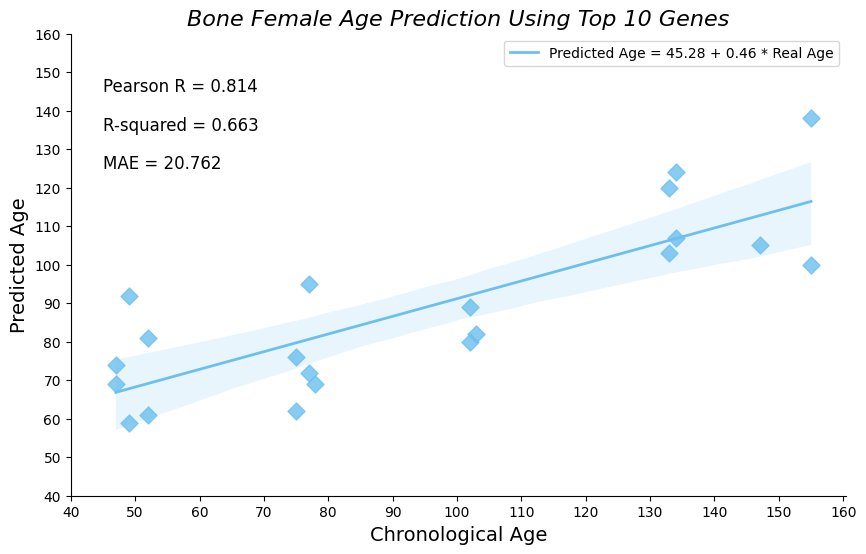


🔬 Performance for Gene Number: 15
Pearson R: 0.697
R-squared: 0.486
MAE: 22.333


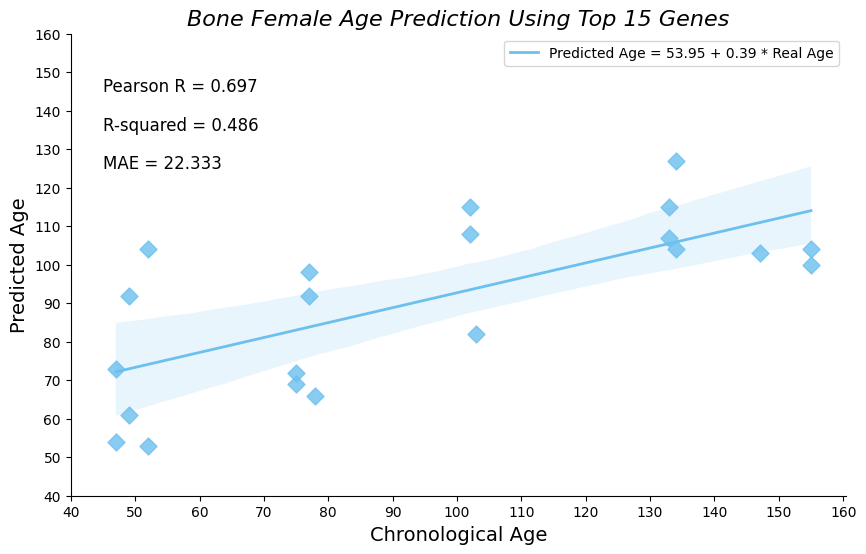


🔬 Performance for Gene Number: 20
Pearson R: 0.289
R-squared: 0.083
MAE: 31.048


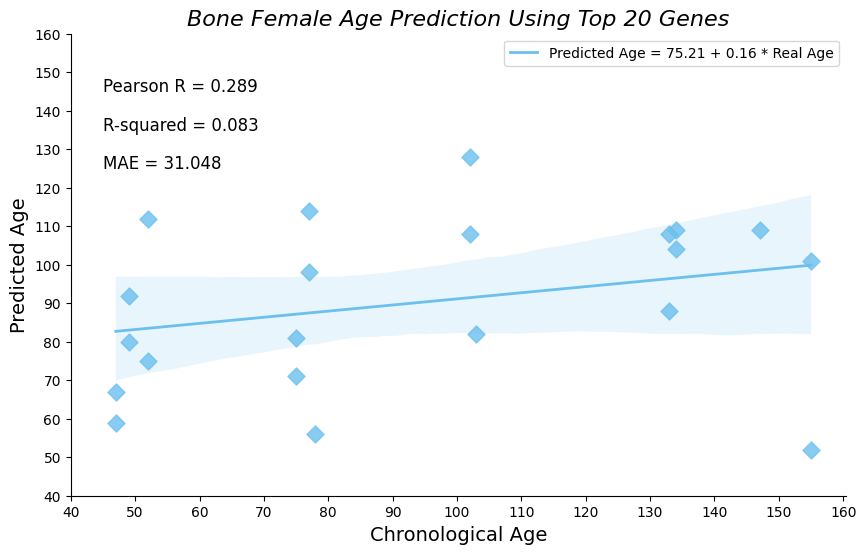


🔬 Performance for Gene Number: 25
Pearson R: 0.343
R-squared: 0.118
MAE: 28.429


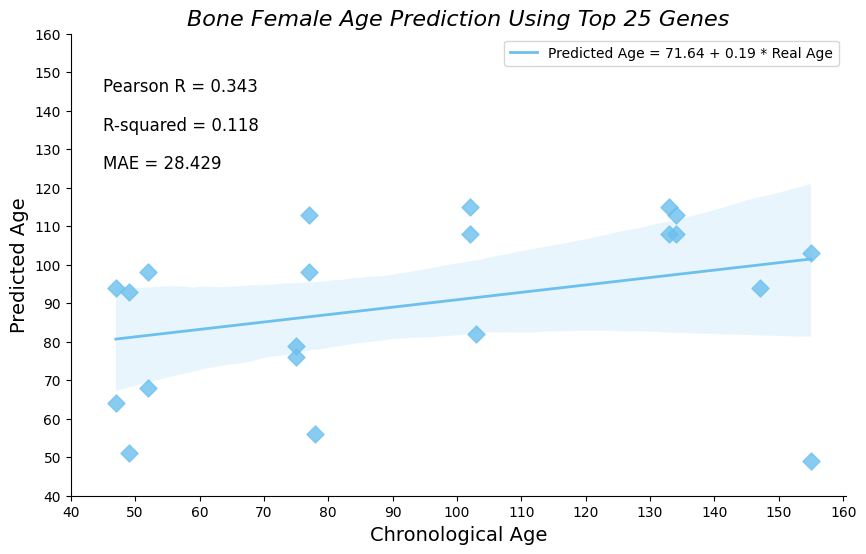


🔬 Performance for Gene Number: 30
Pearson R: 0.373
R-squared: 0.139
MAE: 27.524


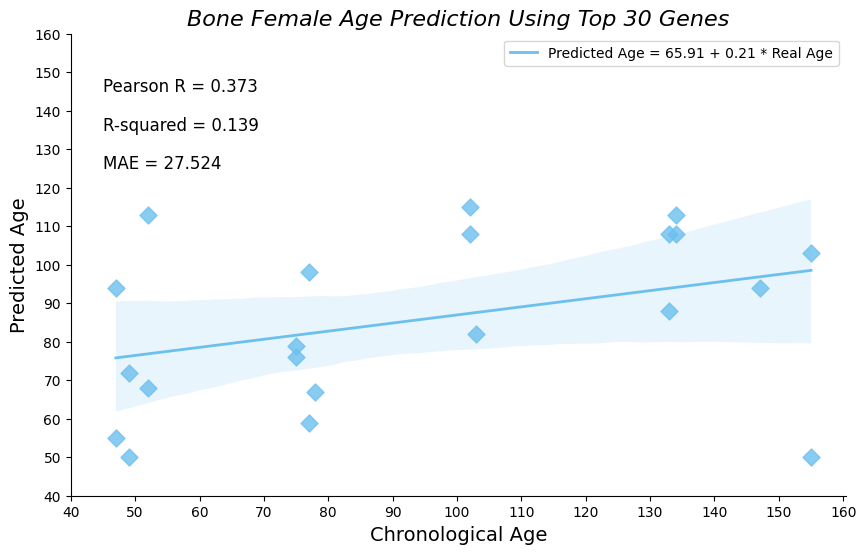


🔬 Performance for Gene Number: 35
Pearson R: 0.241
R-squared: 0.058
MAE: 29.095


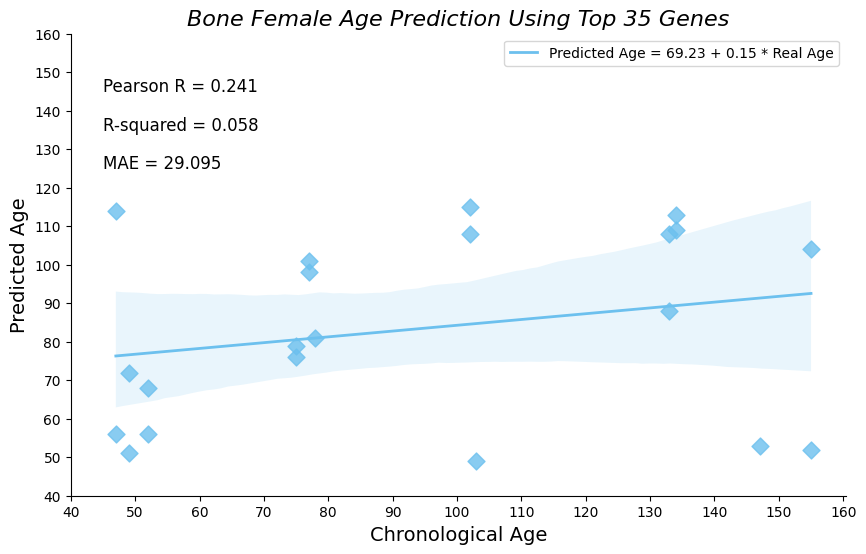


🔬 Performance for Gene Number: 40
Pearson R: 0.481
R-squared: 0.231
MAE: 25.095


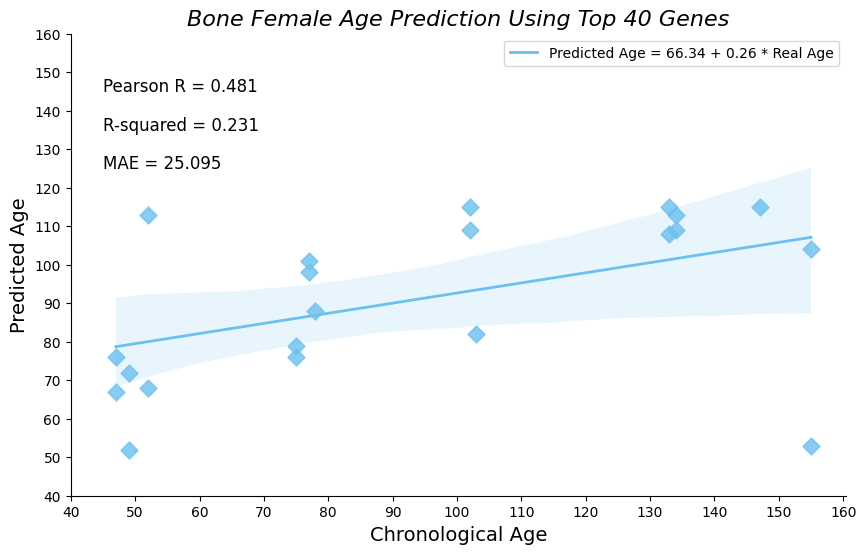


🔬 Performance for Gene Number: 45
Pearson R: 0.508
R-squared: 0.258
MAE: 24.762


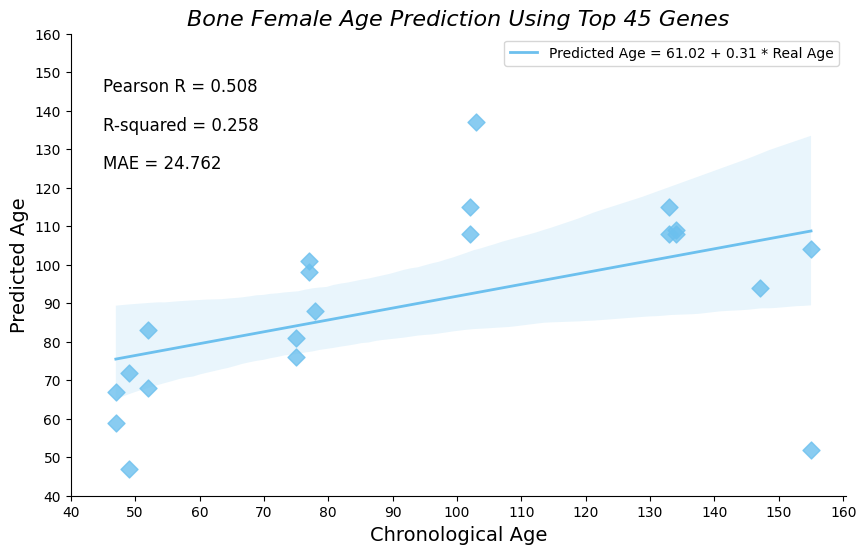


🔬 Performance for Gene Number: 50
Pearson R: 0.276
R-squared: 0.076
MAE: 29.238


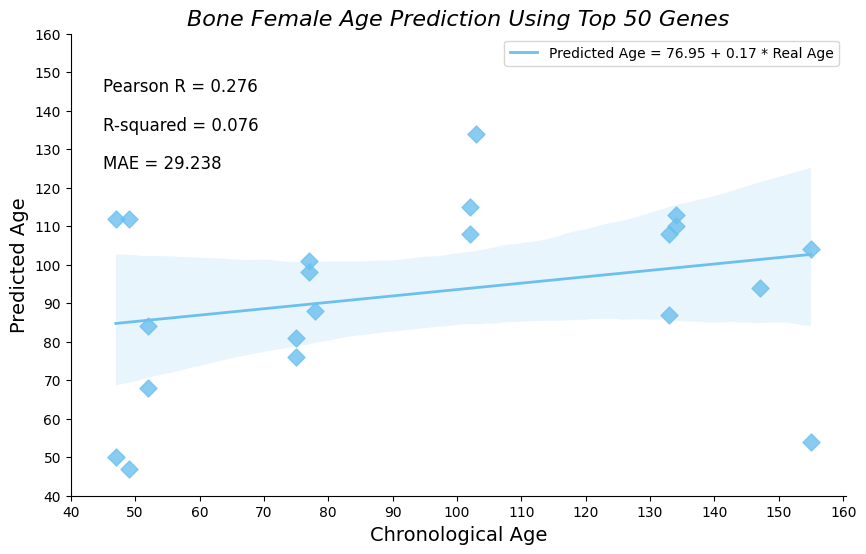


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.814
R-squared: 0.663
MAE: 20.762
Slope: 0.459
Intercept: 45.282


In [35]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    bone_predicted_ages = pd.DataFrame(index=bone_df_female_age.index, columns=["prediction"])

    for sample in bone_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"./female/bone/reference/bone_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_bone_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_bone_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        bone_predicted_ages.loc[sample, "prediction"] = max_probability_age

    bone_predicted_ages["true_age"] = bone_df_female_age["age"].tolist()
    bone_predicted_ages['age'] = pd.to_numeric(bone_predicted_ages['true_age'], errors='coerce')
    bone_predicted_ages['prediction'] = pd.to_numeric(bone_predicted_ages['prediction'], errors='coerce')
    bone_df_female_predictions = bone_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        bone_df_female_predictions['age'], bone_df_female_predictions['prediction']
    )

    bone_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(bone_df_female_predictions['age'], bone_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": bone_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {bone_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=bone_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {bone_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Bone Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

### Male

In [32]:
bone_df_male = bone_df_counts.loc[bone_df_counts.iloc[:,-3] == "M"]

bone_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A1_2,52,585,502,537,709,674,1385,2329,652,646,...,153,1118,27,966,3871,275,364,M,Bone,78
A2_2,18,404,134,224,317,421,1034,2230,491,372,...,78,548,16,421,2675,316,302,M,Bone,133
A4_2,22,463,139,454,328,434,625,1153,621,354,...,175,543,50,403,2953,133,180,M,Bone,77
B1_2,1804,294,154,355,302,457,661,1398,470,299,...,20,425,85,488,1735,83,184,M,Bone,134
B2_2,864,490,182,688,438,608,996,1655,478,506,...,82,795,83,769,4177,339,393,M,Bone,152


In [33]:
age_days_value_counts_male = bone_df_male["age_days"].value_counts().index.tolist()

In [34]:
bone_age_steps_male = sorted(age_days_value_counts_male)

In [35]:
bone_gene_expression_data_male = bone_df_male.iloc[:,:-3]

In [36]:
bone_df_male_age = bone_gene_expression_data_male.copy()

In [37]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
bone_df_male_age["age"] = bone_df_male["age_days"].tolist()

In [38]:
#for sample in bone_df_male_age.index.tolist():

#    new_df = bone_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/bone/sample/bone_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [39]:
bone_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [40]:
new_bone_age_steps_male = np.arange(min(bone_age_steps_male), max(bone_age_steps_male) + 1, 1)

In [41]:
#counter = 0

#for sample in bone_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/bone/sample/bone_male_{sample}.csv",
#                            reference_name=f"bone_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/bone/reference/",
#                            age_prediction="list",
#                            age_list=new_bone_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.425
R-squared: 0.181
MAE: 31.800


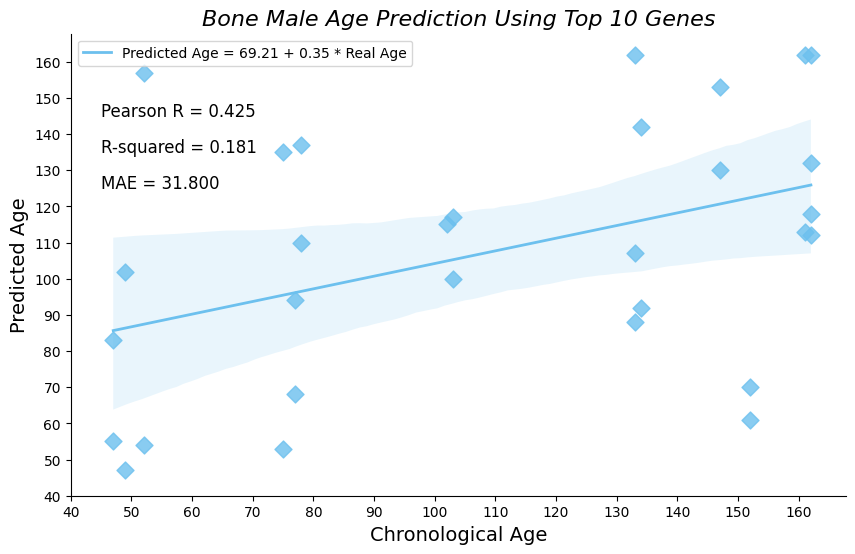


🔬 Performance for Gene Number: 15
Pearson R: 0.489
R-squared: 0.239
MAE: 29.467


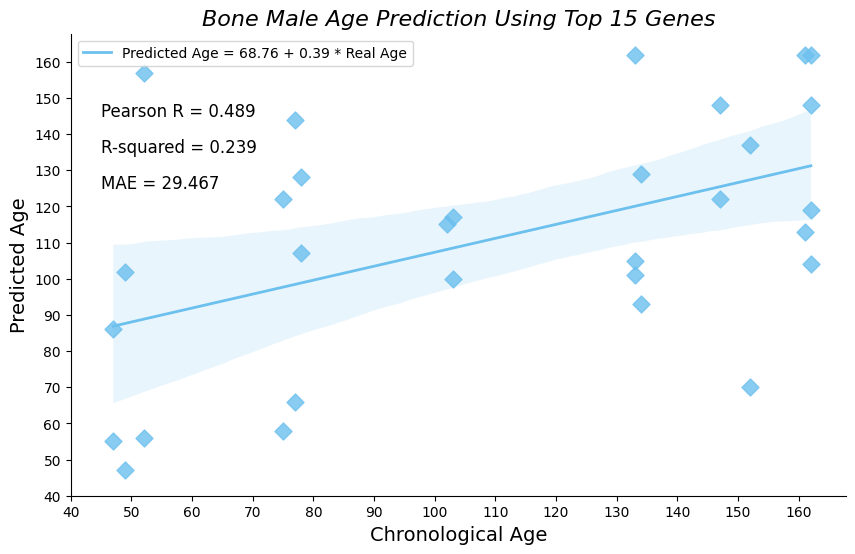


🔬 Performance for Gene Number: 20
Pearson R: 0.608
R-squared: 0.370
MAE: 26.100


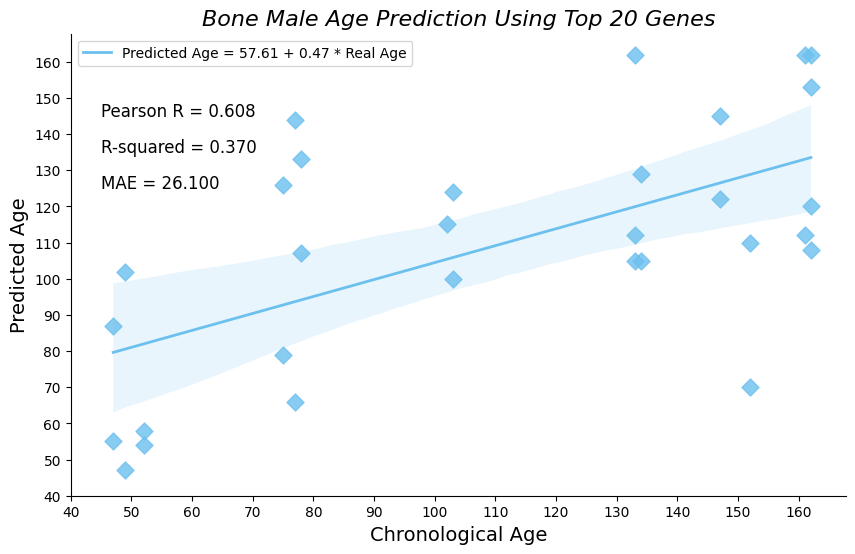


🔬 Performance for Gene Number: 25
Pearson R: 0.595
R-squared: 0.354
MAE: 25.433


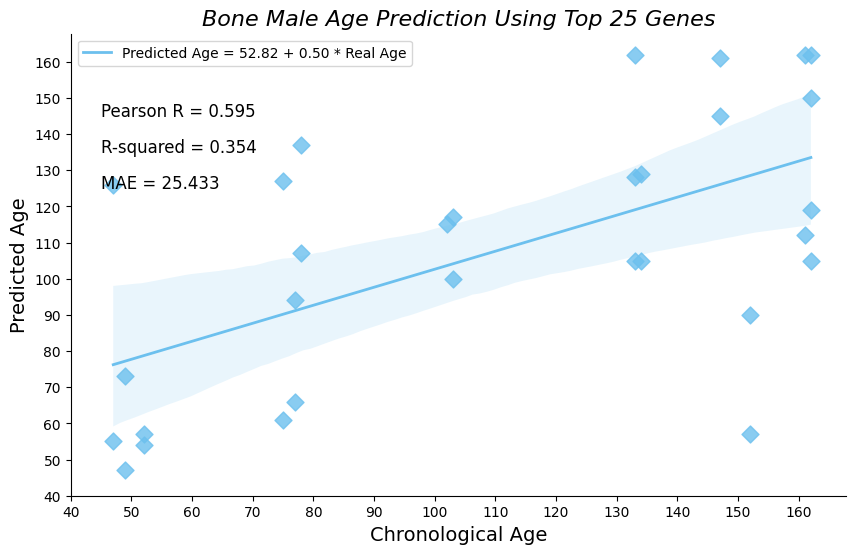


🔬 Performance for Gene Number: 30
Pearson R: 0.739
R-squared: 0.546
MAE: 21.533


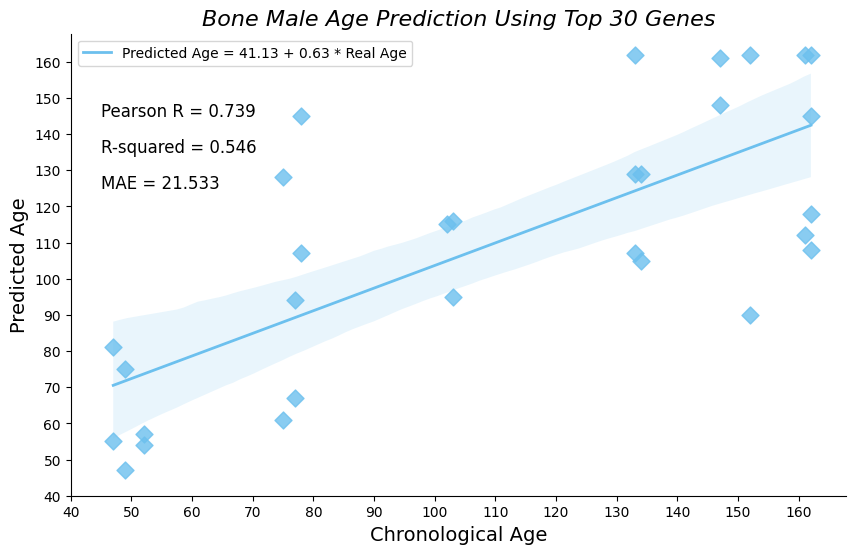


🔬 Performance for Gene Number: 35
Pearson R: 0.690
R-squared: 0.476
MAE: 22.433


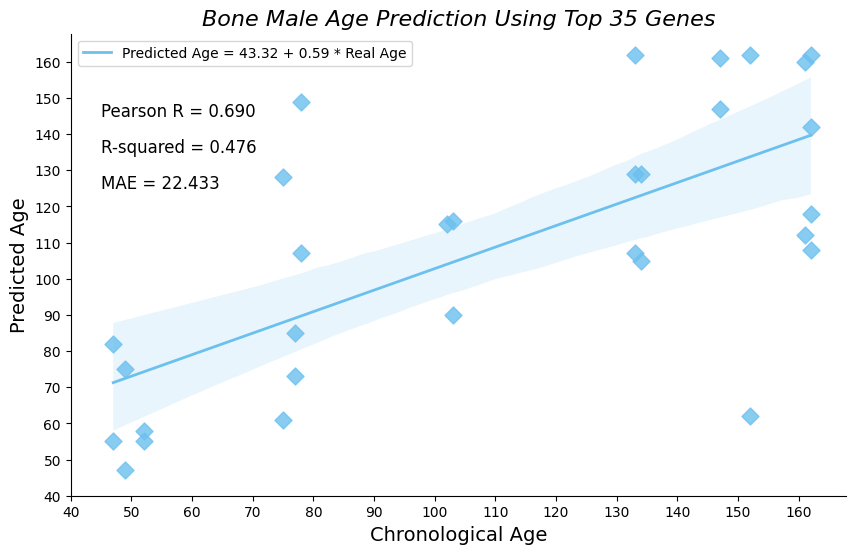


🔬 Performance for Gene Number: 40
Pearson R: 0.697
R-squared: 0.486
MAE: 22.633


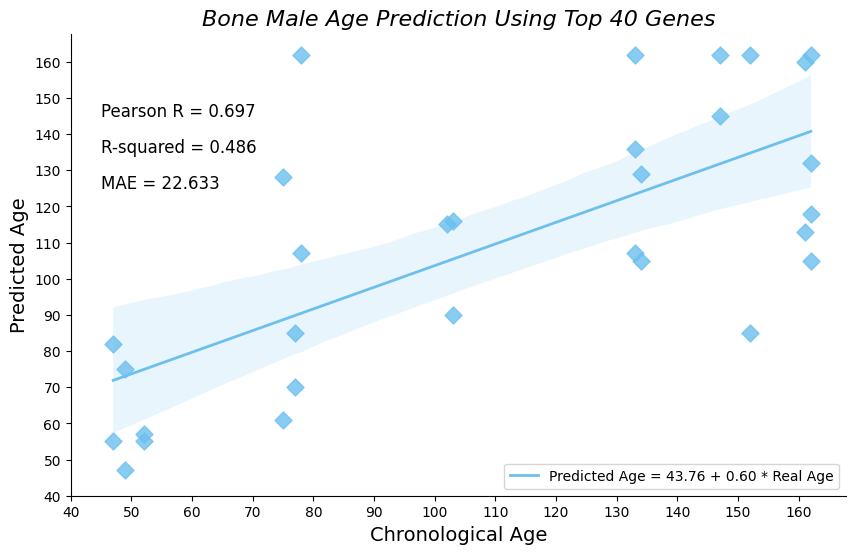


🔬 Performance for Gene Number: 45
Pearson R: 0.694
R-squared: 0.482
MAE: 22.967


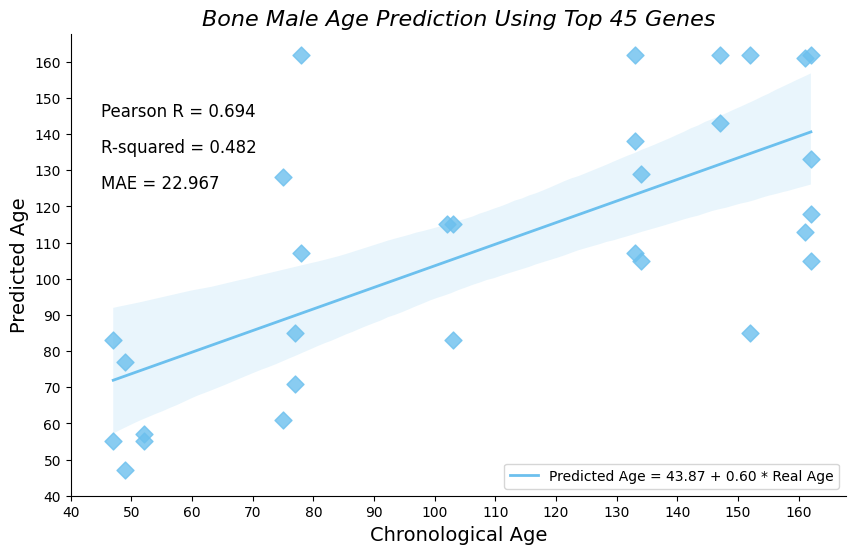


🔬 Performance for Gene Number: 50
Pearson R: 0.704
R-squared: 0.496
MAE: 23.767


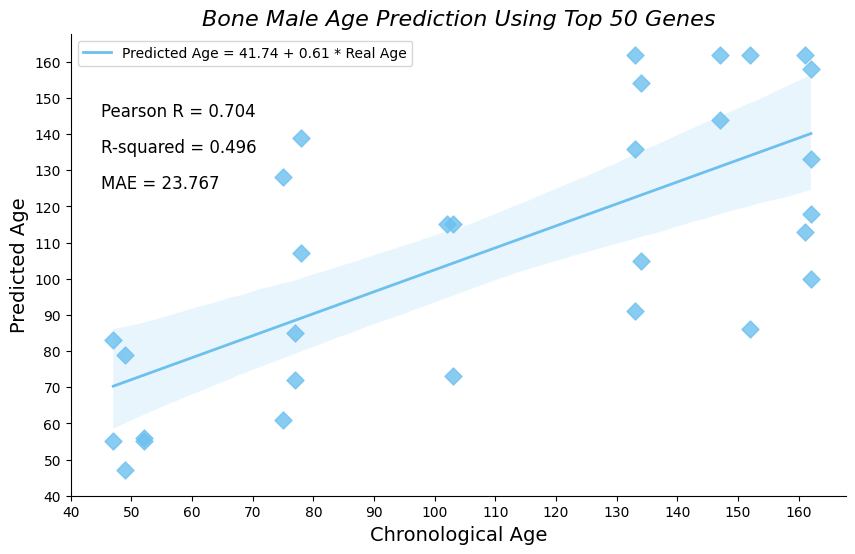


✅ Best Performing Clock (Based on Lowest MAE):
Top 30 Genes
Pearson R: 0.739
R-squared: 0.546
MAE: 21.533
Slope: 0.625
Intercept: 41.132


In [42]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    bone_predicted_ages = pd.DataFrame(index=bone_df_male_age.index, columns=["prediction"])

    for sample in bone_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/bone/reference/bone_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_bone_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_bone_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        bone_predicted_ages.loc[sample, "prediction"] = max_probability_age

    bone_predicted_ages["true_age"] = bone_df_male_age["age"].tolist()
    bone_predicted_ages['age'] = pd.to_numeric(bone_predicted_ages['true_age'], errors='coerce')
    bone_predicted_ages['prediction'] = pd.to_numeric(bone_predicted_ages['prediction'], errors='coerce')
    bone_df_male_predictions = bone_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        bone_df_male_predictions['age'], bone_df_male_predictions['prediction']
    )

    bone_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(bone_df_male_predictions['age'], bone_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": bone_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {bone_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=bone_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {bone_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Bone Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Fat

In [43]:
fat_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Fat"]

fat_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A5_2,4017,132,317,205,106,293,711,322,297,198,...,43,597,26,183,780,128,186,M,Fat,52
A6_2,3879,677,129,461,267,628,974,363,668,484,...,187,682,192,406,3948,245,272,M,Fat,77
A7_2,2848,204,212,202,132,366,886,242,340,159,...,63,666,45,283,1236,169,243,F,Fat,78
A8_2,2692,257,197,297,83,218,627,223,165,148,...,48,462,56,314,884,138,211,M,Fat,103
B5_2,3697,253,262,313,188,411,727,410,329,225,...,41,813,26,299,937,186,208,F,Fat,134


In [44]:
fat_age_days_value_counts = fat_df_counts["age_days"].value_counts().index.tolist()

In [45]:
fat_age_steps = sorted(fat_age_days_value_counts)

print(fat_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [46]:
fat_gene_expression_data = fat_df_counts.iloc[:, :-3]

In [47]:
fat_df_age = fat_gene_expression_data.copy()

In [48]:
fat_df_age["age"] = fat_df_counts["age_days"].tolist()

fat_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A5_2,4017,132,317,205,106,293,711,322,297,198,...,27,468,43,597,26,183,780,128,186,52
A6_2,3879,677,129,461,267,628,974,363,668,484,...,82,1128,187,682,192,406,3948,245,272,77
A7_2,2848,204,212,202,132,366,886,242,340,159,...,47,747,63,666,45,283,1236,169,243,78


#### Female

In [49]:
fat_df_female = fat_df_counts.loc[fat_df_counts.iloc[:,-3] == "F"]

fat_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A7_2,2848,204,212,202,132,366,886,242,340,159,...,63,666,45,283,1236,169,243,F,Fat,78
B5_2,3697,253,262,313,188,411,727,410,329,225,...,41,813,26,299,937,186,208,F,Fat,134
B6_2,1949,184,79,163,156,251,433,387,214,119,...,21,382,33,171,1023,112,176,F,Fat,133
C8_2,555,206,38,107,111,276,110,325,180,99,...,10,222,20,54,306,12,22,F,Fat,47
D5_2,2075,295,85,228,160,368,595,438,332,198,...,48,579,65,211,1512,137,188,F,Fat,102


In [50]:
age_days_value_counts_female = fat_df_female["age_days"].value_counts().index.tolist()

In [51]:
fat_age_steps_female = sorted(age_days_value_counts_female)

In [52]:
fat_gene_expression_data_female = fat_df_female.iloc[:,:-3]

In [53]:
fat_df_female_age = fat_gene_expression_data_female.copy()

In [54]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
fat_df_female_age["age"] = fat_df_female["age_days"].tolist()

In [55]:
#for sample in fat_df_female_age.index.tolist():

#    new_df = fat_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/fat/sample/fat_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [56]:
fat_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [57]:
new_fat_age_steps_female = np.arange(min(fat_age_steps_female), max(fat_age_steps_female) + 1, 1)

### Reference Generation

In [58]:
#counter = 0

#for sample in fat_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/fat/sample/fat_female_{sample}.csv",
#                            reference_name=f"fat_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/fat/reference/",
#                            age_prediction="list",
#                            age_list=new_fat_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.847
R-squared: 0.718
MAE: 15.174


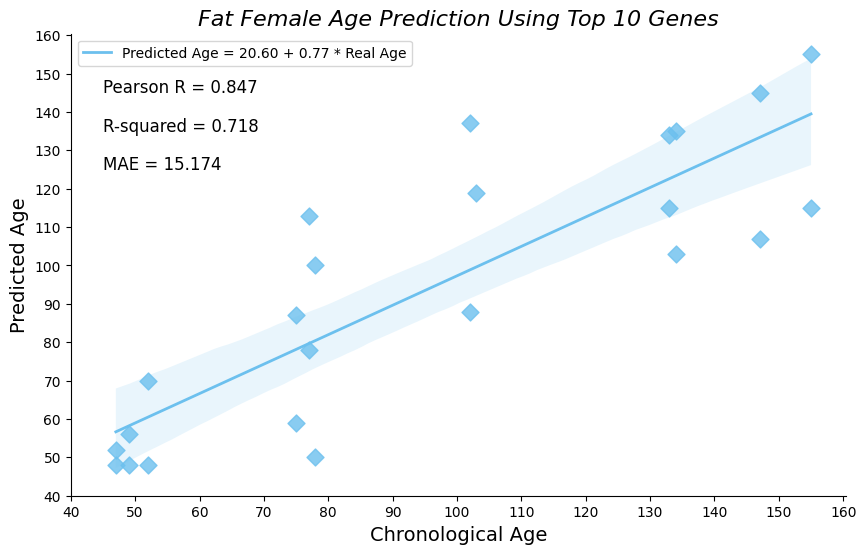


🔬 Performance for Gene Number: 15
Pearson R: 0.764
R-squared: 0.583
MAE: 18.913


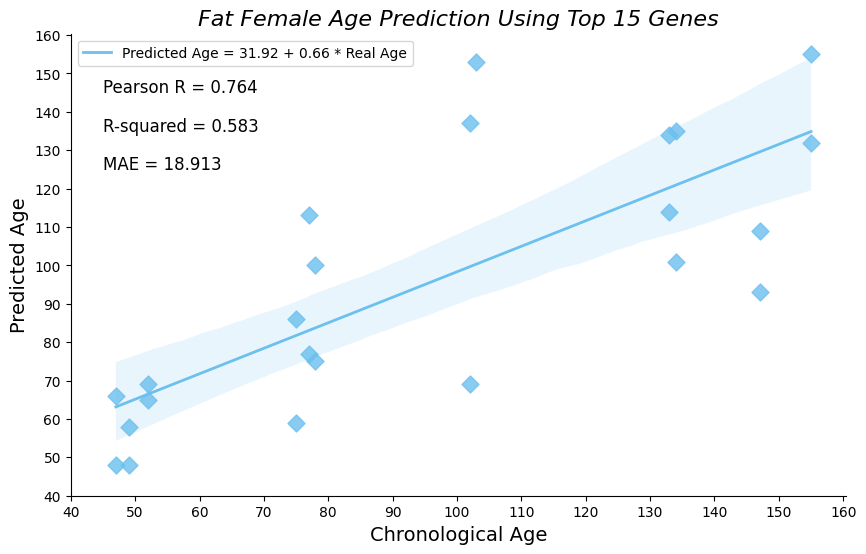


🔬 Performance for Gene Number: 20
Pearson R: 0.809
R-squared: 0.655
MAE: 16.739


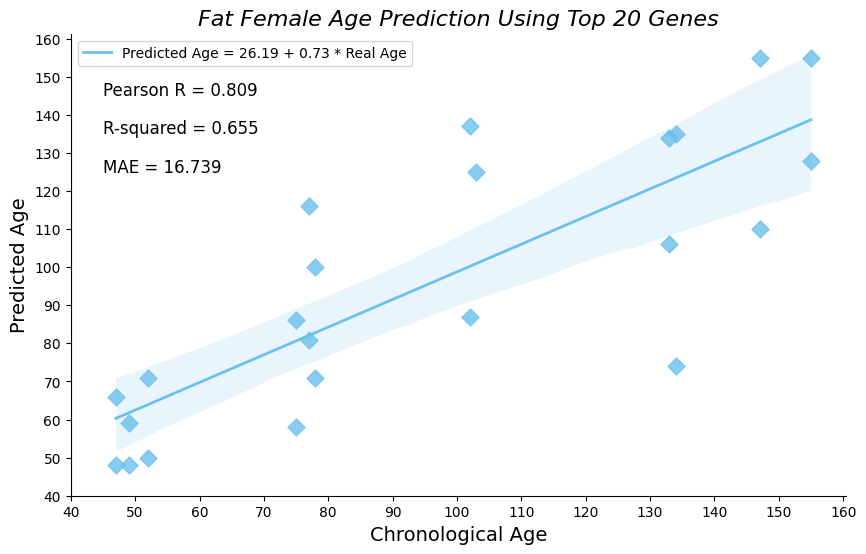


🔬 Performance for Gene Number: 25
Pearson R: 0.807
R-squared: 0.651
MAE: 17.130


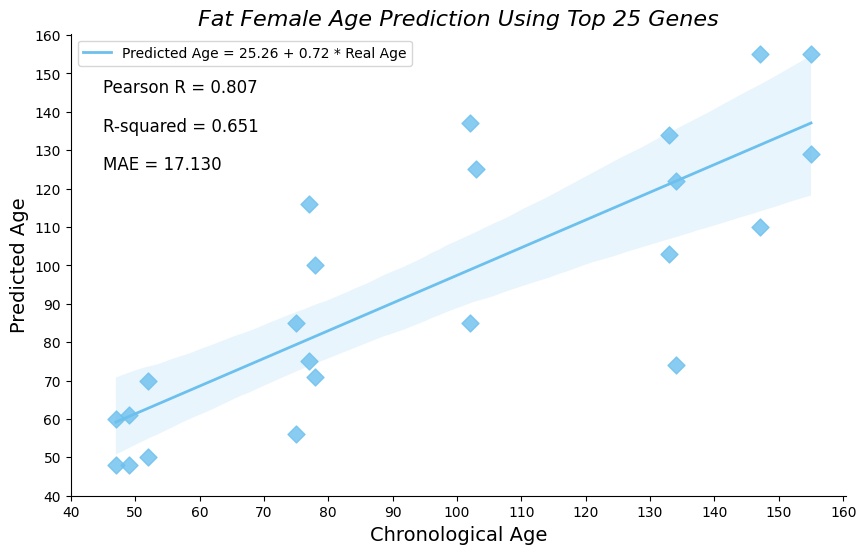


🔬 Performance for Gene Number: 30
Pearson R: 0.795
R-squared: 0.631
MAE: 17.826


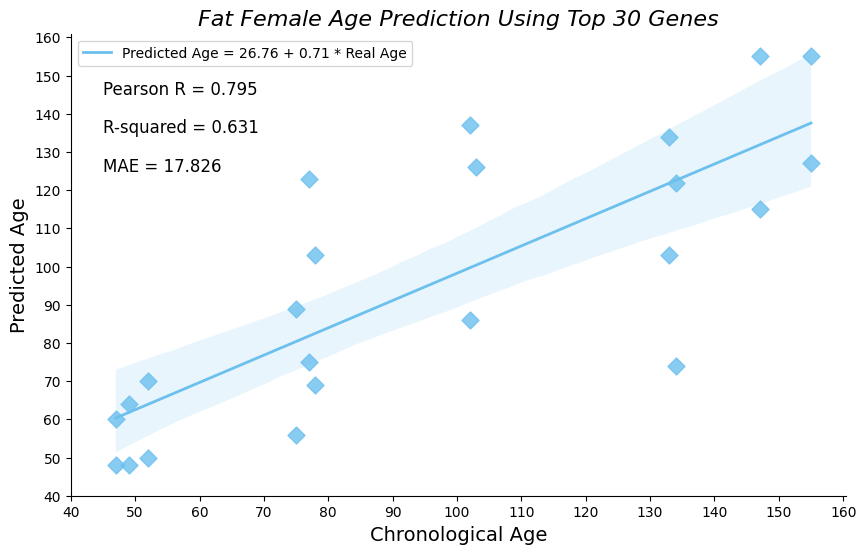


🔬 Performance for Gene Number: 35
Pearson R: 0.797
R-squared: 0.635
MAE: 17.391


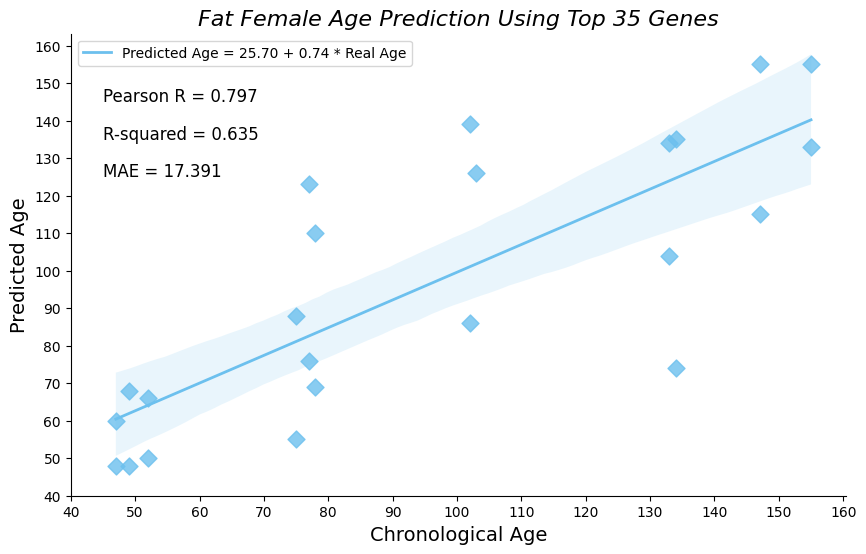


🔬 Performance for Gene Number: 40
Pearson R: 0.831
R-squared: 0.690
MAE: 16.000


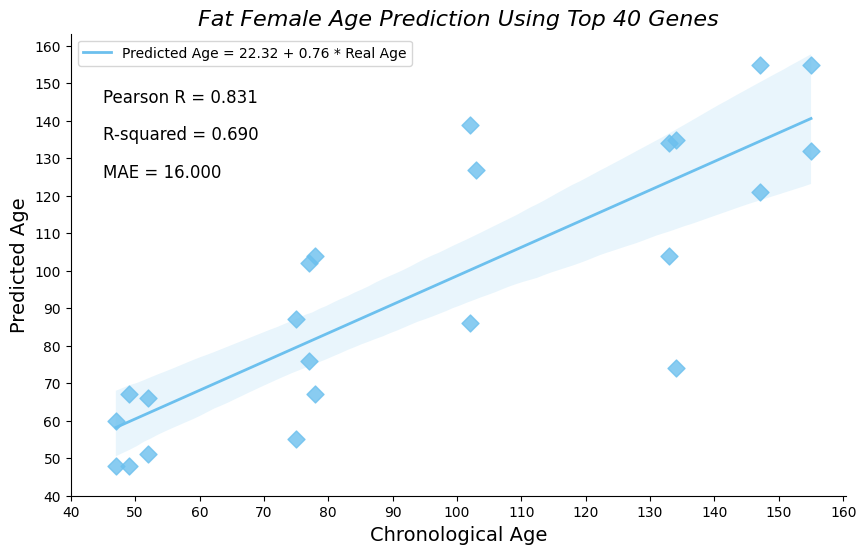


🔬 Performance for Gene Number: 45
Pearson R: 0.835
R-squared: 0.697
MAE: 15.652


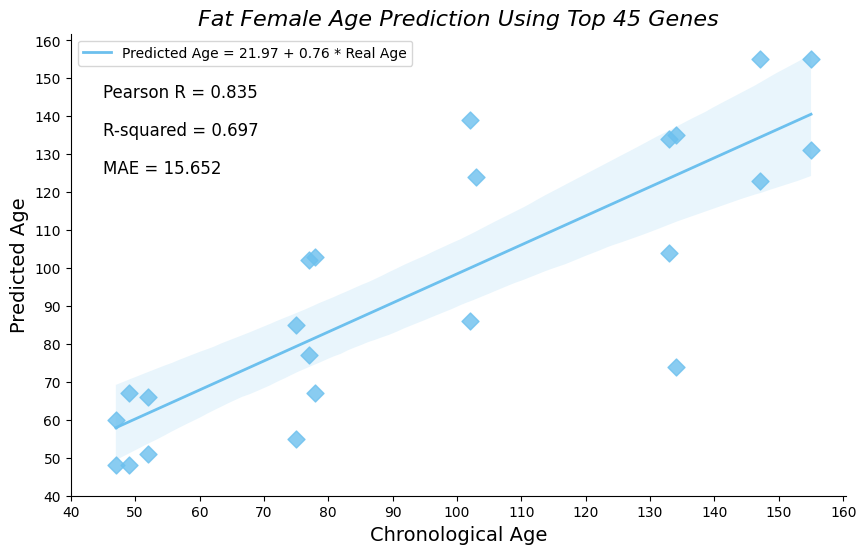


🔬 Performance for Gene Number: 50
Pearson R: 0.836
R-squared: 0.699
MAE: 15.913


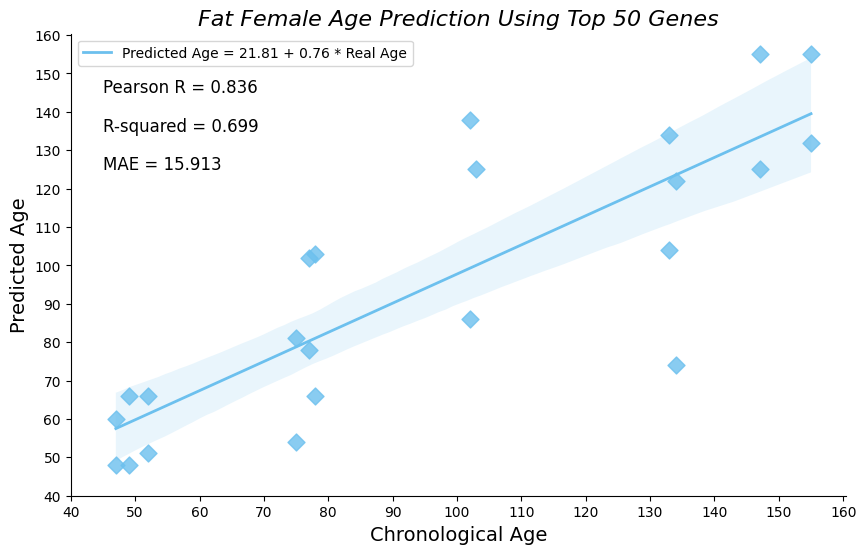


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.847
R-squared: 0.718
MAE: 15.174
Slope: 0.767
Intercept: 20.601


In [59]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    fat_predicted_ages = pd.DataFrame(index=fat_df_female_age.index, columns=["prediction"])

    for sample in fat_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/fat/reference/fat_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_fat_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_fat_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        fat_predicted_ages.loc[sample, "prediction"] = max_probability_age

    fat_predicted_ages["true_age"] = fat_df_female_age["age"].tolist()
    fat_predicted_ages['age'] = pd.to_numeric(fat_predicted_ages['true_age'], errors='coerce')
    fat_predicted_ages['prediction'] = pd.to_numeric(fat_predicted_ages['prediction'], errors='coerce')
    fat_df_female_predictions = fat_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        fat_df_female_predictions['age'], fat_df_female_predictions['prediction']
    )

    fat_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(fat_df_female_predictions['age'], fat_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": fat_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {fat_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=fat_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {fat_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Fat Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [60]:
fat_df_male = fat_df_counts.loc[fat_df_counts.iloc[:,-3] == "M"]

fat_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A5_2,4017,132,317,205,106,293,711,322,297,198,...,43,597,26,183,780,128,186,M,Fat,52
A6_2,3879,677,129,461,267,628,974,363,668,484,...,187,682,192,406,3948,245,272,M,Fat,77
A8_2,2692,257,197,297,83,218,627,223,165,148,...,48,462,56,314,884,138,211,M,Fat,103
B7_2,2362,708,185,463,377,580,833,679,488,622,...,182,819,155,426,4170,253,329,M,Fat,102
B8_2,1579,227,127,178,160,356,497,451,375,183,...,54,520,98,243,1060,111,152,M,Fat,152


In [61]:
age_days_value_counts_male = fat_df_male["age_days"].value_counts().index.tolist()

In [62]:
fat_age_steps_male = sorted(age_days_value_counts_male)

In [63]:
fat_gene_expression_data_male = fat_df_male.iloc[:,:-3]

In [64]:
fat_df_male_age = fat_gene_expression_data_male.copy()

In [65]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
fat_df_male_age["age"] = fat_df_male["age_days"].tolist()

In [66]:
#for sample in fat_df_male_age.index.tolist():

#    new_df = fat_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/fat/sample/fat_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [67]:
fat_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [68]:
new_fat_age_steps_male = np.arange(min(fat_age_steps_male), max(fat_age_steps_male) + 1, 1)

In [69]:
#counter = 0

#for sample in fat_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/fat/sample/fat_male_{sample}.csv",
#                            reference_name=f"fat_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/fat/reference/",
#                            age_prediction="list",
#                            age_list=new_fat_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.658
R-squared: 0.434
MAE: 24.300


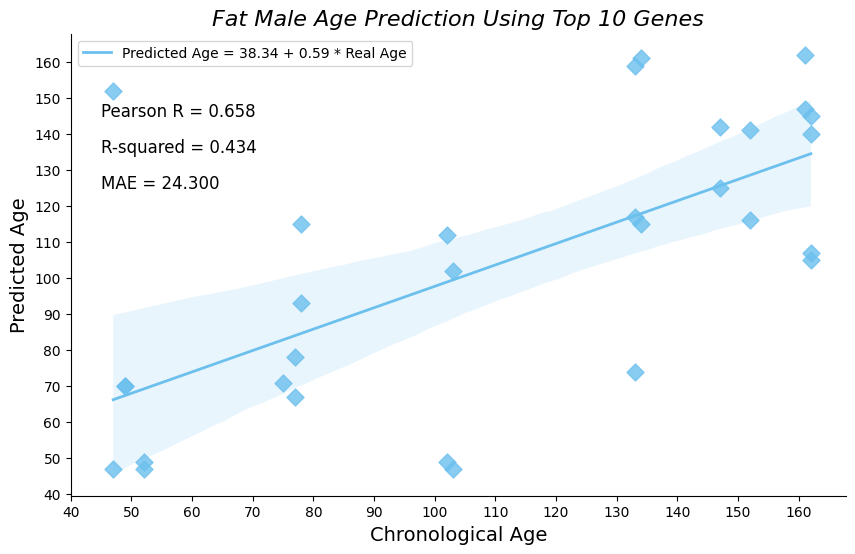


🔬 Performance for Gene Number: 15
Pearson R: 0.585
R-squared: 0.342
MAE: 26.100


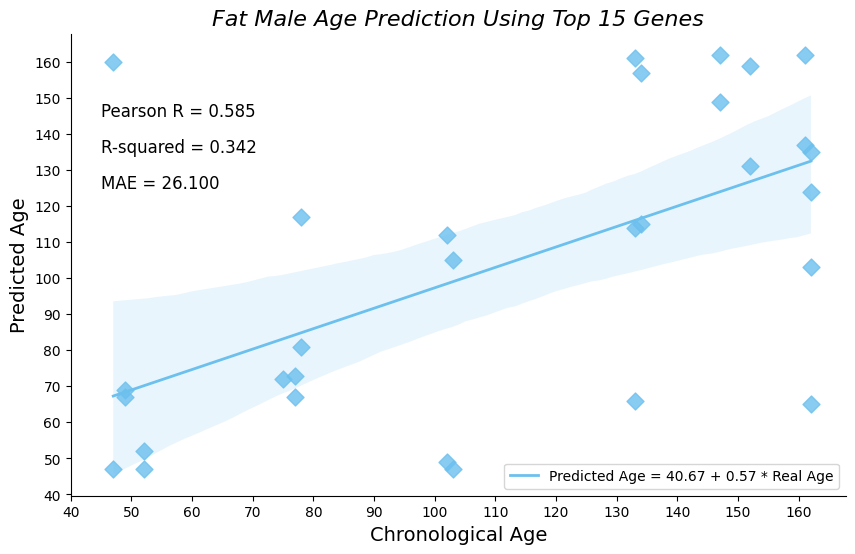


🔬 Performance for Gene Number: 20
Pearson R: 0.476
R-squared: 0.227
MAE: 31.100


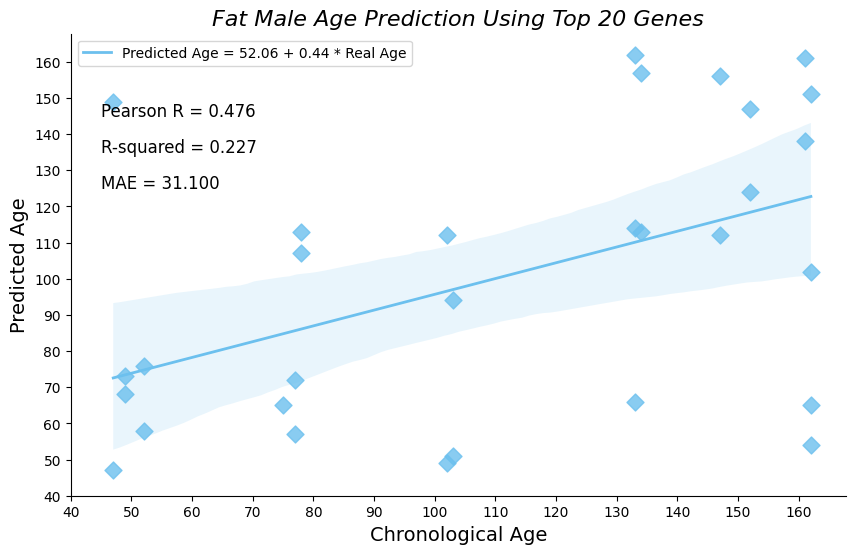


🔬 Performance for Gene Number: 25
Pearson R: 0.482
R-squared: 0.233
MAE: 30.767


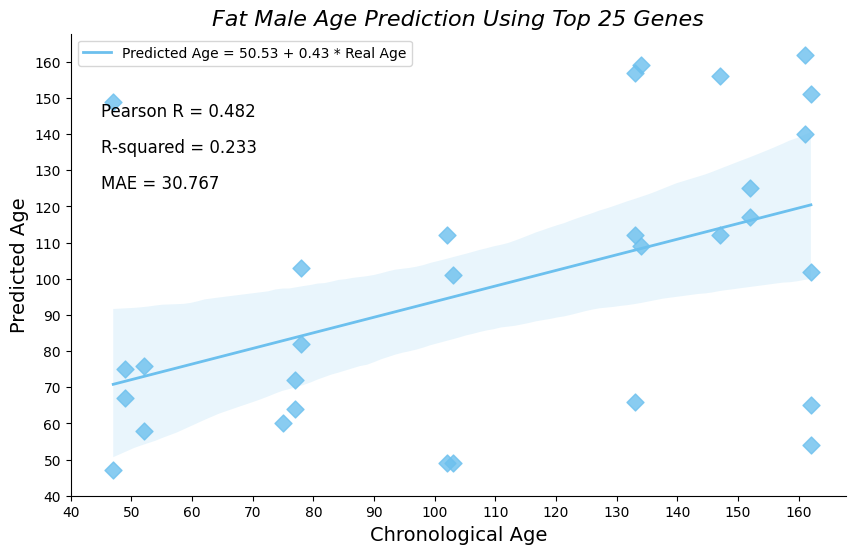


🔬 Performance for Gene Number: 30
Pearson R: 0.494
R-squared: 0.244
MAE: 28.400


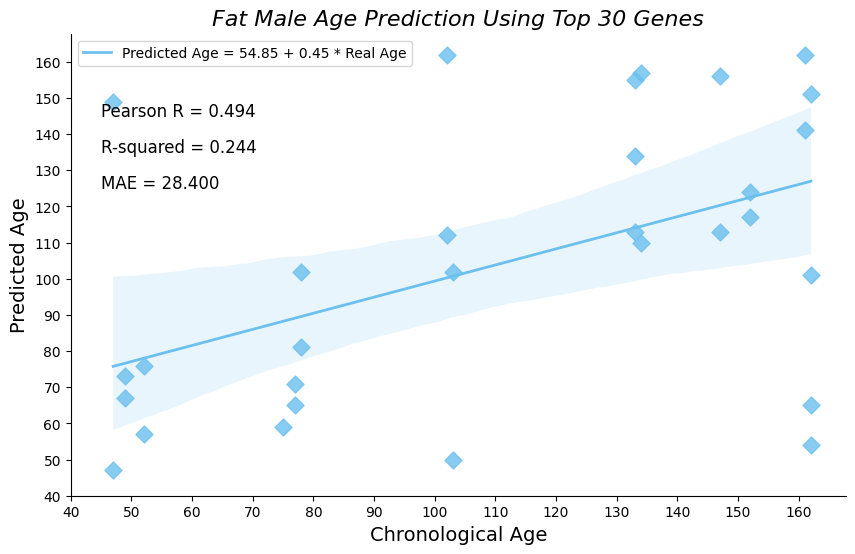


🔬 Performance for Gene Number: 35
Pearson R: 0.459
R-squared: 0.210
MAE: 30.667


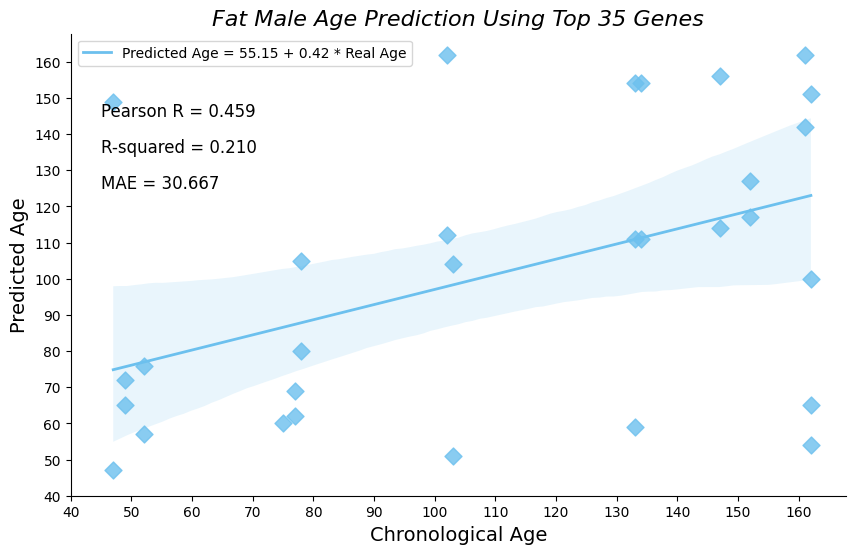


🔬 Performance for Gene Number: 40
Pearson R: 0.494
R-squared: 0.244
MAE: 28.300


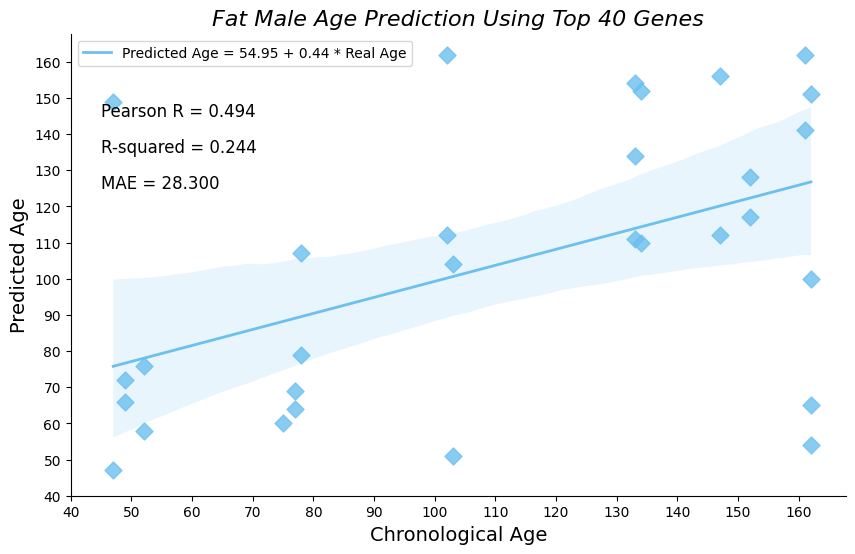


🔬 Performance for Gene Number: 45
Pearson R: 0.497
R-squared: 0.247
MAE: 27.300


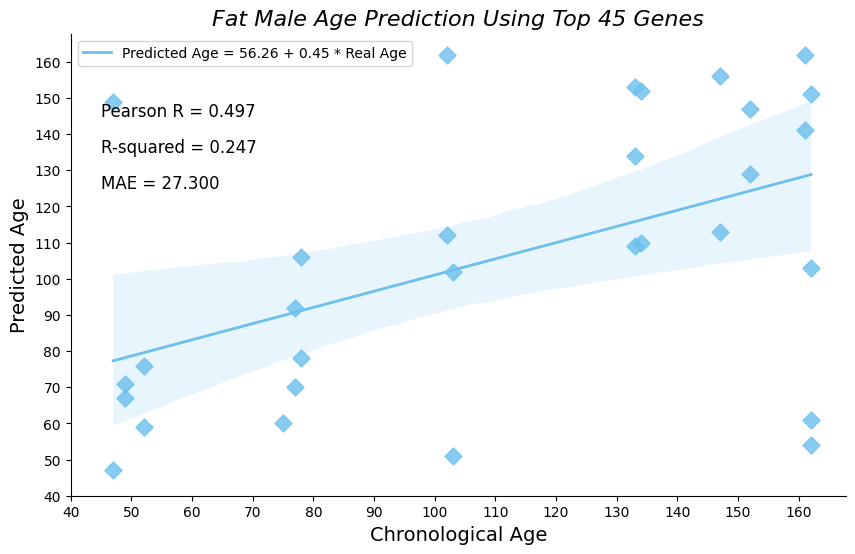


🔬 Performance for Gene Number: 50
Pearson R: 0.471
R-squared: 0.222
MAE: 30.400


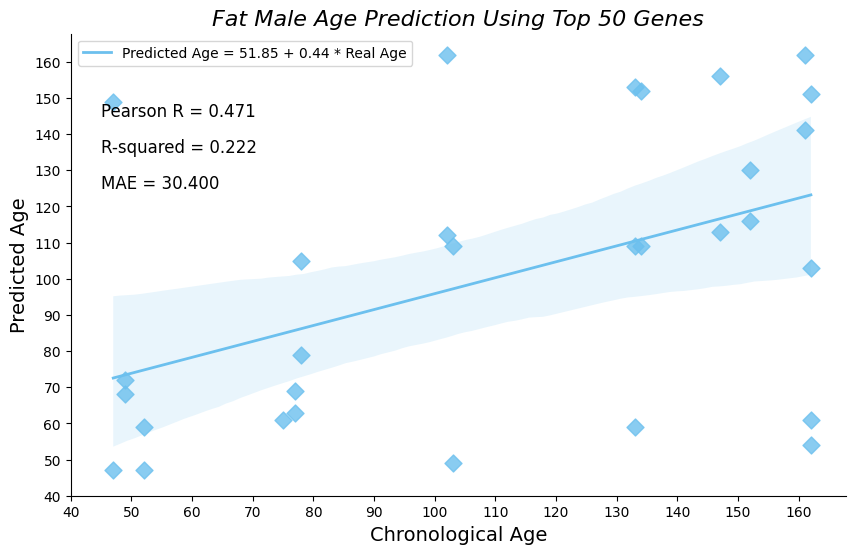


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.658
R-squared: 0.434
MAE: 24.300
Slope: 0.594
Intercept: 38.343


In [70]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    fat_predicted_ages = pd.DataFrame(index=fat_df_male_age.index, columns=["prediction"])

    for sample in fat_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/fat/reference/fat_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_fat_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_fat_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        fat_predicted_ages.loc[sample, "prediction"] = max_probability_age

    fat_predicted_ages["true_age"] = fat_df_male_age["age"].tolist()
    fat_predicted_ages['age'] = pd.to_numeric(fat_predicted_ages['true_age'], errors='coerce')
    fat_predicted_ages['prediction'] = pd.to_numeric(fat_predicted_ages['prediction'], errors='coerce')
    fat_df_male_predictions = fat_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        fat_df_male_predictions['age'], fat_df_male_predictions['prediction']
    )

    fat_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(fat_df_male_predictions['age'], fat_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": fat_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {fat_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=fat_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {fat_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Fat Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Heart

In [71]:
heart_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Heart"]

heart_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_2,30,591,227,627,749,896,1293,1167,781,617,...,249,1493,10,965,4511,265,630,M,Heart,162
A14_2,2,695,245,613,499,833,1037,1386,706,646,...,100,1299,28,715,5683,219,444,M,Heart,103
A15_2,0,712,268,539,435,754,1479,1006,732,584,...,180,1690,94,1296,7531,334,454,M,Heart,103
B13_2,16,474,176,394,360,562,739,1450,435,524,...,154,1187,42,666,3405,184,367,M,Heart,134
B14_2,118,985,353,692,816,932,1622,1390,863,928,...,262,2512,167,1303,7114,466,630,M,Heart,47


In [72]:
heart_age_days_value_counts = heart_df_counts["age_days"].value_counts().index.tolist()

In [73]:
heart_age_steps = sorted(heart_age_days_value_counts)

print(heart_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [74]:
heart_gene_expression_data = heart_df_counts.iloc[:, :-3]

In [75]:
heart_df_age = heart_gene_expression_data.copy()

In [76]:
heart_df_age["age"] = heart_df_counts["age_days"].tolist()

heart_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_2,30,591,227,627,749,896,1293,1167,781,617,...,79,1736,249,1493,10,965,4511,265,630,162
A14_2,2,695,245,613,499,833,1037,1386,706,646,...,104,1456,100,1299,28,715,5683,219,444,103
A15_2,0,712,268,539,435,754,1479,1006,732,584,...,79,2068,180,1690,94,1296,7531,334,454,103


#### Female

In [77]:
heart_df_female = heart_df_counts.loc[heart_df_counts.iloc[:,-3] == "F"]

heart_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
B15_2,2,1398,460,920,1354,1140,1664,1530,1240,1164,...,262,2611,186,1295,7184,610,647,F,Heart,75
B16_2,0,679,237,684,777,950,1449,2292,780,809,...,164,1379,12,1037,8293,303,609,F,Heart,103
C15_2,0,1174,442,635,1033,1043,1435,1103,741,882,...,253,2687,234,1063,7136,568,553,F,Heart,75
D14_2,30,845,236,684,726,1123,1291,2380,855,693,...,134,1660,4,1034,7294,516,743,F,Heart,133
D16_2,2,544,482,521,638,846,1128,1123,767,585,...,150,1904,57,876,12017,419,581,F,Heart,47


In [78]:
age_days_value_counts_female = heart_df_female["age_days"].value_counts().index.tolist()

In [79]:
heart_age_steps_female = sorted(age_days_value_counts_female)

In [80]:
heart_gene_expression_data_female = heart_df_female.iloc[:,:-3]

In [81]:
heart_df_female_age = heart_gene_expression_data_female.copy()

In [82]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
heart_df_female_age["age"] = heart_df_female["age_days"].tolist()

In [83]:
#for sample in heart_df_female_age.index.tolist():

#    new_df = heart_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/heart/sample/heart_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [84]:
heart_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [85]:
new_heart_age_steps_female = np.arange(min(heart_age_steps_female), max(heart_age_steps_female) + 1, 1)

In [86]:
new_heart_age_steps_female

array([ 47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,
        60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,
        73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
        86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,
        99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
       112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,
       125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137,
       138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150,
       151, 152, 153, 154, 155])

#### Reference Generation

In [87]:
#counter = 0

#for sample in heart_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/heart/sample/heart_female_{sample}.csv",
#                            reference_name=f"heart_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/heart/reference/",
#                            age_prediction="list",
#                            age_list=new_heart_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.705
R-squared: 0.497
MAE: 19.773


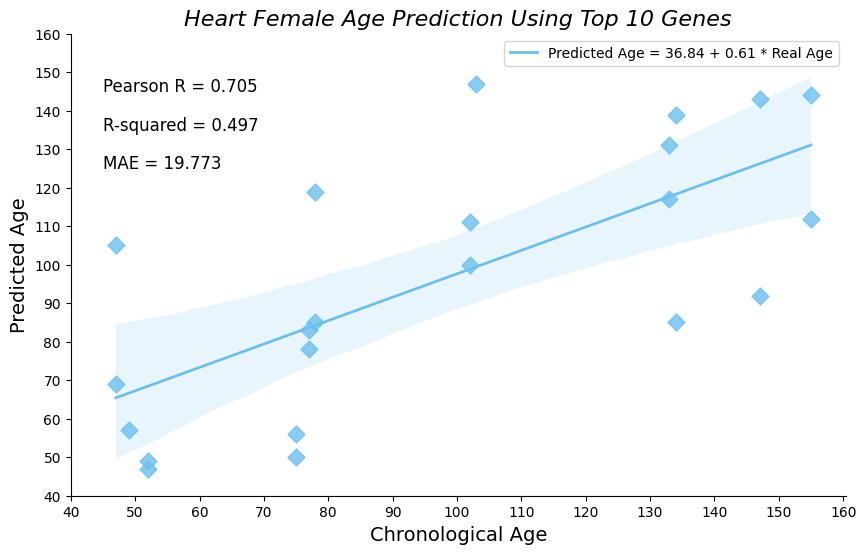


🔬 Performance for Gene Number: 15
Pearson R: 0.497
R-squared: 0.247
MAE: 28.500


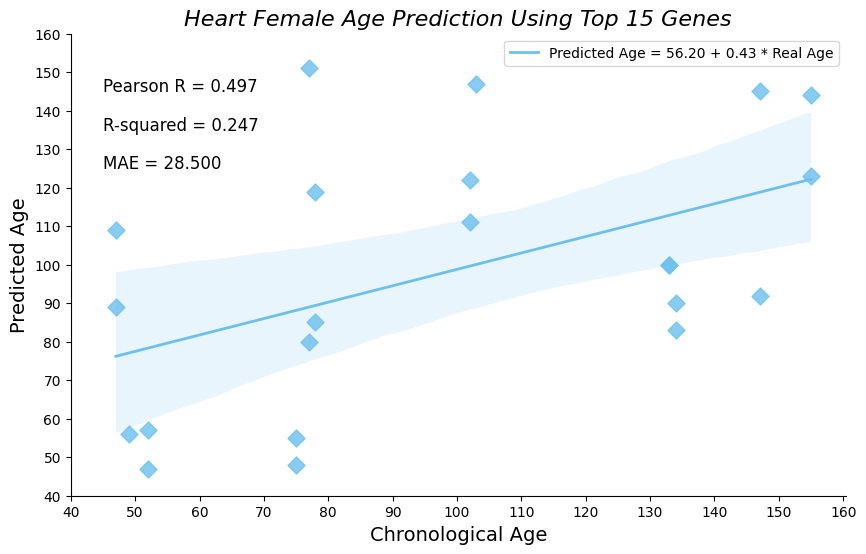


🔬 Performance for Gene Number: 20
Pearson R: 0.511
R-squared: 0.262
MAE: 28.227


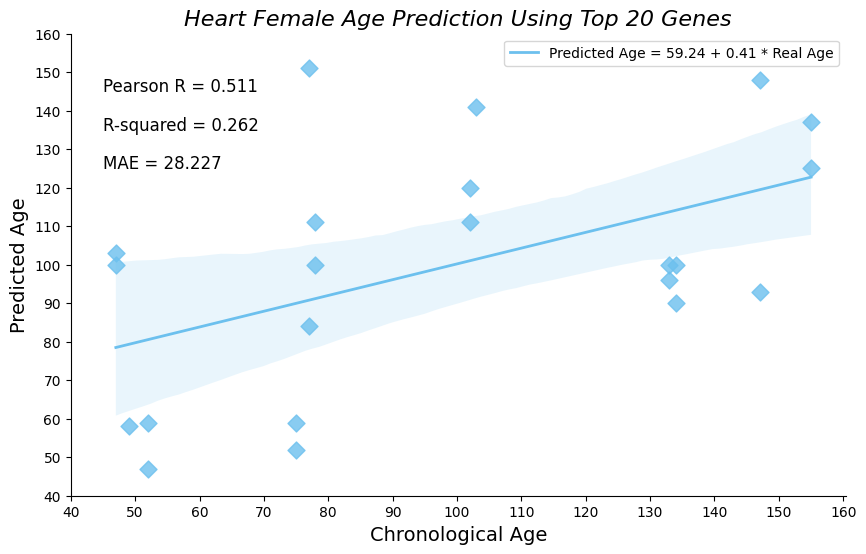


🔬 Performance for Gene Number: 25
Pearson R: 0.485
R-squared: 0.235
MAE: 28.364


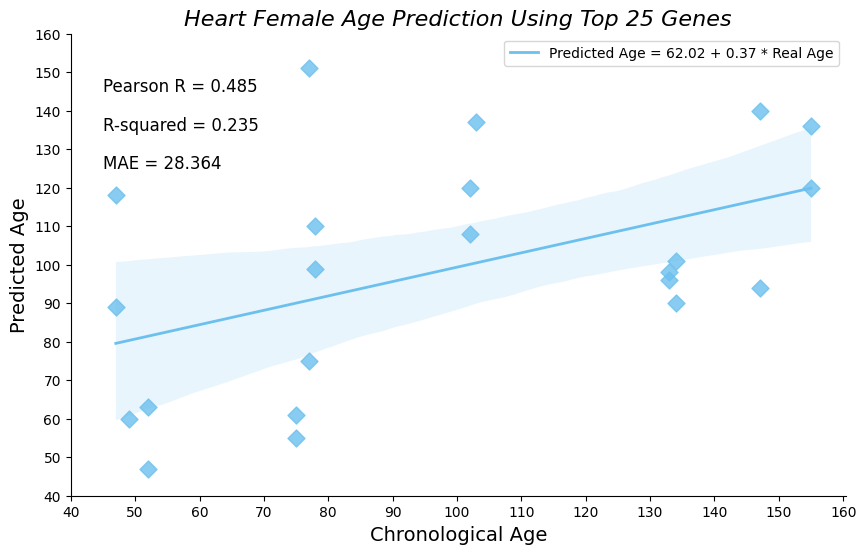


🔬 Performance for Gene Number: 30
Pearson R: 0.472
R-squared: 0.223
MAE: 27.636


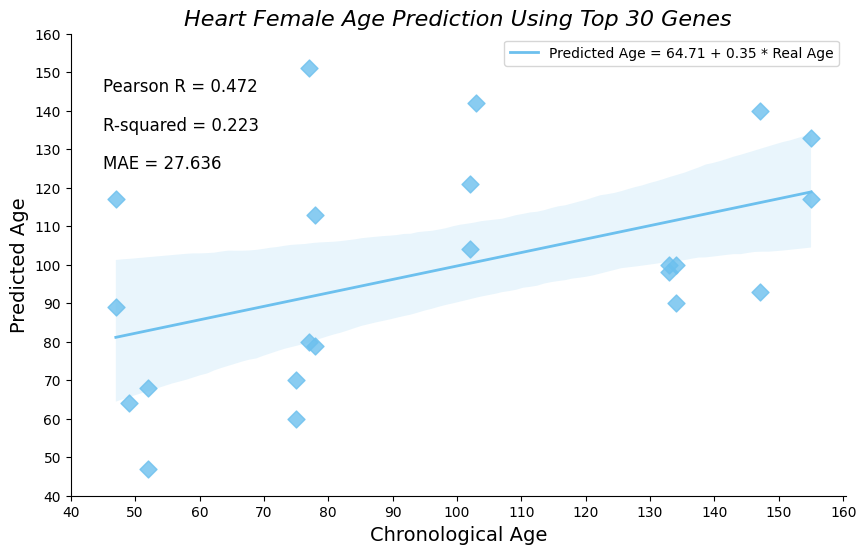


🔬 Performance for Gene Number: 35
Pearson R: 0.487
R-squared: 0.237
MAE: 28.682


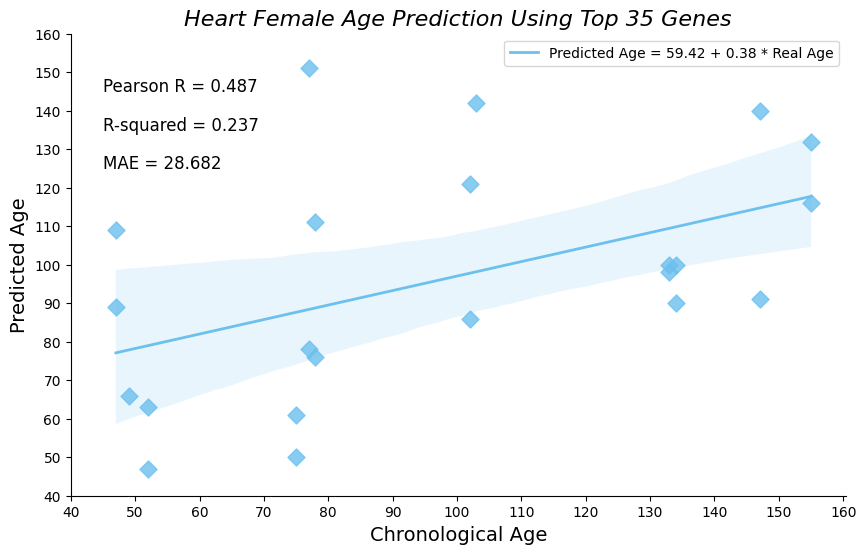


🔬 Performance for Gene Number: 40
Pearson R: 0.468
R-squared: 0.219
MAE: 28.727


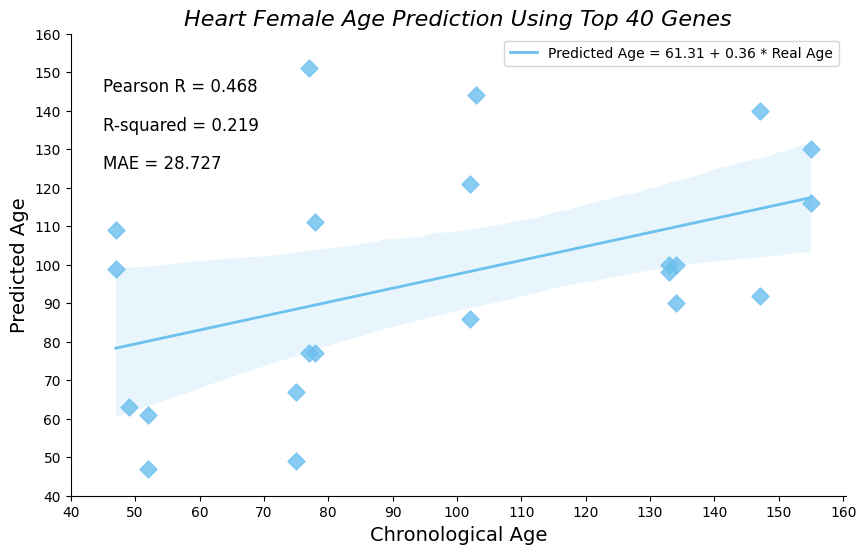


🔬 Performance for Gene Number: 45
Pearson R: 0.484
R-squared: 0.235
MAE: 28.909


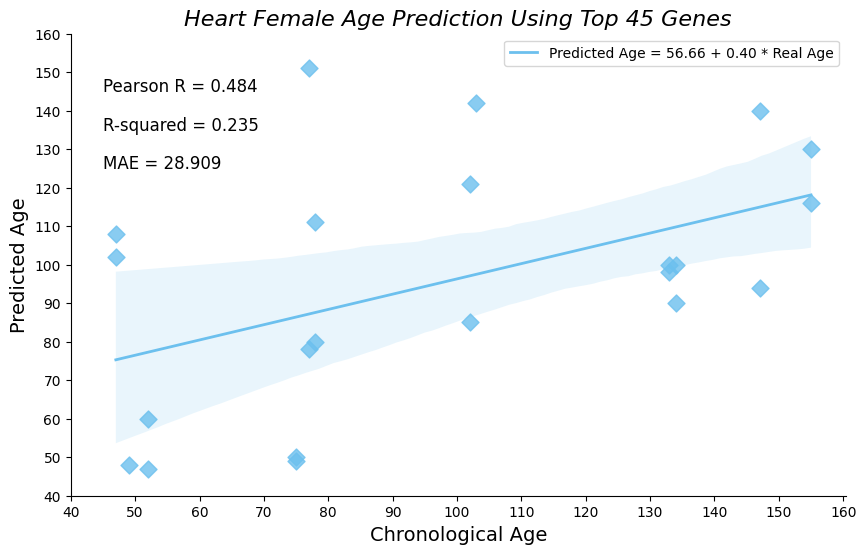


🔬 Performance for Gene Number: 50
Pearson R: 0.488
R-squared: 0.238
MAE: 28.545


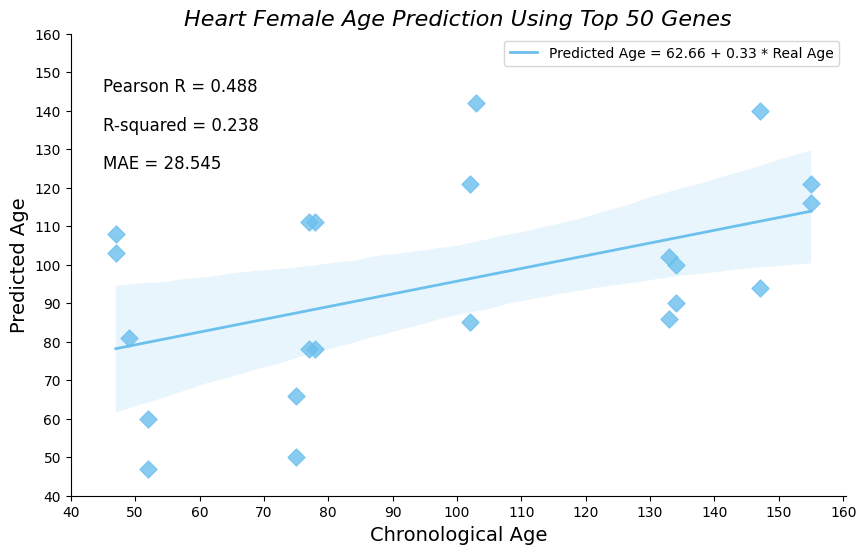


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.705
R-squared: 0.497
MAE: 19.773
Slope: 0.608
Intercept: 36.840


In [88]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    heart_predicted_ages = pd.DataFrame(index=heart_df_female_age.index, columns=["prediction"])

    for sample in heart_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/heart/reference/heart_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_heart_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_heart_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        heart_predicted_ages.loc[sample, "prediction"] = max_probability_age

    heart_predicted_ages["true_age"] = heart_df_female_age["age"].tolist()
    heart_predicted_ages['age'] = pd.to_numeric(heart_predicted_ages['true_age'], errors='coerce')
    heart_predicted_ages['prediction'] = pd.to_numeric(heart_predicted_ages['prediction'], errors='coerce')
    heart_df_female_predictions = heart_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        heart_df_female_predictions['age'], heart_df_female_predictions['prediction']
    )

    heart_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(heart_df_female_predictions['age'], heart_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": heart_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {heart_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=heart_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {heart_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Heart Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [89]:
heart_df_male = heart_df_counts.loc[heart_df_counts.iloc[:,-3] == "M"]

heart_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_2,30,591,227,627,749,896,1293,1167,781,617,...,249,1493,10,965,4511,265,630,M,Heart,162
A14_2,2,695,245,613,499,833,1037,1386,706,646,...,100,1299,28,715,5683,219,444,M,Heart,103
A15_2,0,712,268,539,435,754,1479,1006,732,584,...,180,1690,94,1296,7531,334,454,M,Heart,103
B13_2,16,474,176,394,360,562,739,1450,435,524,...,154,1187,42,666,3405,184,367,M,Heart,134
B14_2,118,985,353,692,816,932,1622,1390,863,928,...,262,2512,167,1303,7114,466,630,M,Heart,47


In [90]:
age_days_value_counts_male = heart_df_male["age_days"].value_counts().index.tolist()

In [91]:
heart_age_steps_male = sorted(age_days_value_counts_male)

In [92]:
heart_gene_expression_data_male = heart_df_male.iloc[:,:-3]

In [93]:
heart_df_male_age = heart_gene_expression_data_male.copy()

In [94]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
heart_df_male_age["age"] = heart_df_male["age_days"].tolist()

In [95]:
#for sample in heart_df_male_age.index.tolist():

#    new_df = heart_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/heart/sample/heart_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [96]:
heart_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [97]:
new_heart_age_steps_male = np.arange(min(heart_age_steps_male), max(heart_age_steps_male) + 1, 1)

In [98]:
#counter = 0

#for sample in heart_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/heart/sample/heart_male_{sample}.csv",
#                            reference_name=f"heart_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/heart/reference/",
#                            age_prediction="list",
#                            age_list=new_heart_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.923
R-squared: 0.852
MAE: 11.469


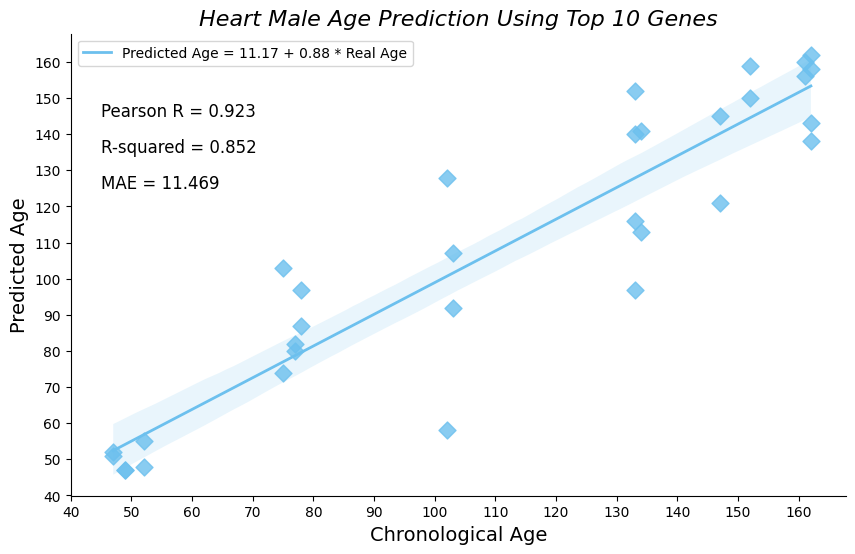


🔬 Performance for Gene Number: 15
Pearson R: 0.935
R-squared: 0.873
MAE: 9.969


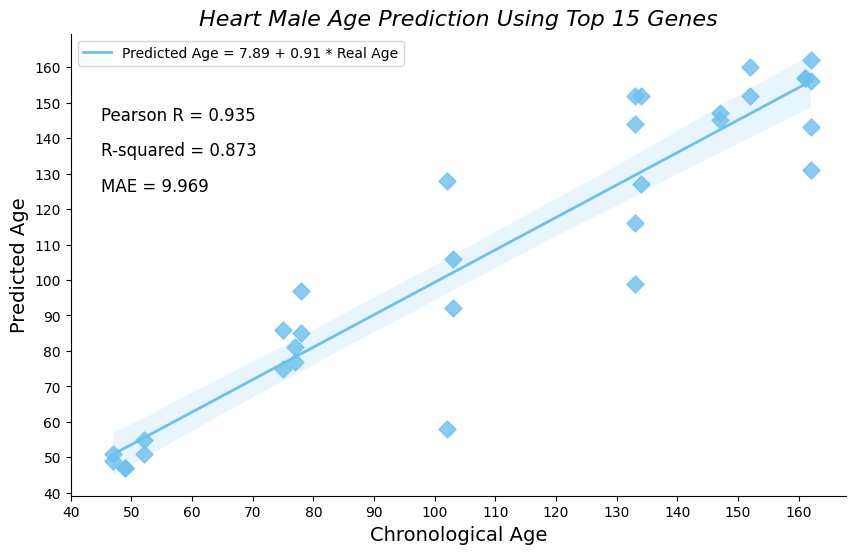


🔬 Performance for Gene Number: 20
Pearson R: 0.927
R-squared: 0.860
MAE: 10.188


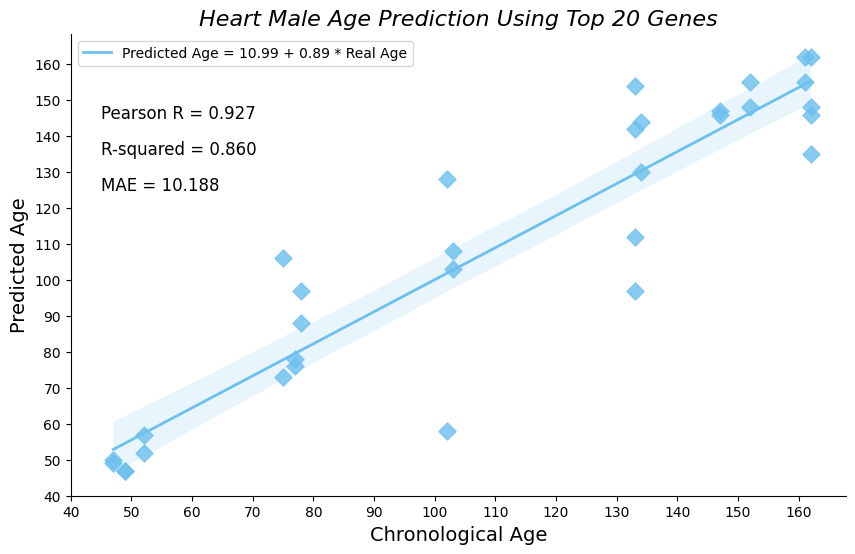


🔬 Performance for Gene Number: 25
Pearson R: 0.875
R-squared: 0.765
MAE: 12.969


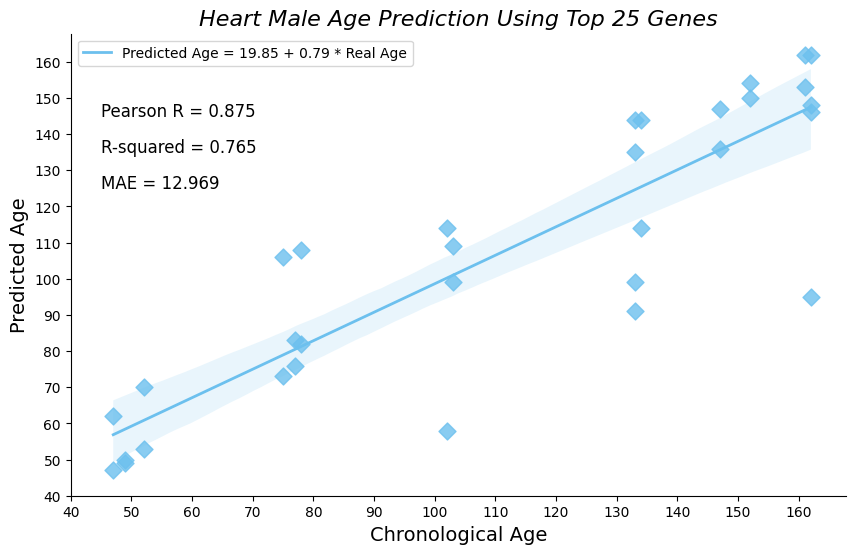


🔬 Performance for Gene Number: 30
Pearson R: 0.865
R-squared: 0.749
MAE: 15.344


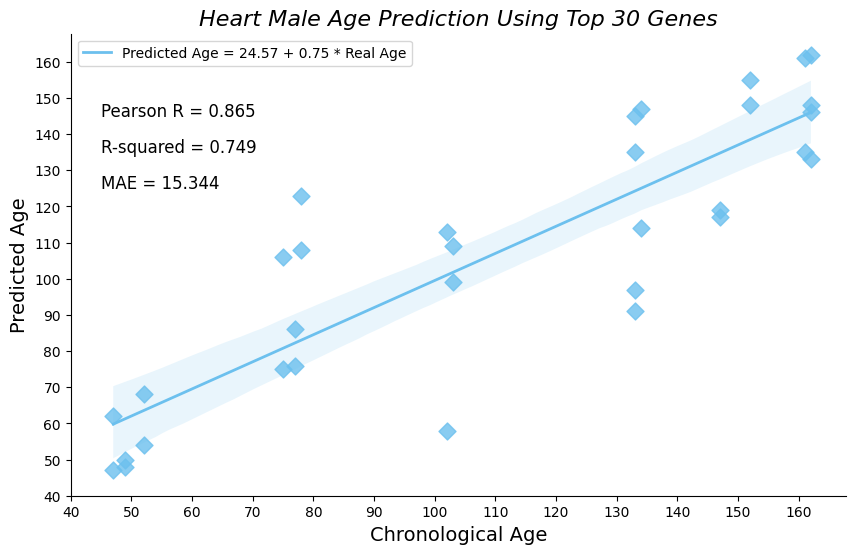


🔬 Performance for Gene Number: 35
Pearson R: 0.887
R-squared: 0.787
MAE: 14.312


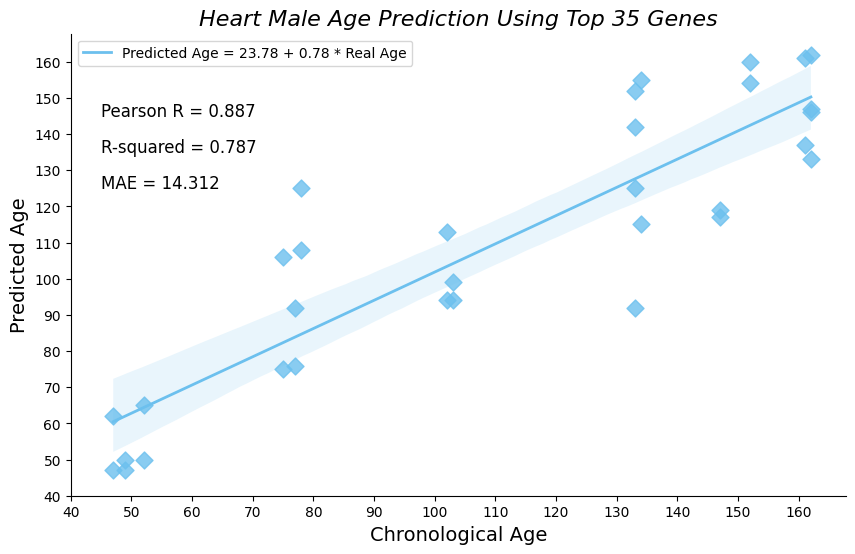


🔬 Performance for Gene Number: 40
Pearson R: 0.909
R-squared: 0.827
MAE: 11.875


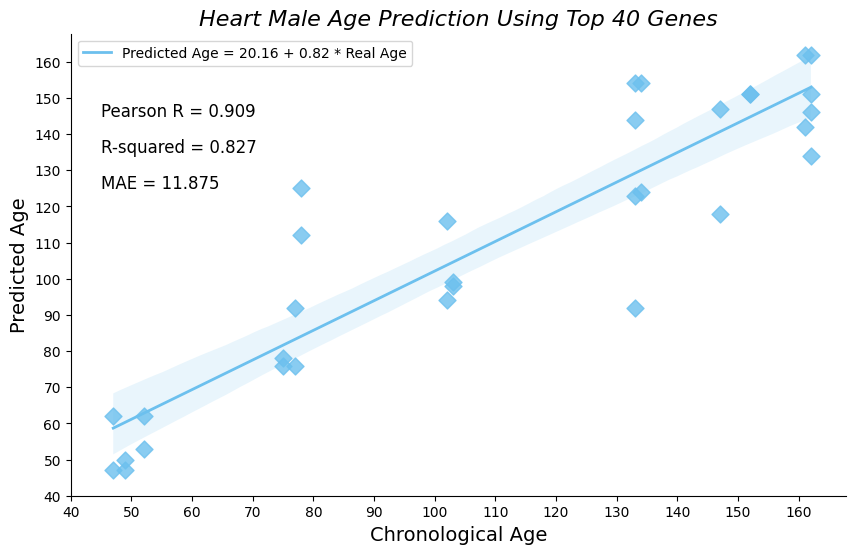


🔬 Performance for Gene Number: 45
Pearson R: 0.818
R-squared: 0.670
MAE: 15.469


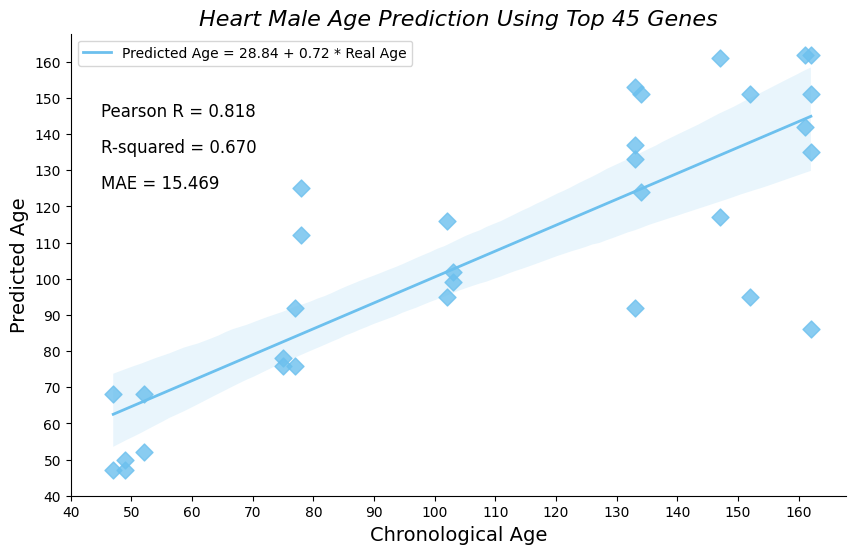


🔬 Performance for Gene Number: 50
Pearson R: 0.822
R-squared: 0.676
MAE: 14.938


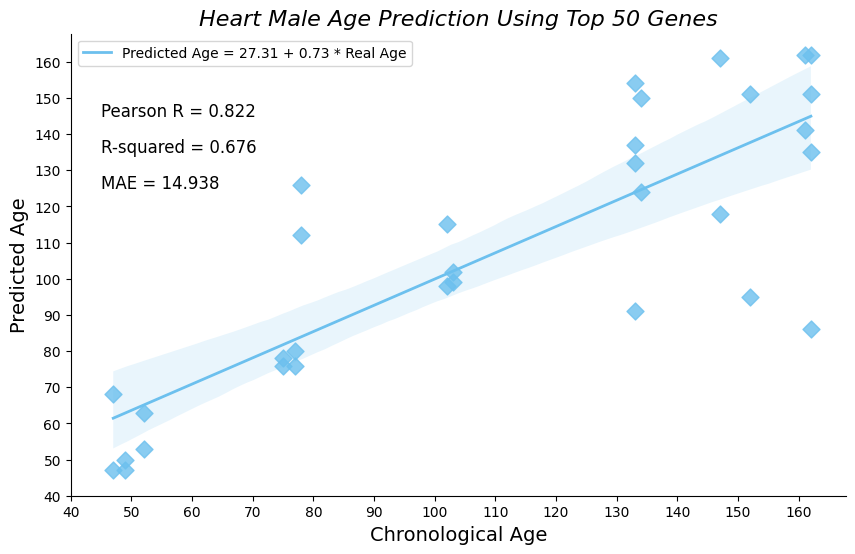


✅ Best Performing Clock (Based on Lowest MAE):
Top 15 Genes
Pearson R: 0.935
R-squared: 0.873
MAE: 9.969
Slope: 0.915
Intercept: 7.891


In [99]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    heart_predicted_ages = pd.DataFrame(index=heart_df_male_age.index, columns=["prediction"])

    for sample in heart_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/heart/reference/heart_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_heart_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_heart_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        heart_predicted_ages.loc[sample, "prediction"] = max_probability_age

    heart_predicted_ages["true_age"] = heart_df_male_age["age"].tolist()
    heart_predicted_ages['age'] = pd.to_numeric(heart_predicted_ages['true_age'], errors='coerce')
    heart_predicted_ages['prediction'] = pd.to_numeric(heart_predicted_ages['prediction'], errors='coerce')
    heart_df_male_predictions = heart_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        heart_df_male_predictions['age'], heart_df_male_predictions['prediction']
    )

    heart_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(heart_df_male_predictions['age'], heart_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": heart_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {heart_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=heart_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {heart_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Heart Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Muscle

In [100]:
muscle_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Muscle"]

muscle_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_1,0,192,56,302,204,435,376,1219,322,298,...,40,375,5,547,654,126,147,M,Muscle,134
A14_1,0,173,92,333,196,448,419,1127,368,354,...,30,472,6,613,841,241,182,M,Muscle,147
A15_1,0,104,34,194,98,233,131,592,210,122,...,38,228,2,273,370,58,82,M,Muscle,52
A16_1,0,295,51,556,222,578,542,1368,793,459,...,84,376,4,588,765,65,268,F,Muscle,103
B13_1,0,284,55,465,270,571,563,1390,553,447,...,69,385,4,691,966,145,200,F,Muscle,155


In [101]:
muscle_age_days_value_counts = muscle_df_counts["age_days"].value_counts().index.tolist()

In [102]:
muscle_age_steps = sorted(muscle_age_days_value_counts)

print(muscle_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [103]:
muscle_gene_expression_data = muscle_df_counts.iloc[:, :-3]

In [104]:
muscle_df_age = muscle_gene_expression_data.copy()

In [105]:
muscle_df_age["age"] = muscle_df_counts["age_days"].tolist()

muscle_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_1,0,192,56,302,204,435,376,1219,322,298,...,21,440,40,375,5,547,654,126,147,134
A14_1,0,173,92,333,196,448,419,1127,368,354,...,22,510,30,472,6,613,841,241,182,147
A15_1,0,104,34,194,98,233,131,592,210,122,...,7,228,38,228,2,273,370,58,82,52


#### Female

In [106]:
muscle_df_female = muscle_df_counts.loc[muscle_df_counts.iloc[:,-3] == "F"]

muscle_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A16_1,0,295,51,556,222,578,542,1368,793,459,...,84,376,4,588,765,65,268,F,Muscle,103
B13_1,0,284,55,465,270,571,563,1390,553,447,...,69,385,4,691,966,145,200,F,Muscle,155
B14_1,4,234,113,235,187,455,335,713,401,188,...,38,422,29,394,675,176,165,F,Muscle,77
C15_1,0,165,40,256,116,428,249,667,459,252,...,46,245,10,498,700,129,128,F,Muscle,134
D13_1,43,156,74,336,203,336,378,966,419,269,...,57,323,12,356,687,154,151,F,Muscle,102


In [107]:
age_days_value_counts_female = muscle_df_female["age_days"].value_counts().index.tolist()

In [108]:
muscle_age_steps_female = sorted(age_days_value_counts_female)

In [109]:
muscle_gene_expression_data_female = muscle_df_female.iloc[:,:-3]

In [110]:
muscle_df_female_age = muscle_gene_expression_data_female.copy()

In [111]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
muscle_df_female_age["age"] = muscle_df_female["age_days"].tolist()

In [112]:
#for sample in muscle_df_female_age.index.tolist():

#    new_df = muscle_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/muscle/sample/muscle_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [113]:
muscle_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [114]:
new_muscle_age_steps_female = np.arange(min(muscle_age_steps_female), max(muscle_age_steps_female) + 1, 1)

#### Reference Generation

In [115]:
#counter = 0

#for sample in muscle_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/muscle/sample/muscle_female_{sample}.csv",
#                            reference_name=f"muscle_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/muscle/reference/",
#                            age_prediction="list",
#                            age_list=new_muscle_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.847
R-squared: 0.718
MAE: 15.000


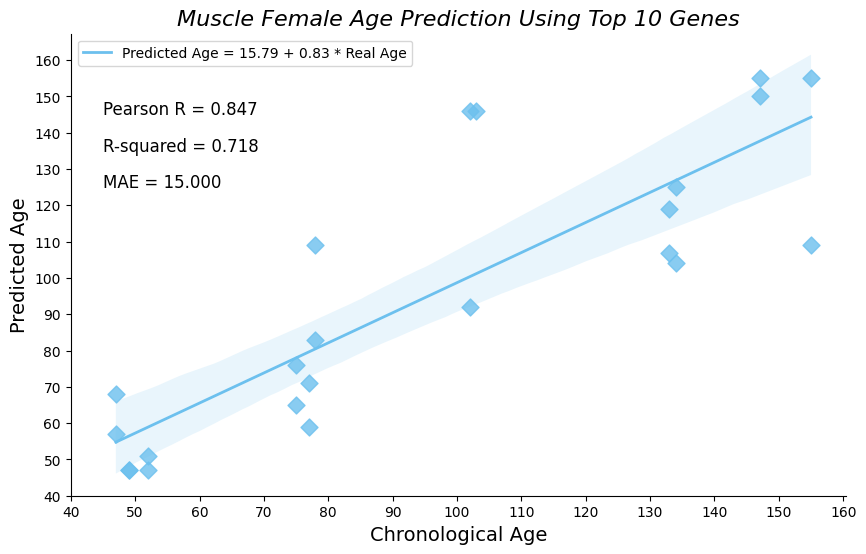


🔬 Performance for Gene Number: 15
Pearson R: 0.902
R-squared: 0.813
MAE: 12.565


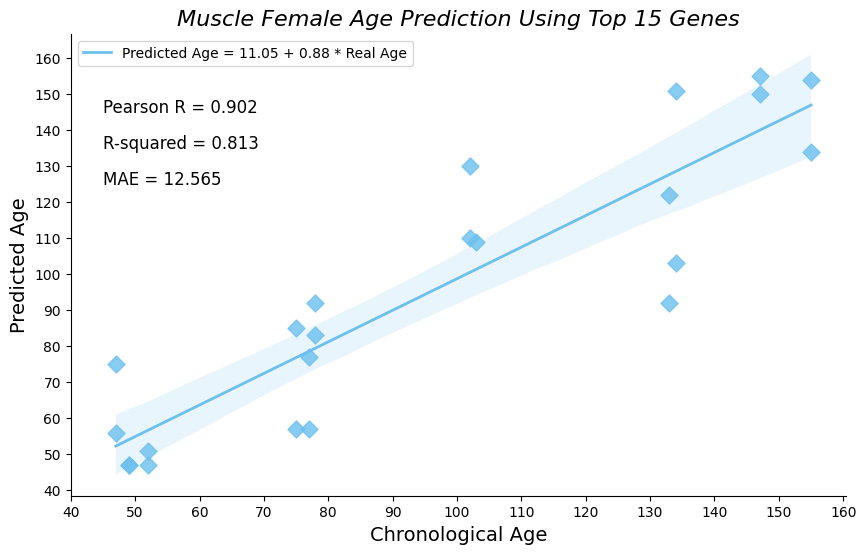


🔬 Performance for Gene Number: 20
Pearson R: 0.891
R-squared: 0.795
MAE: 13.652


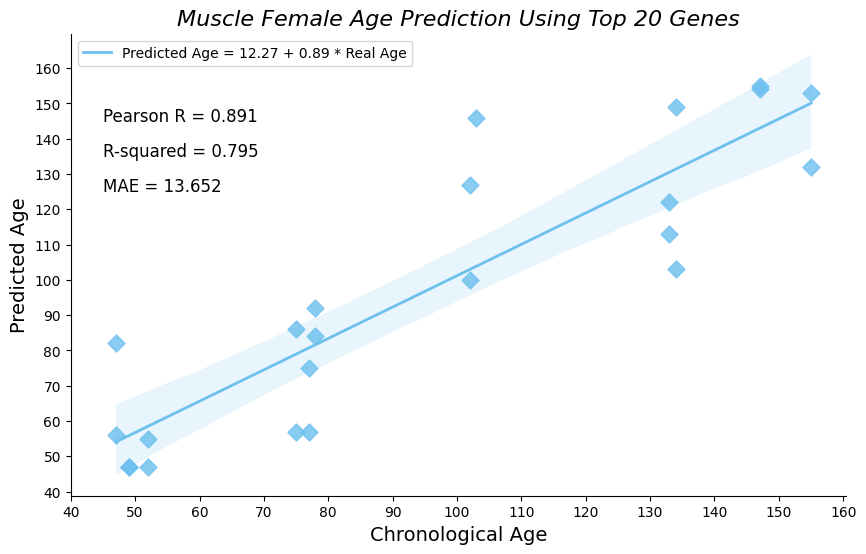


🔬 Performance for Gene Number: 25
Pearson R: 0.886
R-squared: 0.785
MAE: 14.478


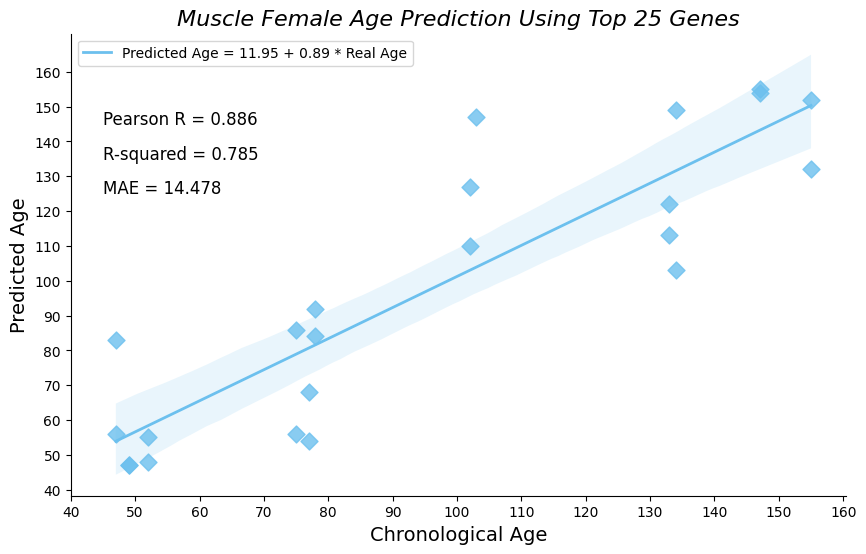


🔬 Performance for Gene Number: 30
Pearson R: 0.883
R-squared: 0.779
MAE: 14.217


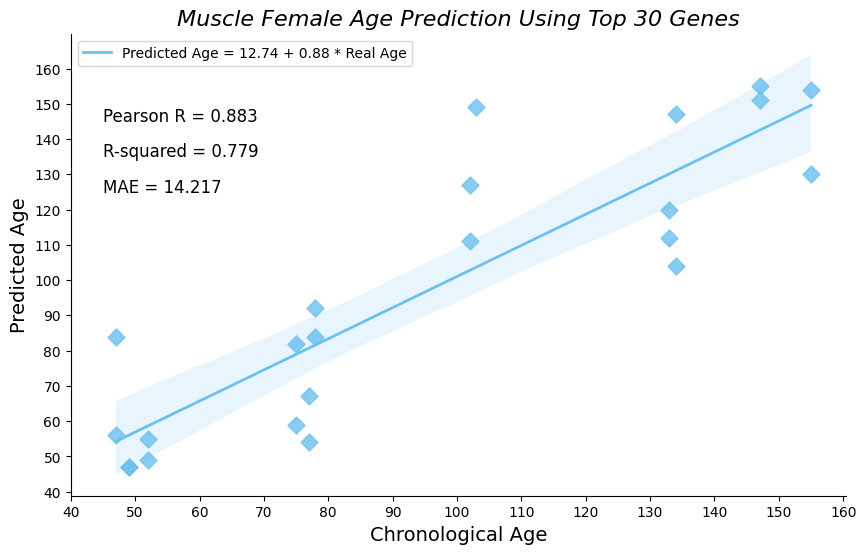


🔬 Performance for Gene Number: 35
Pearson R: 0.872
R-squared: 0.761
MAE: 14.565


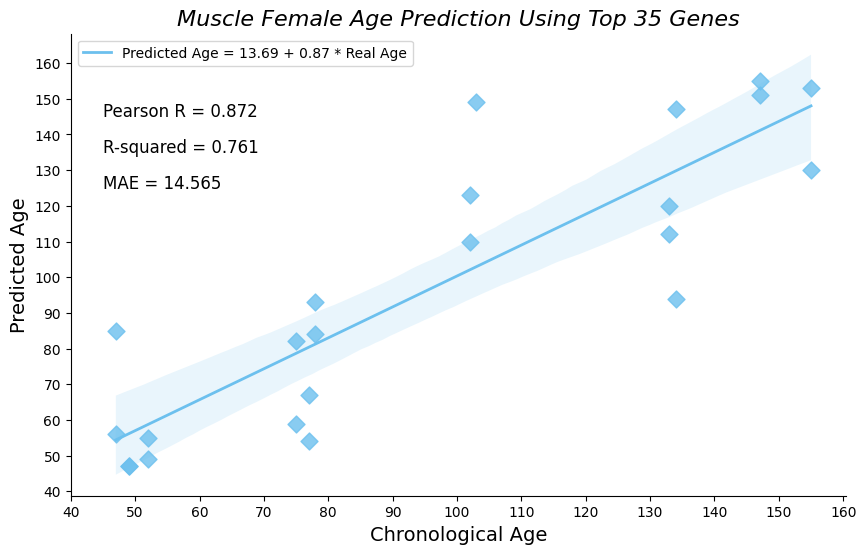


🔬 Performance for Gene Number: 40
Pearson R: 0.878
R-squared: 0.771
MAE: 14.696


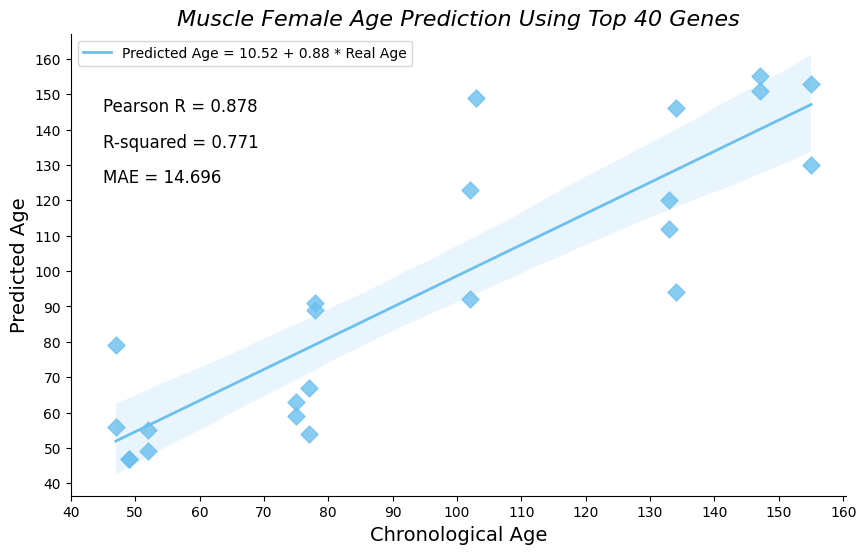


🔬 Performance for Gene Number: 45
Pearson R: 0.873
R-squared: 0.762
MAE: 15.217


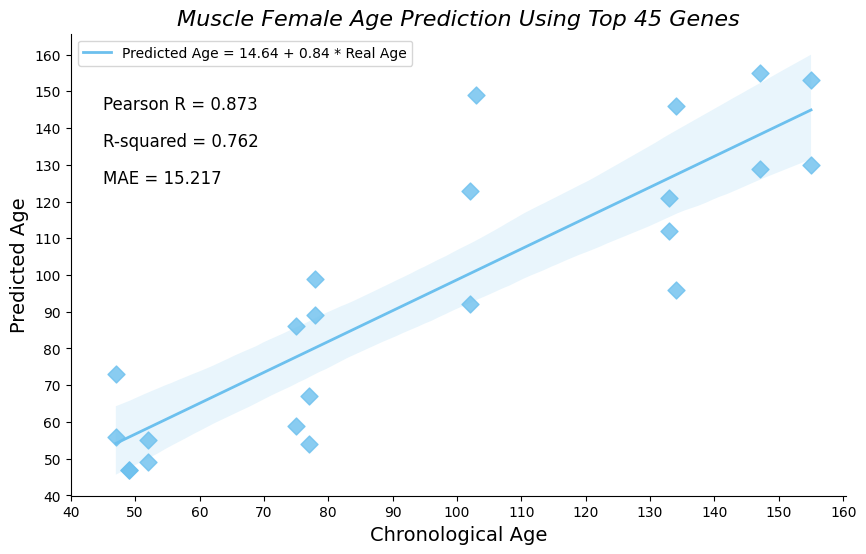


🔬 Performance for Gene Number: 50
Pearson R: 0.874
R-squared: 0.763
MAE: 14.870


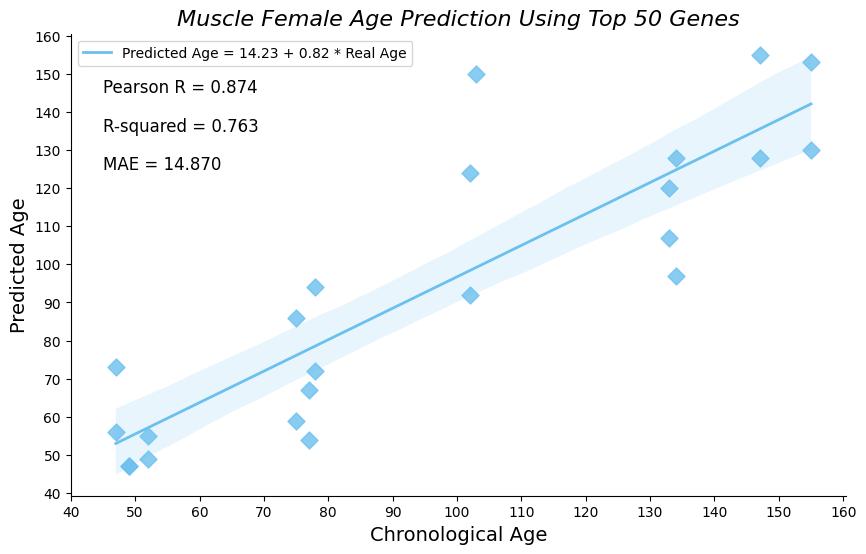


✅ Best Performing Clock (Based on Lowest MAE):
Top 15 Genes
Pearson R: 0.902
R-squared: 0.813
MAE: 12.565
Slope: 0.877
Intercept: 11.046


In [116]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    muscle_predicted_ages = pd.DataFrame(index=muscle_df_female_age.index, columns=["prediction"])

    for sample in muscle_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/muscle/reference/muscle_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_muscle_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_muscle_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        muscle_predicted_ages.loc[sample, "prediction"] = max_probability_age

    muscle_predicted_ages["true_age"] = muscle_df_female_age["age"].tolist()
    muscle_predicted_ages['age'] = pd.to_numeric(muscle_predicted_ages['true_age'], errors='coerce')
    muscle_predicted_ages['prediction'] = pd.to_numeric(muscle_predicted_ages['prediction'], errors='coerce')
    muscle_df_female_predictions = muscle_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        muscle_df_female_predictions['age'], muscle_df_female_predictions['prediction']
    )

    muscle_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(muscle_df_female_predictions['age'], muscle_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": muscle_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {muscle_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=muscle_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {muscle_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Muscle Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [117]:
muscle_df_male = muscle_df_counts.loc[muscle_df_counts.iloc[:,-3] == "M"]

muscle_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_1,0,192,56,302,204,435,376,1219,322,298,...,40,375,5,547,654,126,147,M,Muscle,134
A14_1,0,173,92,333,196,448,419,1127,368,354,...,30,472,6,613,841,241,182,M,Muscle,147
A15_1,0,104,34,194,98,233,131,592,210,122,...,38,228,2,273,370,58,82,M,Muscle,52
B15_1,6,382,58,728,262,845,1160,1016,2509,1373,...,318,679,14,517,1338,183,181,M,Muscle,102
B16_1,0,230,32,343,110,608,393,760,836,448,...,56,308,8,355,633,68,119,M,Muscle,133


In [118]:
age_days_value_counts_male = muscle_df_male["age_days"].value_counts().index.tolist()

In [119]:
muscle_age_steps_male = sorted(age_days_value_counts_male)

In [120]:
muscle_gene_expression_data_male = muscle_df_male.iloc[:,:-3]

In [121]:
muscle_df_male_age = muscle_gene_expression_data_male.copy()

In [122]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
muscle_df_male_age["age"] = muscle_df_male["age_days"].tolist()

In [123]:
#for sample in muscle_df_male_age.index.tolist():

#    new_df = muscle_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/muscle/sample/muscle_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [124]:
muscle_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [125]:
new_muscle_age_steps_male = np.arange(min(muscle_age_steps_male), max(muscle_age_steps_male) + 1, 1)

In [126]:
#counter = 0

#for sample in muscle_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/muscle/sample/muscle_male_{sample}.csv",
#                            reference_name=f"muscle_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/muscle/reference/",
#                            age_prediction="list",
#                            age_list=new_muscle_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.841
R-squared: 0.707
MAE: 14.844


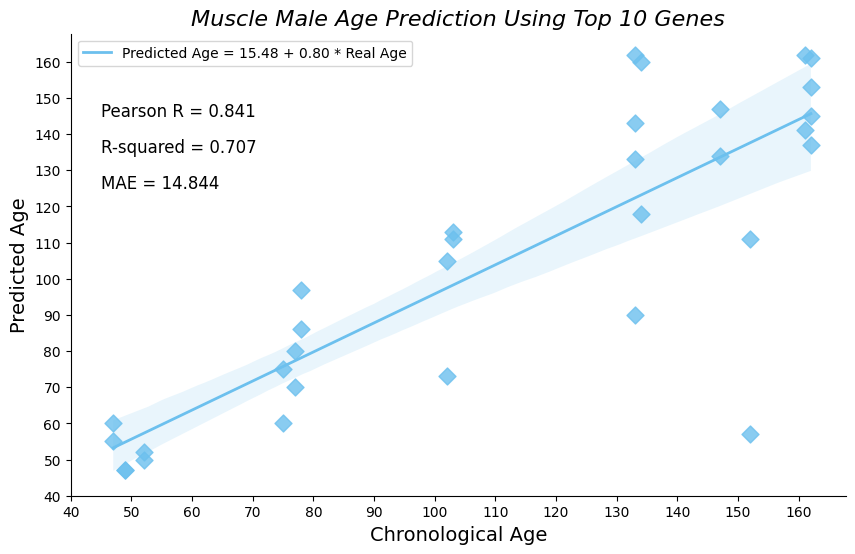


🔬 Performance for Gene Number: 15
Pearson R: 0.843
R-squared: 0.711
MAE: 14.594


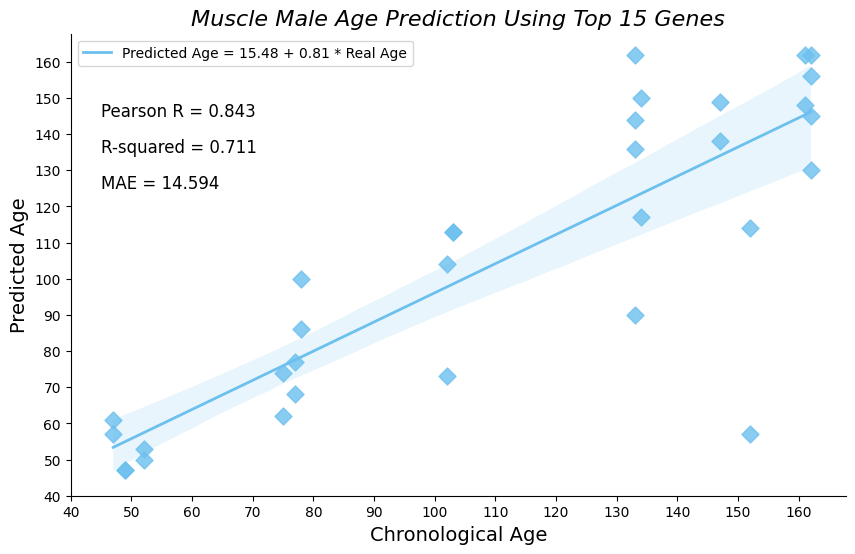


🔬 Performance for Gene Number: 20
Pearson R: 0.834
R-squared: 0.696
MAE: 14.438


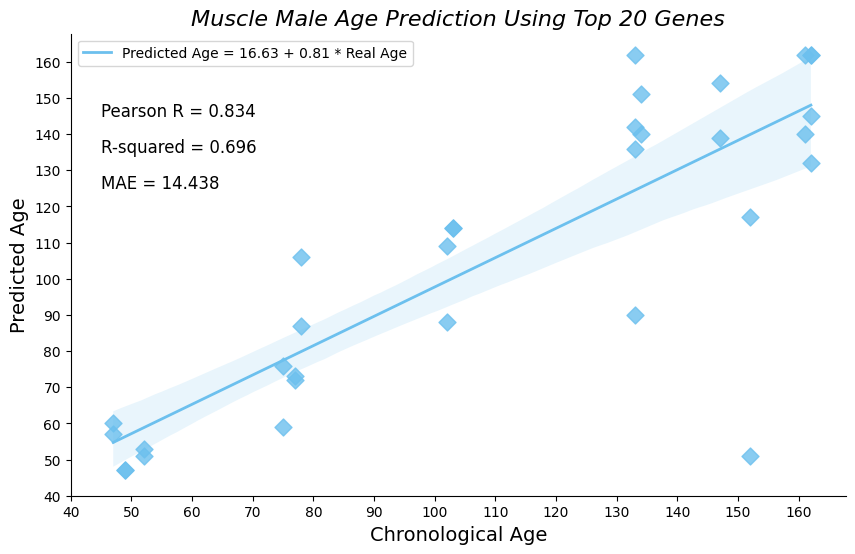


🔬 Performance for Gene Number: 25
Pearson R: 0.814
R-squared: 0.662
MAE: 15.875


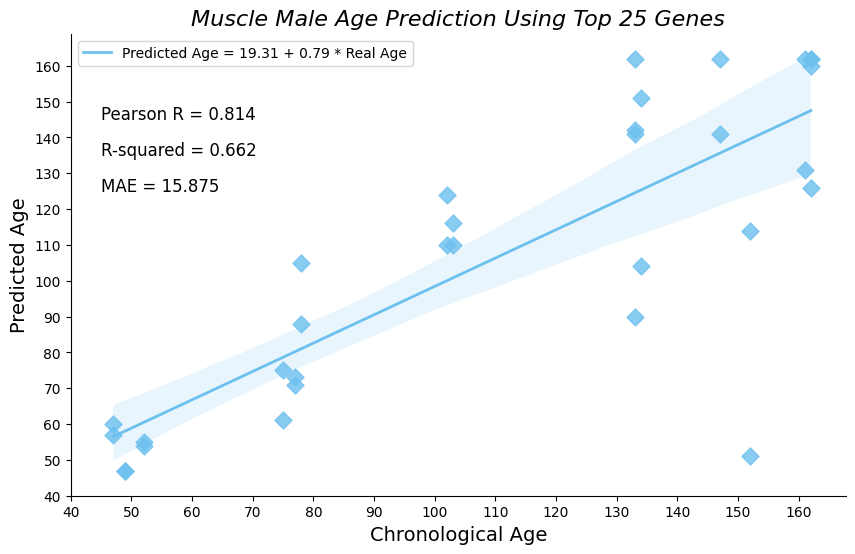


🔬 Performance for Gene Number: 30
Pearson R: 0.838
R-squared: 0.702
MAE: 14.312


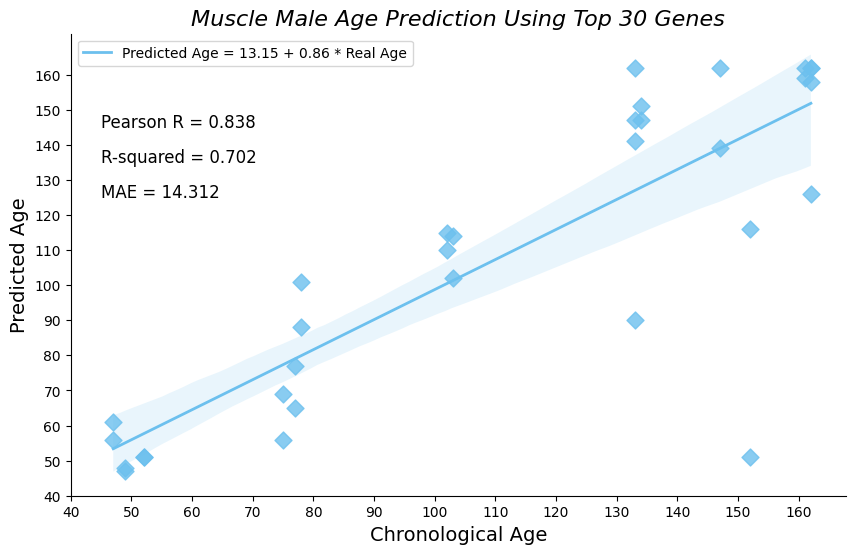


🔬 Performance for Gene Number: 35
Pearson R: 0.826
R-squared: 0.683
MAE: 15.625


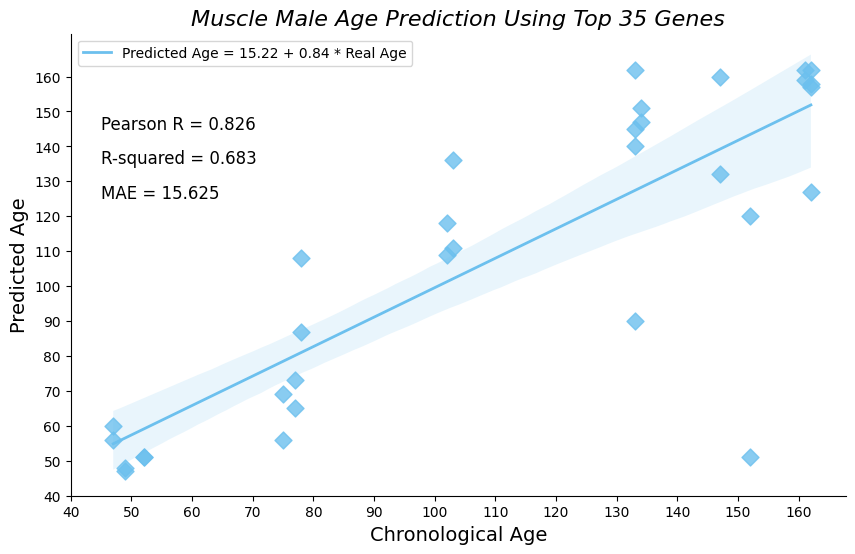


🔬 Performance for Gene Number: 40
Pearson R: 0.902
R-squared: 0.814
MAE: 12.688


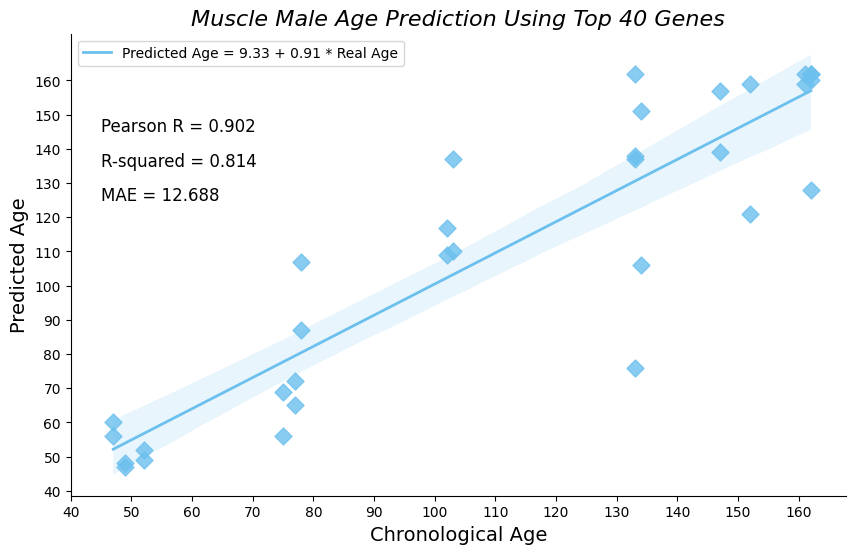


🔬 Performance for Gene Number: 45
Pearson R: 0.815
R-squared: 0.664
MAE: 15.719


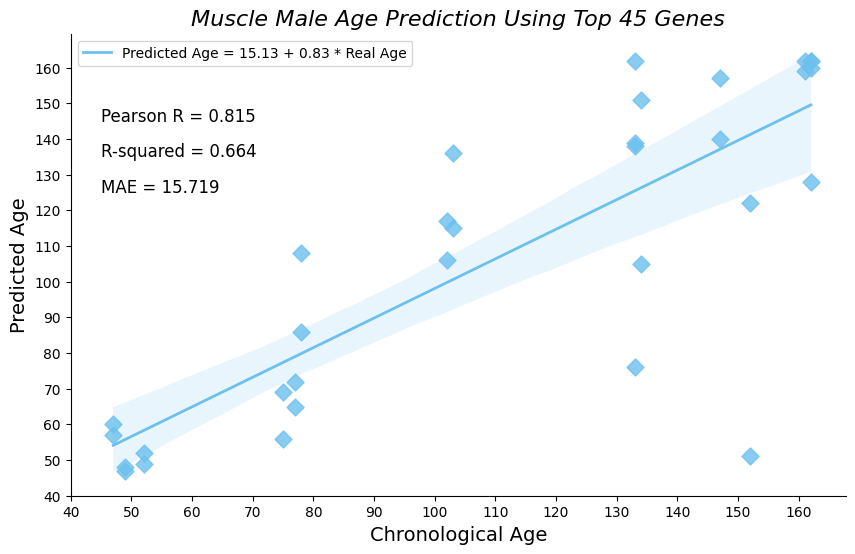


🔬 Performance for Gene Number: 50
Pearson R: 0.896
R-squared: 0.803
MAE: 13.250


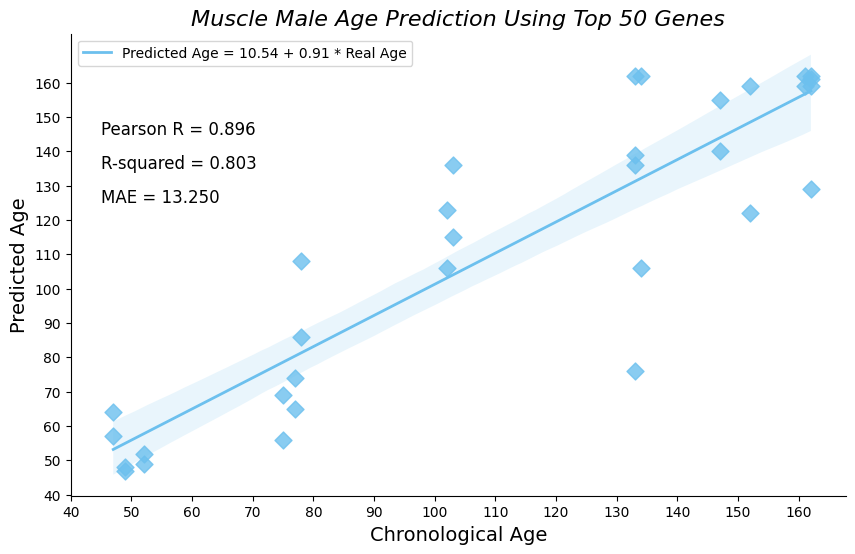


✅ Best Performing Clock (Based on Lowest MAE):
Top 40 Genes
Pearson R: 0.902
R-squared: 0.814
MAE: 12.688
Slope: 0.912
Intercept: 9.327


In [127]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    muscle_predicted_ages = pd.DataFrame(index=muscle_df_male_age.index, columns=["prediction"])

    for sample in muscle_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/muscle/reference/muscle_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_muscle_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_muscle_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        muscle_predicted_ages.loc[sample, "prediction"] = max_probability_age

    muscle_predicted_ages["true_age"] = muscle_df_male_age["age"].tolist()
    muscle_predicted_ages['age'] = pd.to_numeric(muscle_predicted_ages['true_age'], errors='coerce')
    muscle_predicted_ages['prediction'] = pd.to_numeric(muscle_predicted_ages['prediction'], errors='coerce')
    muscle_df_male_predictions = muscle_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        muscle_df_male_predictions['age'], muscle_df_male_predictions['prediction']
    )

    muscle_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(muscle_df_male_predictions['age'], muscle_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": muscle_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {muscle_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=muscle_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {muscle_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Muscle Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Eye

In [128]:
eye_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Eye"]

eye_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
I12_2,10,391,602,686,80,564,2583,1137,940,516,...,204,430,26,898,664,169,436,M,Eye,47
I16_2,4,350,670,855,90,633,2865,1125,935,572,...,332,523,48,1046,1044,185,483,M,Eye,147
I20_2,16,439,710,889,132,879,2288,1329,927,786,...,312,564,18,680,594,66,328,M,Eye,78
I4_2,16,426,978,949,120,695,3943,1559,1117,667,...,269,563,28,1041,1233,127,543,F,Eye,103
I8_2,10,474,930,976,118,732,3438,1161,1041,702,...,281,456,38,882,650,110,374,F,Eye,78


In [129]:
eye_age_days_value_counts = eye_df_counts["age_days"].value_counts().index.tolist()

In [130]:
eye_age_steps = sorted(eye_age_days_value_counts)

print(eye_age_steps)

[47, 49, 75, 77, 78, 102, 103, 133, 147, 152, 161, 162]


In [131]:
eye_gene_expression_data = eye_df_counts.iloc[:, :-3]

In [132]:
eye_df_age = eye_gene_expression_data.copy()

In [133]:
eye_df_age["age"] = eye_df_counts["age_days"].tolist()

eye_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
I12_2,10,391,602,686,80,564,2583,1137,940,516,...,249,1060,204,430,26,898,664,169,436,47
I16_2,4,350,670,855,90,633,2865,1125,935,572,...,262,955,332,523,48,1046,1044,185,483,147
I20_2,16,439,710,889,132,879,2288,1329,927,786,...,292,625,312,564,18,680,594,66,328,78


#### Female

In [134]:
eye_df_female = eye_df_counts.loc[eye_df_counts.iloc[:,-3] == "F"]

eye_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
I4_2,16,426,978,949,120,695,3943,1559,1117,667,...,269,563,28,1041,1233,127,543,F,Eye,103
I8_2,10,474,930,976,118,732,3438,1161,1041,702,...,281,456,38,882,650,110,374,F,Eye,78
J16_2,24,472,830,1080,118,765,3380,1124,845,649,...,421,744,6,1171,927,180,550,F,Eye,147
J4_2,8,382,700,849,98,613,1773,1679,841,522,...,238,493,11,686,393,70,212,F,Eye,75
K4_2,18,629,778,1390,60,895,2287,984,945,700,...,433,819,4,1136,1064,190,707,F,Eye,103


In [135]:
age_days_value_counts_female = eye_df_female["age_days"].value_counts().index.tolist()

In [136]:
eye_age_steps_female = sorted(age_days_value_counts_female)

In [137]:
eye_gene_expression_data_female = eye_df_female.iloc[:,:-3]

In [138]:
eye_df_female_age = eye_gene_expression_data_female.copy()

In [139]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
eye_df_female_age["age"] = eye_df_female["age_days"].tolist()

In [140]:
#for sample in eye_df_female_age.index.tolist():

#    new_df = eye_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/eye/sample/eye_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [141]:
eye_age_steps_female

[47, 49, 75, 77, 78, 102, 103, 147]

In [142]:
new_eye_age_steps_female = np.arange(min(eye_age_steps_female), max(eye_age_steps_female) + 1, 1)

In [143]:
new_eye_age_steps_female

array([ 47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,
        60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,
        73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
        86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,
        99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
       112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,
       125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137,
       138, 139, 140, 141, 142, 143, 144, 145, 146, 147])

#### Reference Generation

In [144]:
#counter = 0

#for sample in eye_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/eye/sample/eye_female_{sample}.csv",
#                            reference_name=f"eye_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/eye/reference/",
#                            age_prediction="list",
#                            age_list=new_eye_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.732
R-squared: 0.535
MAE: 13.143


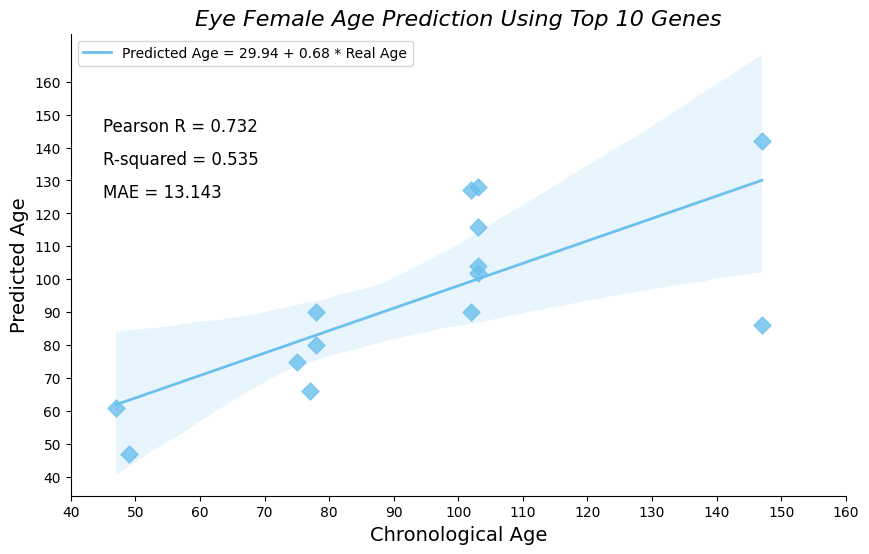


🔬 Performance for Gene Number: 15
Pearson R: 0.761
R-squared: 0.579
MAE: 11.929


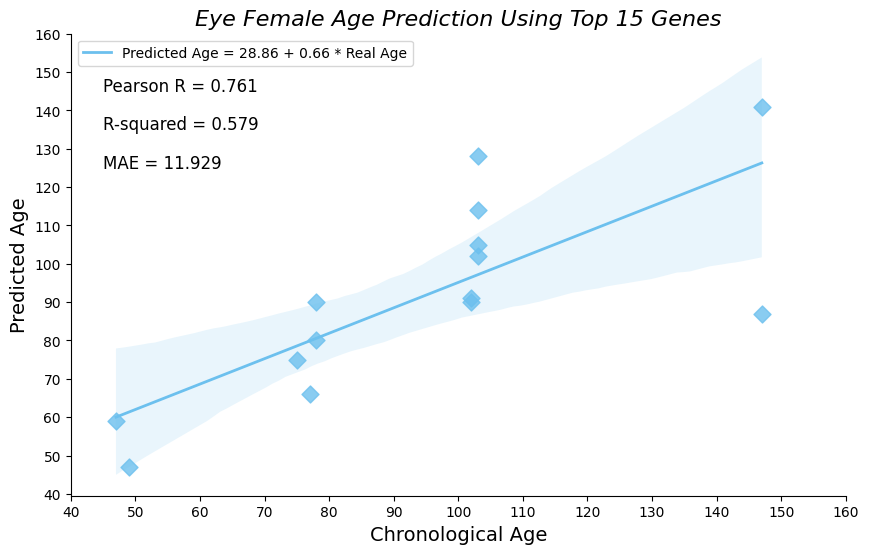


🔬 Performance for Gene Number: 20
Pearson R: 0.831
R-squared: 0.690
MAE: 11.071


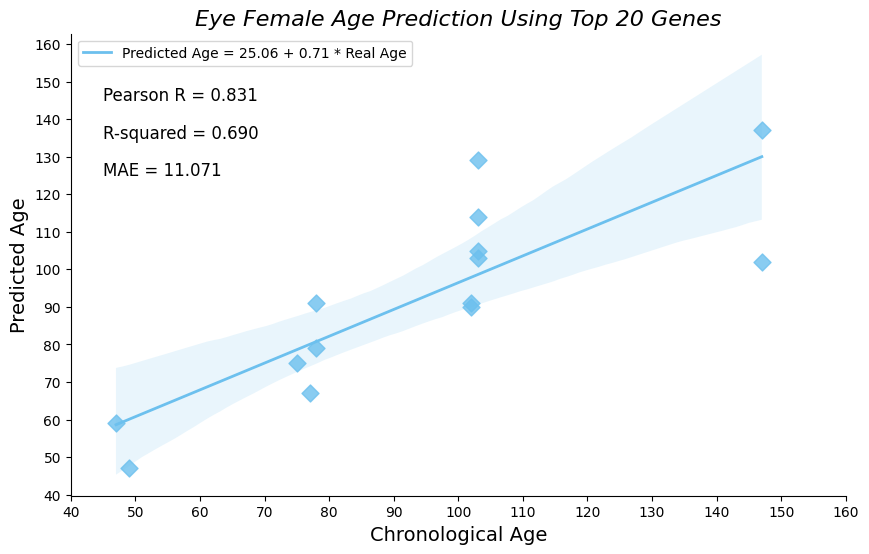


🔬 Performance for Gene Number: 25
Pearson R: 0.828
R-squared: 0.685
MAE: 11.143


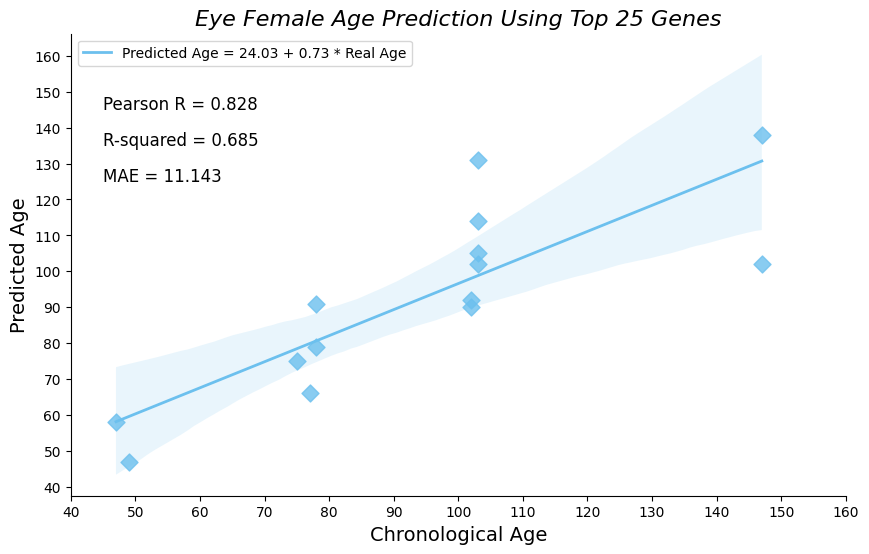


🔬 Performance for Gene Number: 30
Pearson R: 0.829
R-squared: 0.686
MAE: 10.857


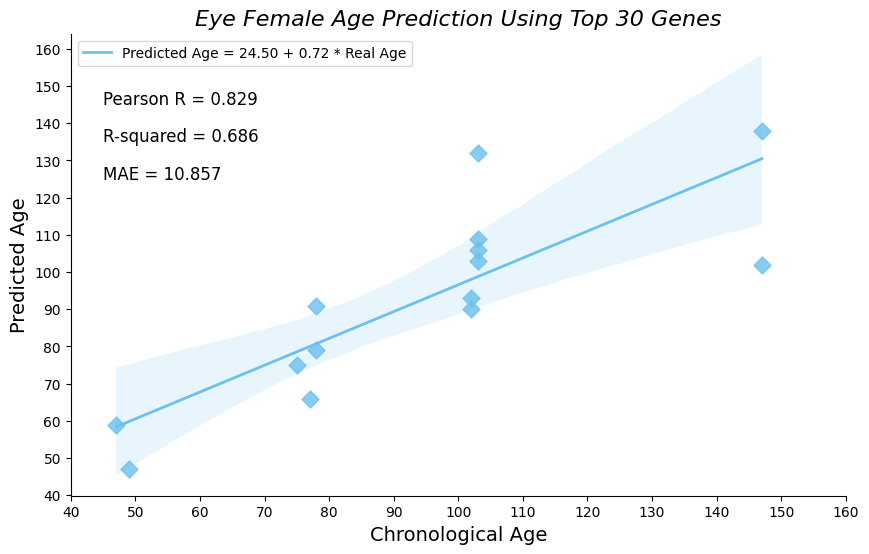


🔬 Performance for Gene Number: 35
Pearson R: 0.820
R-squared: 0.673
MAE: 11.286


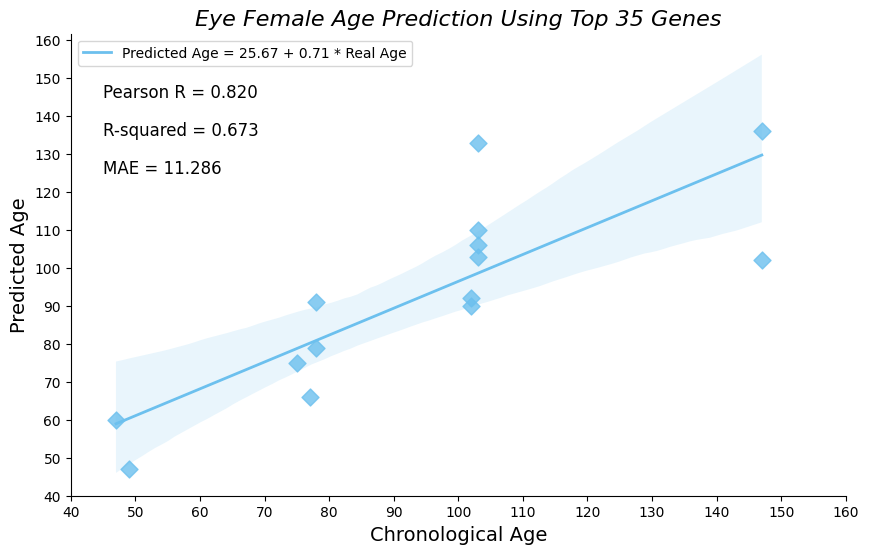


🔬 Performance for Gene Number: 40
Pearson R: 0.814
R-squared: 0.662
MAE: 11.643


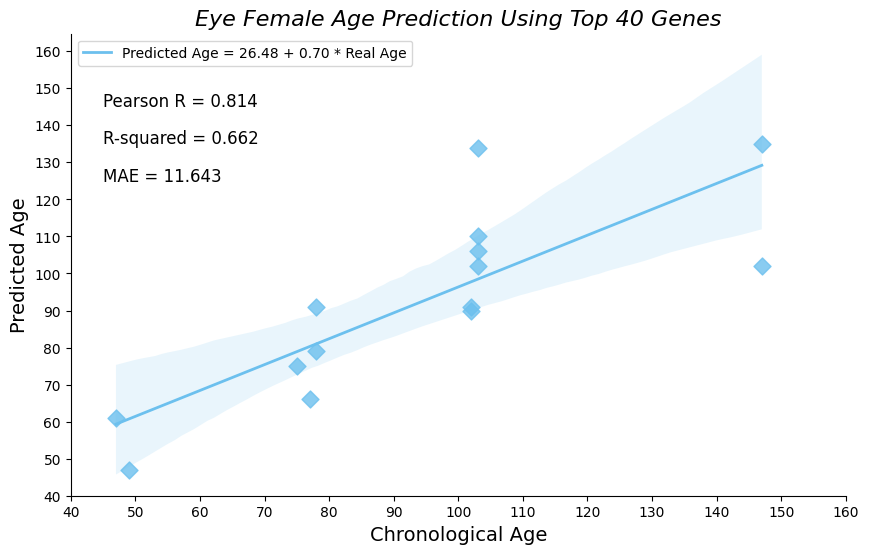


🔬 Performance for Gene Number: 45
Pearson R: 0.815
R-squared: 0.664
MAE: 11.714


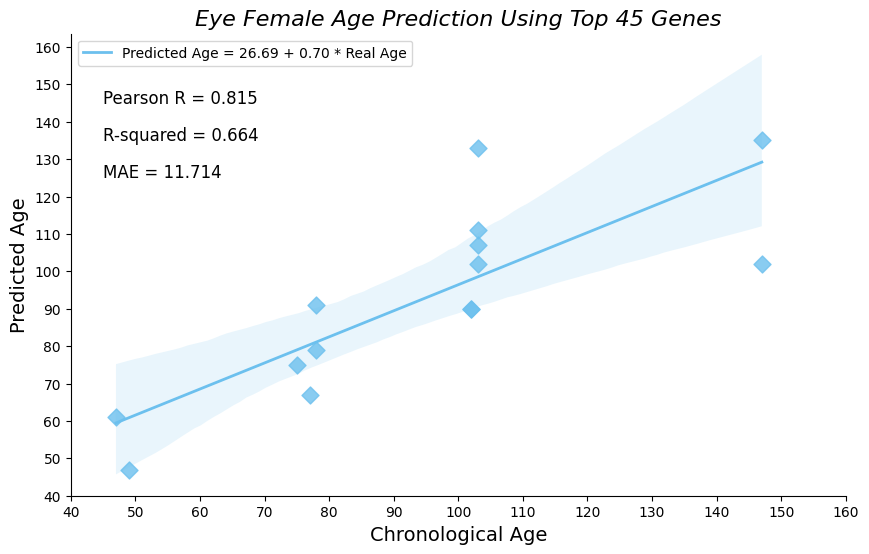


🔬 Performance for Gene Number: 50
Pearson R: 0.821
R-squared: 0.675
MAE: 11.429


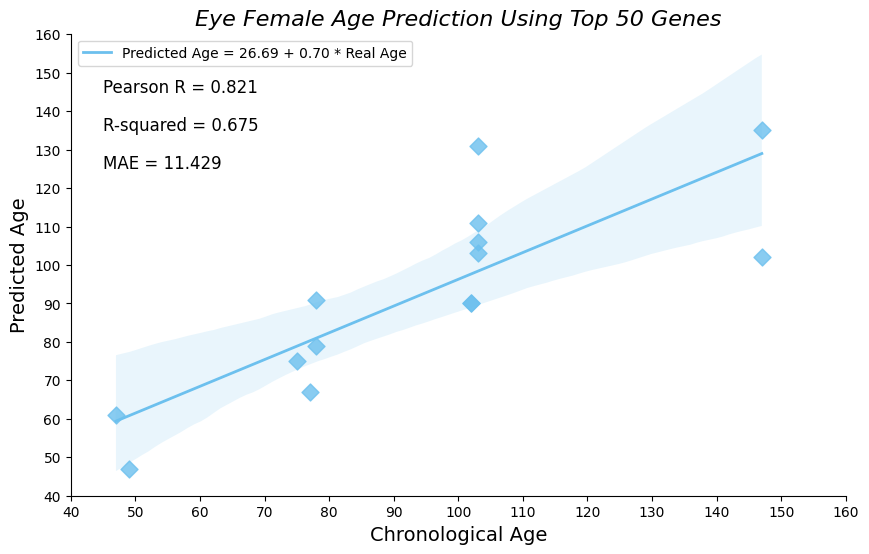


✅ Best Performing Clock (Based on Lowest MAE):
Top 30 Genes
Pearson R: 0.829
R-squared: 0.686
MAE: 10.857
Slope: 0.721
Intercept: 24.500


In [145]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    eye_predicted_ages = pd.DataFrame(index=eye_df_female_age.index, columns=["prediction"])

    for sample in eye_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/eye/reference/eye_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_eye_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_eye_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        eye_predicted_ages.loc[sample, "prediction"] = max_probability_age

    eye_predicted_ages["true_age"] = eye_df_female_age["age"].tolist()
    eye_predicted_ages['age'] = pd.to_numeric(eye_predicted_ages['true_age'], errors='coerce')
    eye_predicted_ages['prediction'] = pd.to_numeric(eye_predicted_ages['prediction'], errors='coerce')
    eye_df_female_predictions = eye_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        eye_df_female_predictions['age'], eye_df_female_predictions['prediction']
    )

    eye_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(eye_df_female_predictions['age'], eye_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": eye_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {eye_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=eye_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {eye_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Eye Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [146]:
eye_df_male = eye_df_counts.loc[eye_df_counts.iloc[:,-3] == "M"]

eye_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
I12_2,10,391,602,686,80,564,2583,1137,940,516,...,204,430,26,898,664,169,436,M,Eye,47
I16_2,4,350,670,855,90,633,2865,1125,935,572,...,332,523,48,1046,1044,185,483,M,Eye,147
I20_2,16,439,710,889,132,879,2288,1329,927,786,...,312,564,18,680,594,66,328,M,Eye,78
J12_2,18,430,604,931,94,727,1876,594,691,475,...,304,653,26,1076,906,134,648,M,Eye,103
J20_2,14,522,850,905,99,748,3715,1225,951,587,...,278,668,8,896,930,212,572,M,Eye,147


In [147]:
age_days_value_counts_male = eye_df_male["age_days"].value_counts().index.tolist()

In [148]:
eye_age_steps_male = sorted(age_days_value_counts_male)

In [149]:
eye_gene_expression_data_male = eye_df_male.iloc[:,:-3]

In [150]:
eye_df_male_age = eye_gene_expression_data_male.copy()

In [151]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
eye_df_male_age["age"] = eye_df_male["age_days"].tolist()

In [152]:
#for sample in eye_df_male_age.index.tolist():

#    new_df = eye_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/eye/sample/eye_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [153]:
eye_age_steps_male

[47, 49, 75, 77, 78, 102, 103, 133, 147, 152, 161, 162]

In [154]:
new_eye_age_steps_male = np.arange(min(eye_age_steps_male), max(eye_age_steps_male) + 1, 1)

In [155]:
#counter = 0

#for sample in eye_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/eye/sample/eye_male_{sample}.csv",
#                            reference_name=f"eye_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/eye/reference/",
#                            age_prediction="list",
#                            age_list=new_eye_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.738
R-squared: 0.544
MAE: 22.957


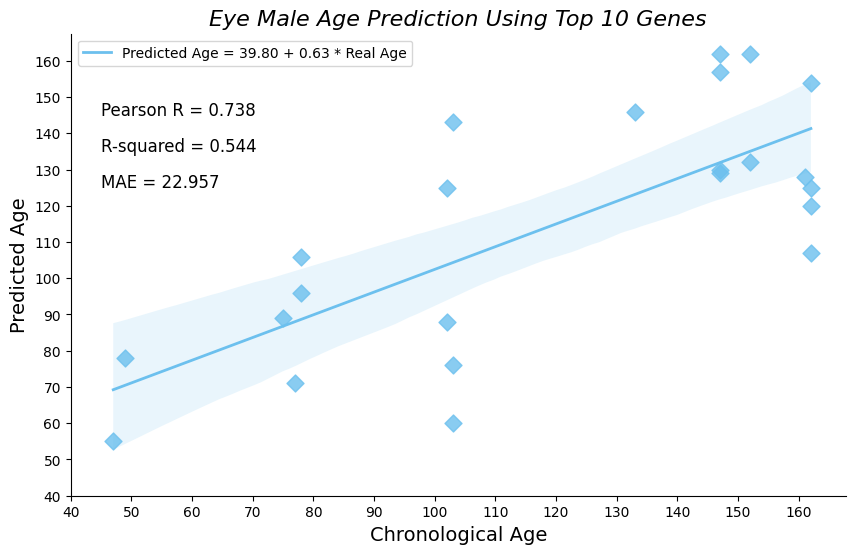


🔬 Performance for Gene Number: 15
Pearson R: 0.748
R-squared: 0.560
MAE: 21.565


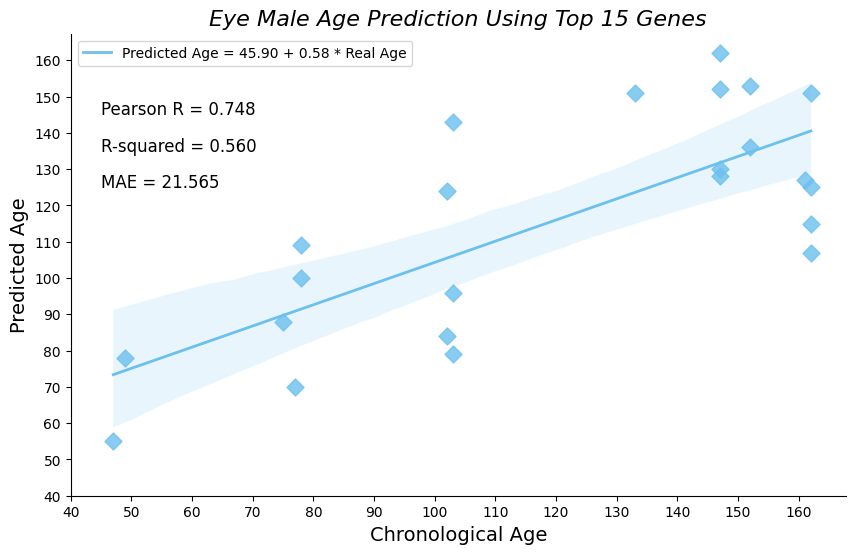


🔬 Performance for Gene Number: 20
Pearson R: 0.799
R-squared: 0.638
MAE: 20.000


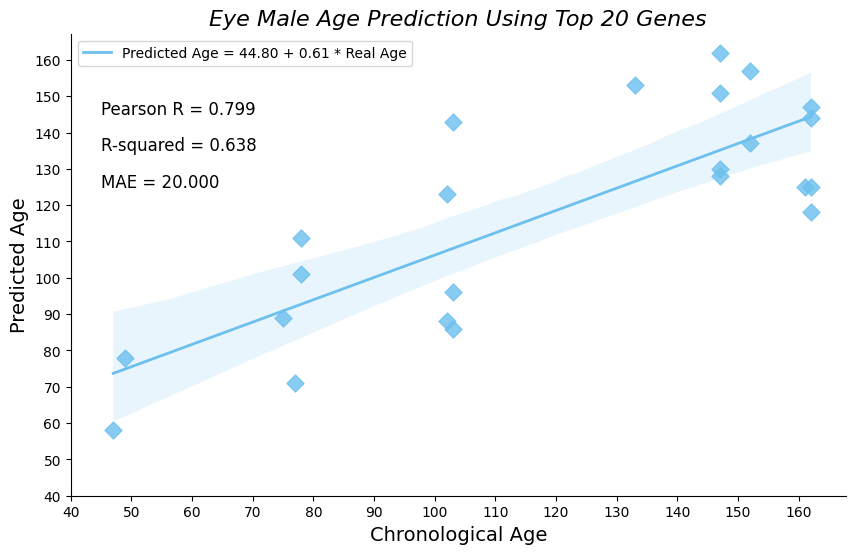


🔬 Performance for Gene Number: 25
Pearson R: 0.757
R-squared: 0.573
MAE: 21.217


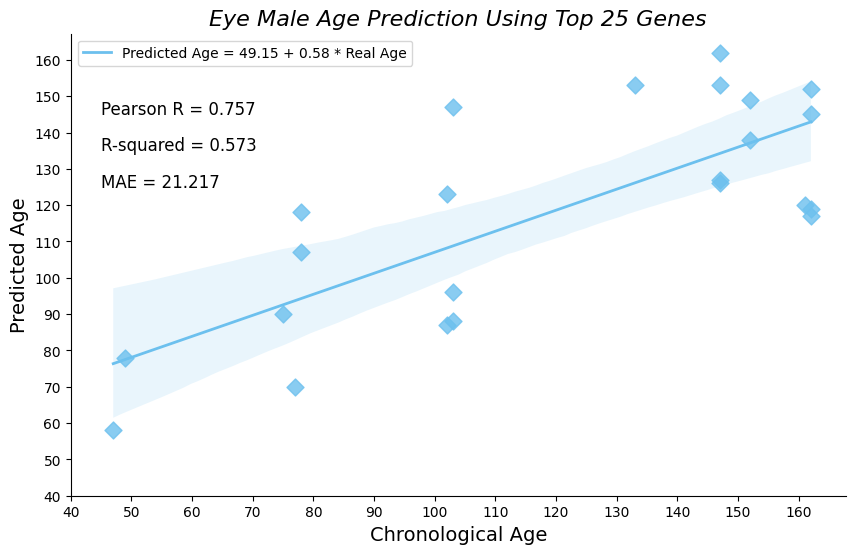


🔬 Performance for Gene Number: 30
Pearson R: 0.753
R-squared: 0.567
MAE: 21.478


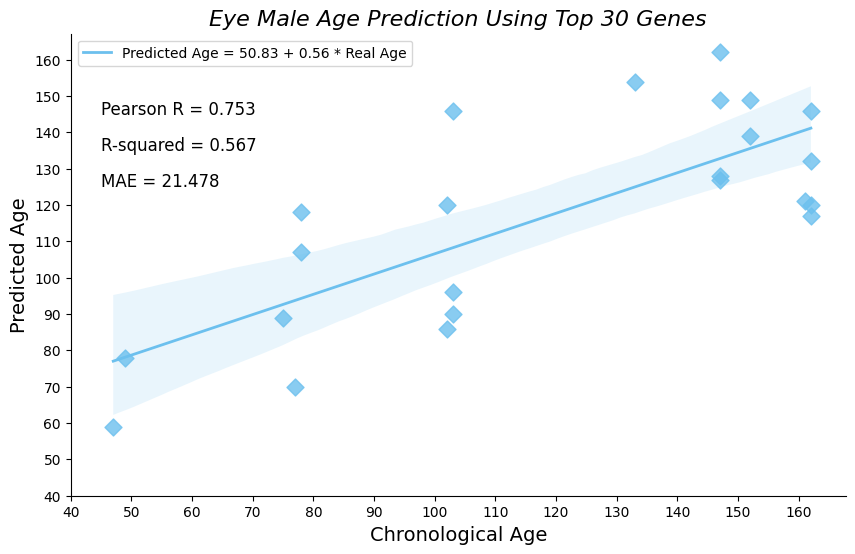


🔬 Performance for Gene Number: 35
Pearson R: 0.684
R-squared: 0.468
MAE: 23.391


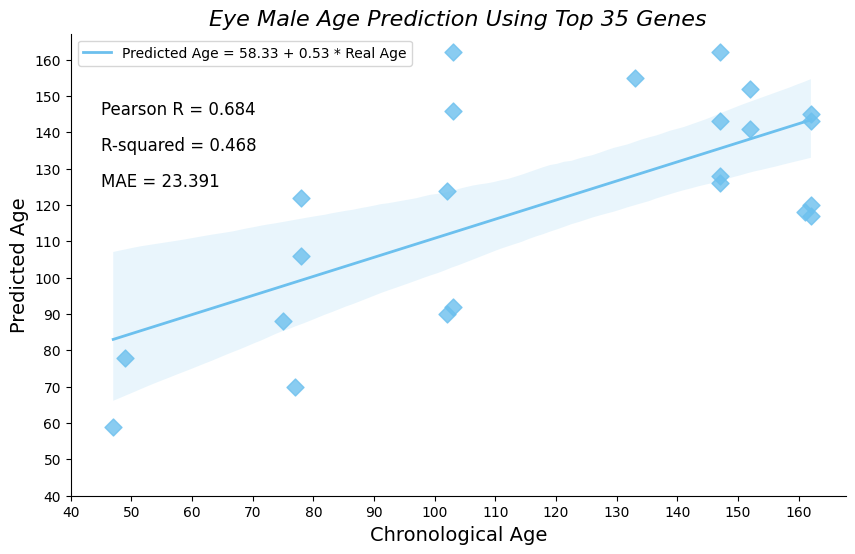


🔬 Performance for Gene Number: 40
Pearson R: 0.765
R-squared: 0.585
MAE: 20.174


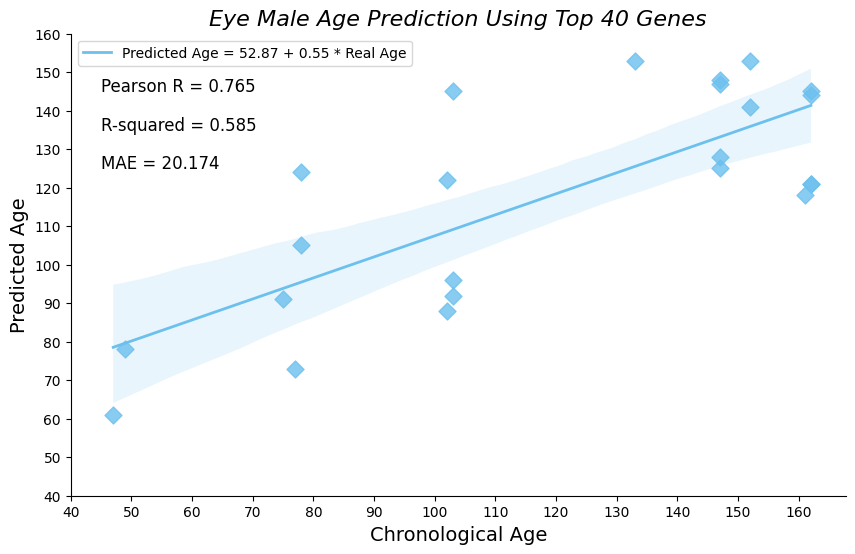


🔬 Performance for Gene Number: 45
Pearson R: 0.749
R-squared: 0.561
MAE: 20.696


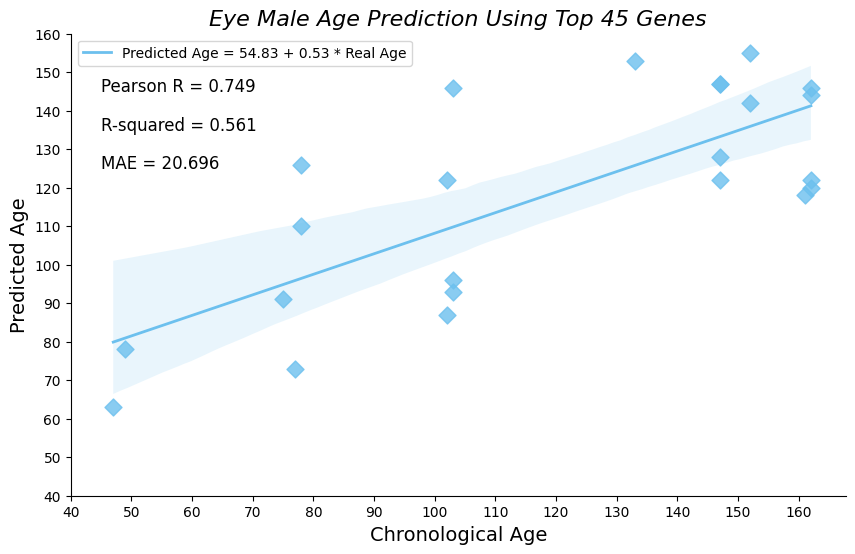


🔬 Performance for Gene Number: 50
Pearson R: 0.743
R-squared: 0.553
MAE: 20.870


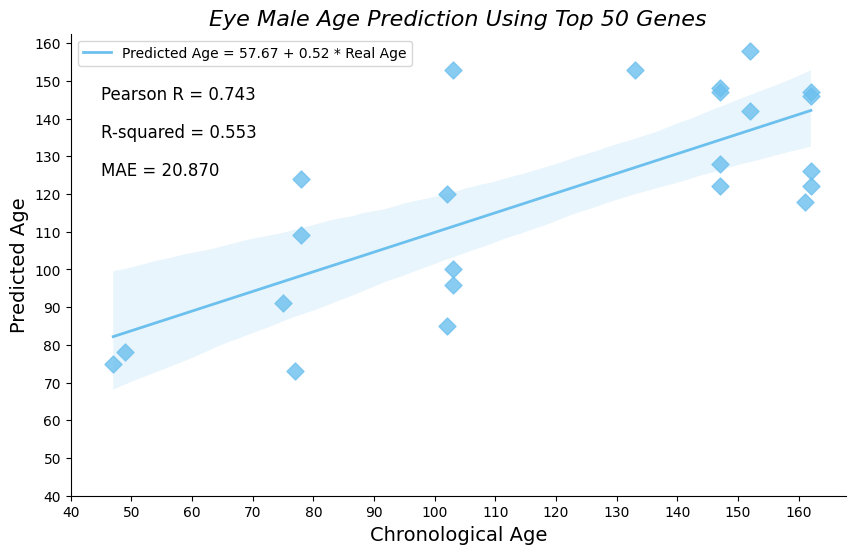


✅ Best Performing Clock (Based on Lowest MAE):
Top 20 Genes
Pearson R: 0.799
R-squared: 0.638
MAE: 20.000
Slope: 0.615
Intercept: 44.798


In [156]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    eye_predicted_ages = pd.DataFrame(index=eye_df_male_age.index, columns=["prediction"])

    for sample in eye_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/eye/reference/eye_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_eye_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_eye_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        eye_predicted_ages.loc[sample, "prediction"] = max_probability_age

    eye_predicted_ages["true_age"] = eye_df_male_age["age"].tolist()
    eye_predicted_ages['age'] = pd.to_numeric(eye_predicted_ages['true_age'], errors='coerce')
    eye_predicted_ages['prediction'] = pd.to_numeric(eye_predicted_ages['prediction'], errors='coerce')
    eye_df_male_predictions = eye_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        eye_df_male_predictions['age'], eye_df_male_predictions['prediction']
    )

    eye_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(eye_df_male_predictions['age'], eye_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": eye_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {eye_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=eye_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {eye_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Eye Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Spinal Cord

In [157]:
spinal_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "SpinalCord"]

spinal_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A10_2,6,720,1913,484,462,710,1745,747,1132,785,...,278,2082,44,2019,1827,251,380,M,SpinalCord,75
A11_2,18,1072,2252,790,413,1312,2765,1234,1979,1236,...,245,2435,115,2830,2170,477,555,F,SpinalCord,52
A12_2,9,611,1614,536,378,729,2021,1179,1119,760,...,210,1870,42,2445,1624,211,327,M,SpinalCord,161
A9_2,22,894,2610,848,637,915,3089,1368,1554,1058,...,431,2987,74,2925,2466,306,641,M,SpinalCord,162
B10_2,14,461,1361,372,239,581,1304,983,974,522,...,212,1312,50,1348,1090,180,240,M,SpinalCord,103


In [158]:
spinal_age_days_value_counts = spinal_df_counts["age_days"].value_counts().index.tolist()

In [159]:
spinal_age_steps = sorted(spinal_age_days_value_counts)

print(spinal_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [160]:
spinal_gene_expression_data = spinal_df_counts.iloc[:, :-3]

In [161]:
spinal_df_age = spinal_gene_expression_data.copy()

In [162]:
spinal_df_age["age"] = spinal_df_counts["age_days"].tolist()

spinal_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A10_2,6,720,1913,484,462,710,1745,747,1132,785,...,209,1277,278,2082,44,2019,1827,251,380,75
A11_2,18,1072,2252,790,413,1312,2765,1234,1979,1236,...,372,1489,245,2435,115,2830,2170,477,555,52
A12_2,9,611,1614,536,378,729,2021,1179,1119,760,...,266,952,210,1870,42,2445,1624,211,327,161


#### Female

In [163]:
spinal_df_female = spinal_df_counts.loc[spinal_df_counts.iloc[:,-3] == "F"]

spinal_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A11_2,18,1072,2252,790,413,1312,2765,1234,1979,1236,...,245,2435,115,2830,2170,477,555,F,SpinalCord,52
B9_2,12,818,1654,536,390,831,1866,1404,1206,697,...,222,1636,54,2134,1913,234,400,F,SpinalCord,155
C11_2,18,589,1383,313,315,622,1745,995,985,610,...,212,1411,39,1676,1225,149,234,F,SpinalCord,78
C9_2,30,1054,2996,763,572,1526,3356,1351,2028,1287,...,381,3191,91,3778,3476,418,688,F,SpinalCord,78
D10_2,68,620,1291,303,328,625,1546,1336,1144,556,...,150,1402,28,1729,1706,294,377,F,SpinalCord,147


In [164]:
age_days_value_counts_female = spinal_df_female["age_days"].value_counts().index.tolist()

In [165]:
spinal_age_steps_female = sorted(age_days_value_counts_female)

In [166]:
spinal_gene_expression_data_female = spinal_df_female.iloc[:,:-3]

In [167]:
spinal_df_female_age = spinal_gene_expression_data_female.copy()

In [168]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
spinal_df_female_age["age"] = spinal_df_female["age_days"].tolist()

In [169]:
#for sample in spinal_df_female_age.index.tolist():

#    new_df = spinal_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spinal/sample/spinal_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [170]:
spinal_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [171]:
new_spinal_age_steps_female = np.arange(min(spinal_age_steps_female), max(spinal_age_steps_female) + 1, 1)

#### Reference Generation

In [172]:
#counter = 0

#for sample in spinal_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spinal/sample/spinal_female_{sample}.csv",
#                            reference_name=f"spinal_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spinal/reference/",
#                            age_prediction="list",
#                            age_list=new_spinal_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.941
R-squared: 0.885
MAE: 9.870


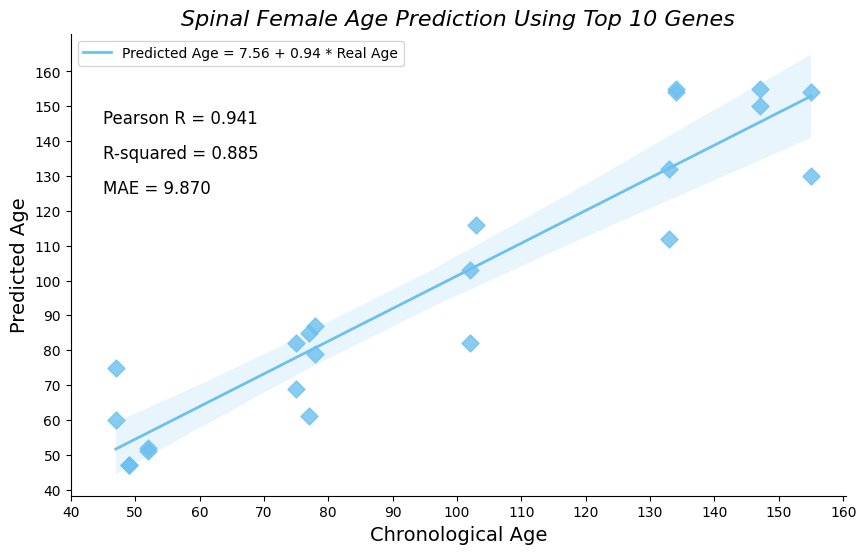


🔬 Performance for Gene Number: 15
Pearson R: 0.911
R-squared: 0.831
MAE: 12.261


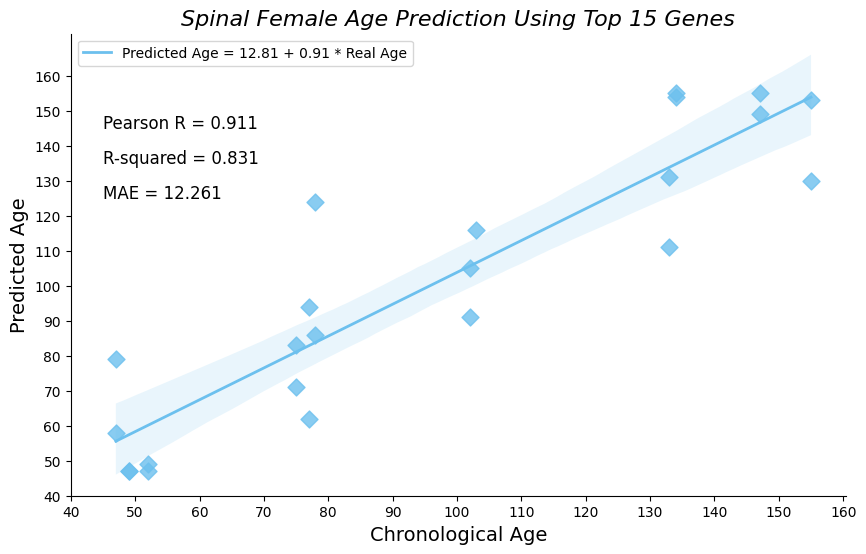


🔬 Performance for Gene Number: 20
Pearson R: 0.947
R-squared: 0.896
MAE: 10.174


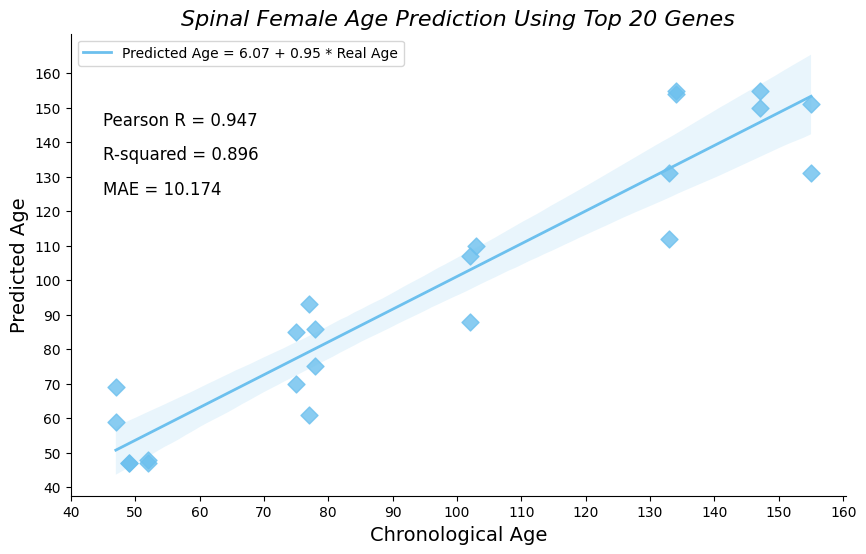


🔬 Performance for Gene Number: 25
Pearson R: 0.908
R-squared: 0.825
MAE: 12.435


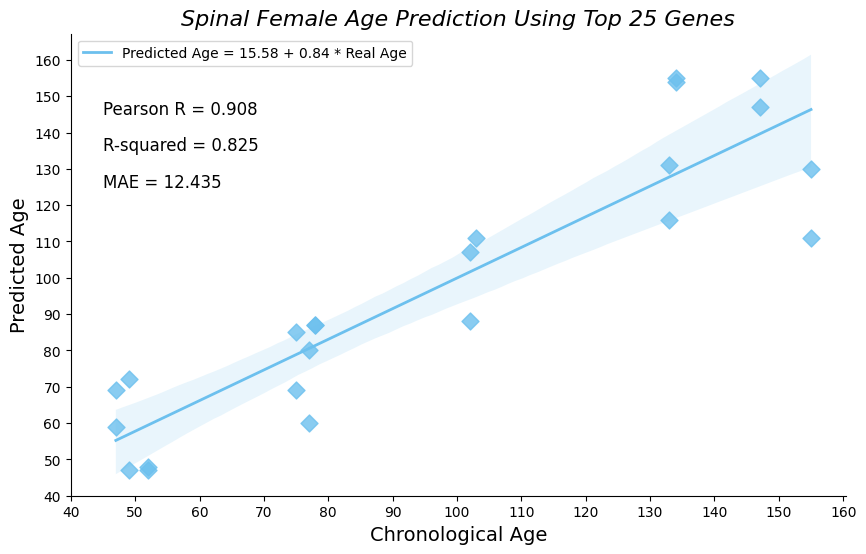


🔬 Performance for Gene Number: 30
Pearson R: 0.936
R-squared: 0.876
MAE: 11.000


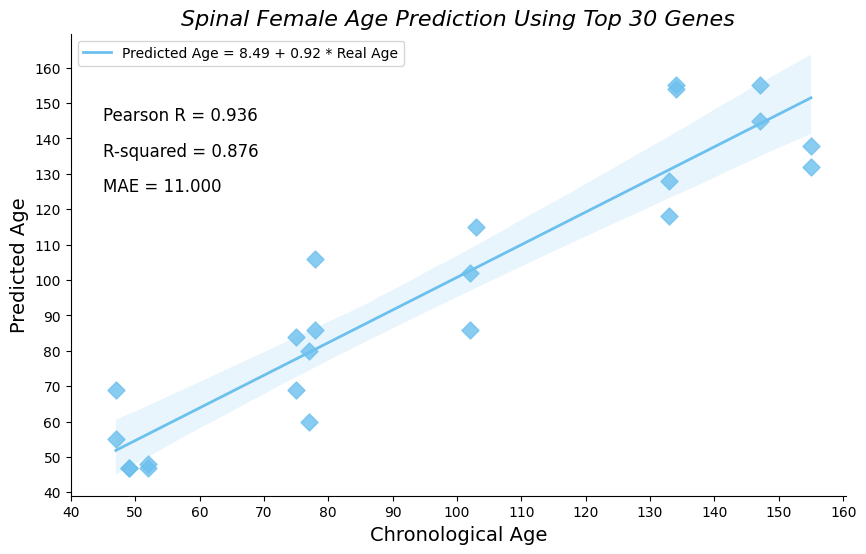


🔬 Performance for Gene Number: 35
Pearson R: 0.920
R-squared: 0.846
MAE: 12.348


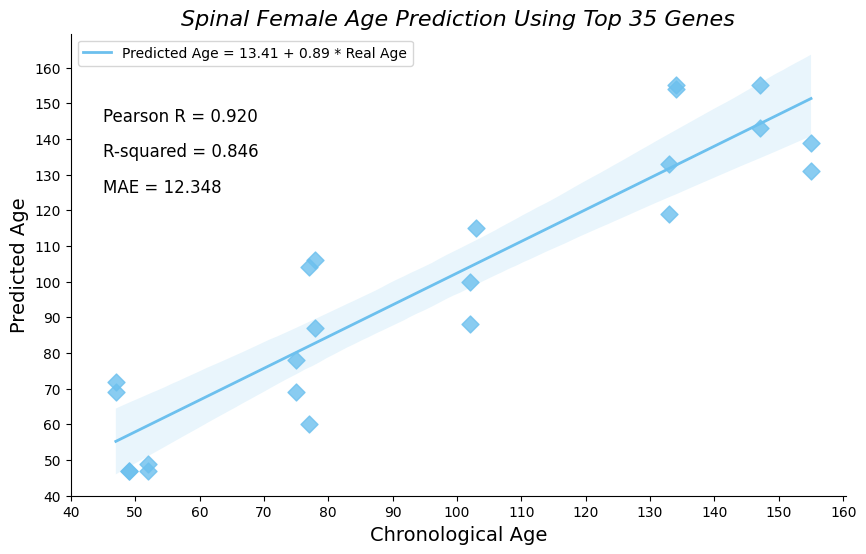


🔬 Performance for Gene Number: 40
Pearson R: 0.915
R-squared: 0.838
MAE: 12.696


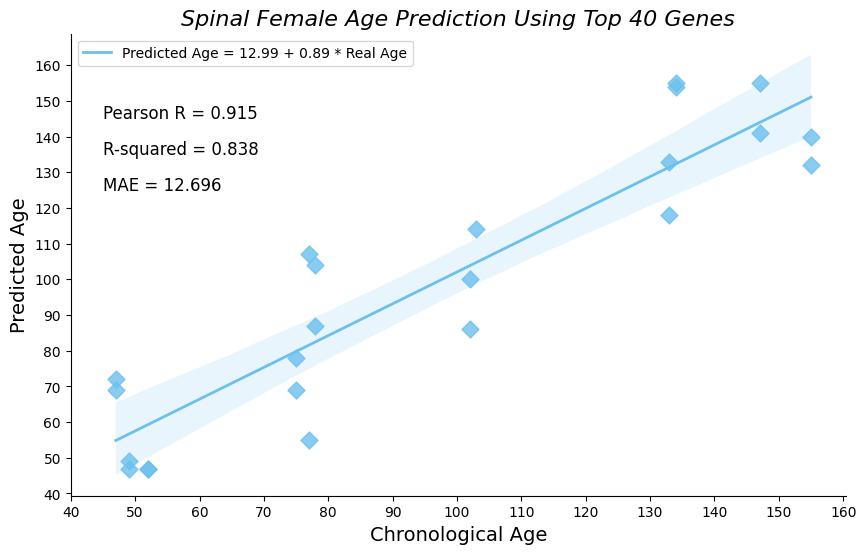


🔬 Performance for Gene Number: 45
Pearson R: 0.898
R-squared: 0.806
MAE: 13.696


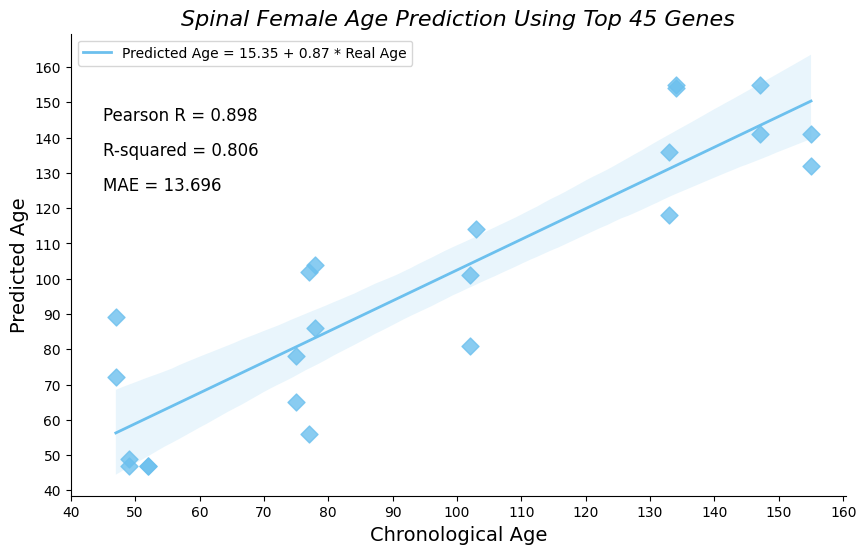


🔬 Performance for Gene Number: 50
Pearson R: 0.860
R-squared: 0.740
MAE: 15.348


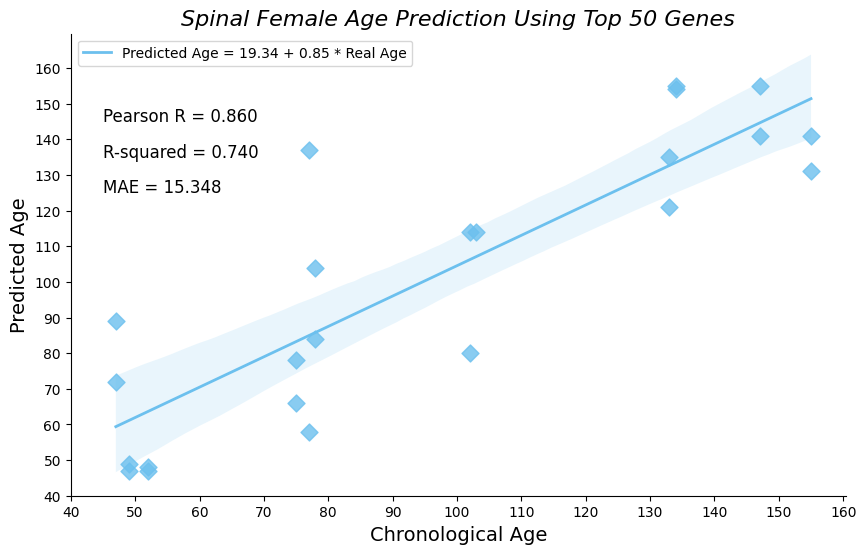


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.941
R-squared: 0.885
MAE: 9.870
Slope: 0.938
Intercept: 7.556


In [173]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    spinal_predicted_ages = pd.DataFrame(index=spinal_df_female_age.index, columns=["prediction"])

    for sample in spinal_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spinal/reference/spinal_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_spinal_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_spinal_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        spinal_predicted_ages.loc[sample, "prediction"] = max_probability_age

    spinal_predicted_ages["true_age"] = spinal_df_female_age["age"].tolist()
    spinal_predicted_ages['age'] = pd.to_numeric(spinal_predicted_ages['true_age'], errors='coerce')
    spinal_predicted_ages['prediction'] = pd.to_numeric(spinal_predicted_ages['prediction'], errors='coerce')
    spinal_df_female_predictions = spinal_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        spinal_df_female_predictions['age'], spinal_df_female_predictions['prediction']
    )

    spinal_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(spinal_df_female_predictions['age'], spinal_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": spinal_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {spinal_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=spinal_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {spinal_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Spinal Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [174]:
spinal_df_male = spinal_df_counts.loc[spinal_df_counts.iloc[:,-3] == "M"]

spinal_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A10_2,6,720,1913,484,462,710,1745,747,1132,785,...,278,2082,44,2019,1827,251,380,M,SpinalCord,75
A12_2,9,611,1614,536,378,729,2021,1179,1119,760,...,210,1870,42,2445,1624,211,327,M,SpinalCord,161
A9_2,22,894,2610,848,637,915,3089,1368,1554,1058,...,431,2987,74,2925,2466,306,641,M,SpinalCord,162
B10_2,14,461,1361,372,239,581,1304,983,974,522,...,212,1312,50,1348,1090,180,240,M,SpinalCord,103
B11_2,24,832,1905,440,431,796,1982,862,1454,887,...,164,1954,95,2239,1767,205,326,M,SpinalCord,52


In [175]:
age_days_value_counts_male = spinal_df_male["age_days"].value_counts().index.tolist()

In [176]:
spinal_age_steps_male = sorted(age_days_value_counts_male)

In [177]:
spinal_gene_expression_data_male = spinal_df_male.iloc[:,:-3]

In [178]:
spinal_df_male_age = spinal_gene_expression_data_male.copy()

In [179]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
spinal_df_male_age["age"] = spinal_df_male["age_days"].tolist()

In [180]:
#for sample in spinal_df_male_age.index.tolist():

#    new_df = spinal_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spinal/sample/spinal_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [181]:
spinal_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [182]:
new_spinal_age_steps_male = np.arange(min(spinal_age_steps_male), max(spinal_age_steps_male) + 1, 1)

In [183]:
#counter = 0

#for sample in spinal_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spinal/sample/spinal_male_{sample}.csv",
#                            reference_name=f"spinal_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spinal/reference/",
#                            age_prediction="list",
#                            age_list=new_spinal_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)


🔬 Performance for Gene Number: 10
Pearson R: 0.650
R-squared: 0.422
MAE: 22.742


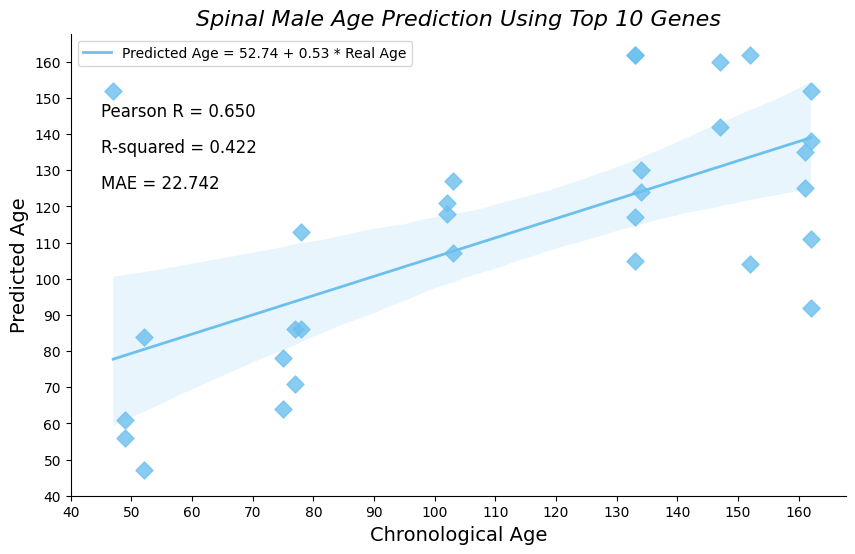


🔬 Performance for Gene Number: 15
Pearson R: 0.825
R-squared: 0.681
MAE: 18.581


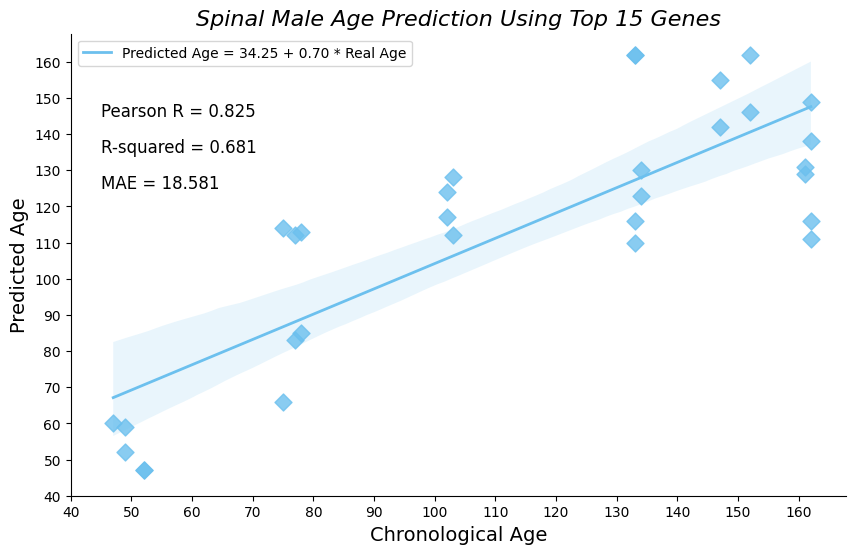


🔬 Performance for Gene Number: 20
Pearson R: 0.861
R-squared: 0.741
MAE: 16.387


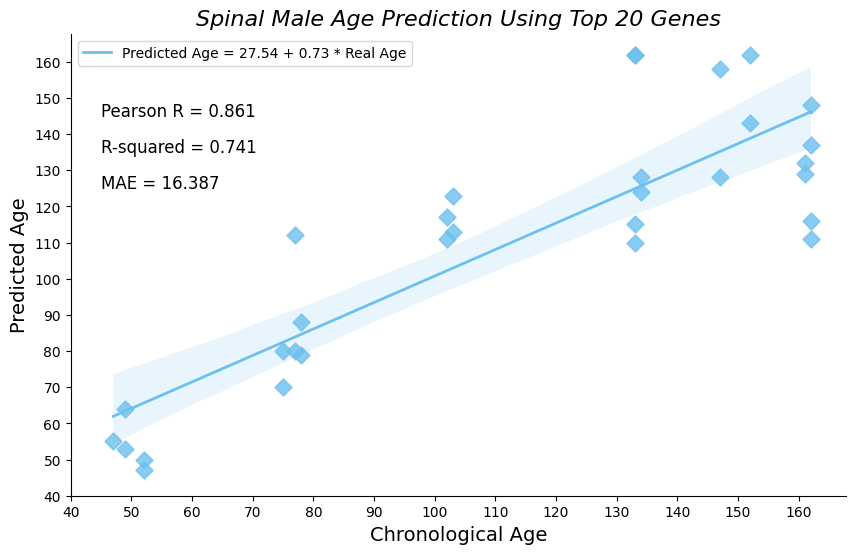


🔬 Performance for Gene Number: 25
Pearson R: 0.811
R-squared: 0.657
MAE: 17.323


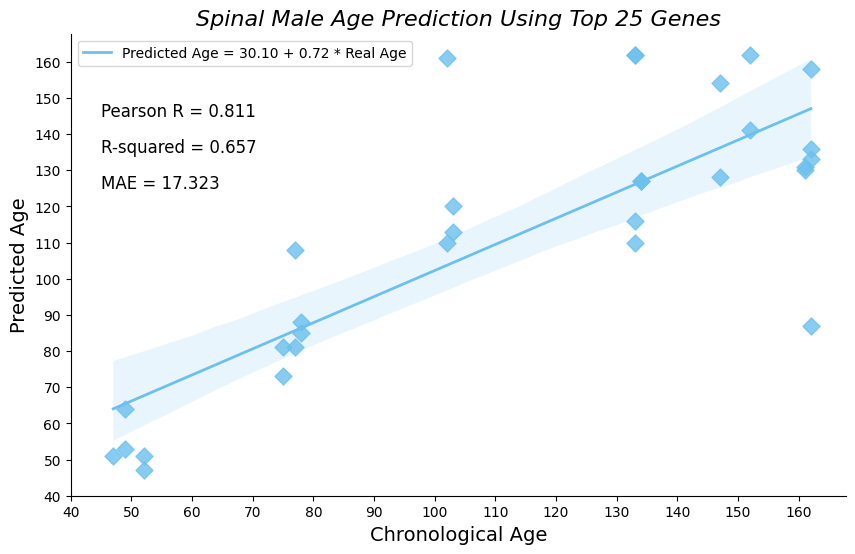


🔬 Performance for Gene Number: 30
Pearson R: 0.835
R-squared: 0.697
MAE: 16.419


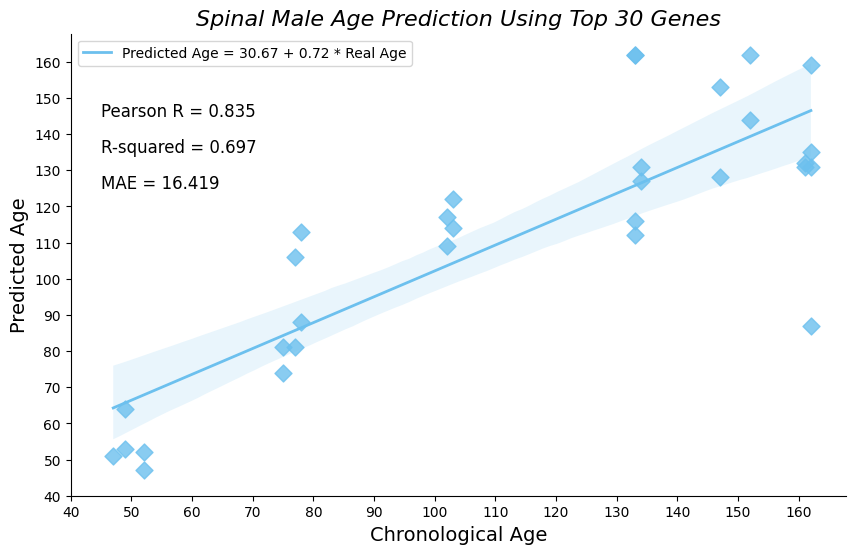


🔬 Performance for Gene Number: 35
Pearson R: 0.818
R-squared: 0.668
MAE: 17.226


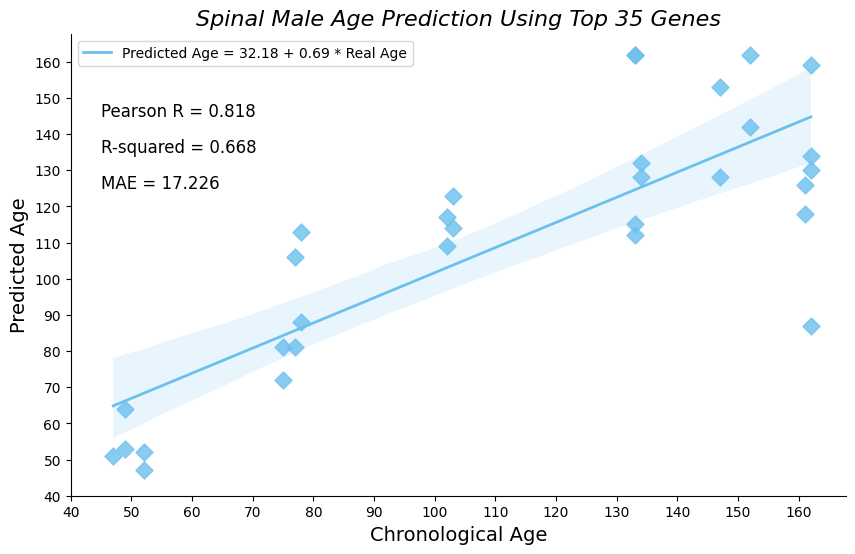


🔬 Performance for Gene Number: 40
Pearson R: 0.814
R-squared: 0.663
MAE: 17.290


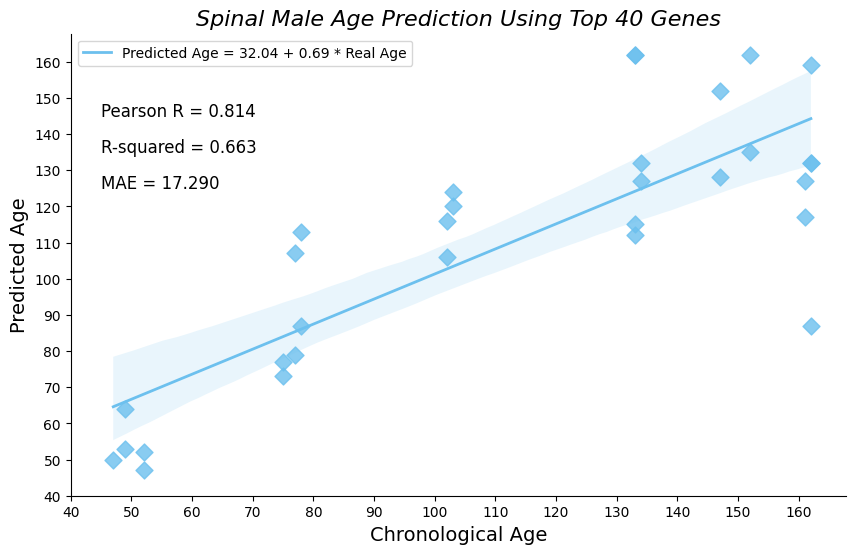


🔬 Performance for Gene Number: 45
Pearson R: 0.814
R-squared: 0.662
MAE: 17.226


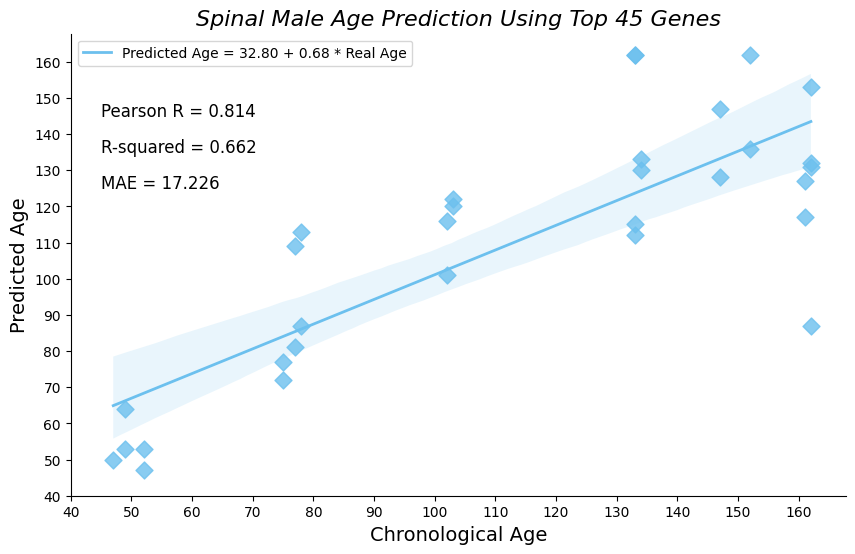


🔬 Performance for Gene Number: 50
Pearson R: 0.810
R-squared: 0.656
MAE: 17.871


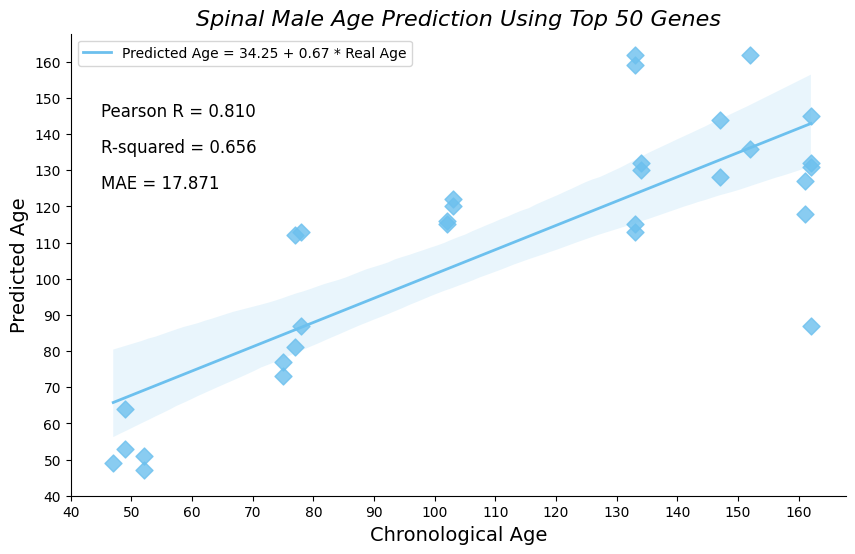


✅ Best Performing Clock (Based on Lowest MAE):
Top 20 Genes
Pearson R: 0.861
R-squared: 0.741
MAE: 16.387
Slope: 0.732
Intercept: 27.540


In [184]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    spinal_predicted_ages = pd.DataFrame(index=spinal_df_male_age.index, columns=["prediction"])

    for sample in spinal_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spinal/reference/spinal_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_spinal_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_spinal_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        spinal_predicted_ages.loc[sample, "prediction"] = max_probability_age

    spinal_predicted_ages["true_age"] = spinal_df_male_age["age"].tolist()
    spinal_predicted_ages['age'] = pd.to_numeric(spinal_predicted_ages['true_age'], errors='coerce')
    spinal_predicted_ages['prediction'] = pd.to_numeric(spinal_predicted_ages['prediction'], errors='coerce')
    spinal_df_male_predictions = spinal_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        spinal_df_male_predictions['age'], spinal_df_male_predictions['prediction']
    )

    spinal_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(spinal_df_male_predictions['age'], spinal_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": spinal_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {spinal_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=spinal_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {spinal_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Spinal Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Spleen

In [185]:
spleen_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Spleen"]

spleen_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A17_2,705,860,359,508,1635,1087,1879,1122,1136,1021,...,242,2250,116,683,2290,152,580,F,Spleen,78
A18_2,184,815,128,647,588,997,3422,1386,815,1152,...,252,1499,24,914,6078,571,714,M,Spleen,152
A19_2,11,650,168,372,599,580,1650,804,360,533,...,203,1100,40,491,3200,231,549,F,Spleen,155
A20_2,291,840,136,402,654,906,1414,729,716,1088,...,150,1835,207,492,2984,196,437,M,Spleen,47
B17_2,165,1017,158,308,703,969,2398,918,875,1099,...,379,1461,114,744,14961,721,590,M,Spleen,102


In [186]:
spleen_age_days_value_counts = spleen_df_counts["age_days"].value_counts().index.tolist()

In [187]:
spleen_age_steps = sorted(spleen_age_days_value_counts)

print(spleen_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [188]:
spleen_gene_expression_data = spleen_df_counts.iloc[:, :-3]

In [189]:
spleen_df_age = spleen_gene_expression_data.copy()

In [190]:
spleen_df_age["age"] = spleen_df_counts["age_days"].tolist()

spleen_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A17_2,705,860,359,508,1635,1087,1879,1122,1136,1021,...,193,1754,242,2250,116,683,2290,152,580,78
A18_2,184,815,128,647,588,997,3422,1386,815,1152,...,206,2023,252,1499,24,914,6078,571,714,152
A19_2,11,650,168,372,599,580,1650,804,360,533,...,87,1231,203,1100,40,491,3200,231,549,155


#### Female

In [191]:
spleen_df_female = spleen_df_counts.loc[spleen_df_counts.iloc[:,-3] == "F"]

spleen_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A17_2,705,860,359,508,1635,1087,1879,1122,1136,1021,...,242,2250,116,683,2290,152,580,F,Spleen,78
A19_2,11,650,168,372,599,580,1650,804,360,533,...,203,1100,40,491,3200,231,549,F,Spleen,155
B18_2,46,1273,385,583,1574,1138,2220,1101,1204,1495,...,291,2257,116,1087,4863,367,902,F,Spleen,75
C18_2,6,814,259,585,1395,896,2150,1615,692,1033,...,299,1622,51,1271,3441,298,975,F,Spleen,75
C19_2,37,1789,298,1108,1035,1450,3102,1112,1532,1983,...,369,2552,219,1201,7552,779,970,F,Spleen,155


In [192]:
age_days_value_counts_female = spleen_df_female["age_days"].value_counts().index.tolist()

In [193]:
spleen_age_steps_female = sorted(age_days_value_counts_female)

In [194]:
spleen_gene_expression_data_female = spleen_df_female.iloc[:,:-3]

In [195]:
spleen_df_female_age = spleen_gene_expression_data_female.copy()

In [196]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
spleen_df_female_age["age"] = spleen_df_female["age_days"].tolist()

In [197]:
#for sample in spleen_df_female_age.index.tolist():

#    new_df = spleen_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spleen/sample/spleen_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [198]:
spleen_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [199]:
new_spleen_age_steps_female = np.arange(min(spleen_age_steps_female), max(spleen_age_steps_female) + 1, 1)

#### Reference Generation

In [200]:
#counter = 0

#for sample in spleen_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spleen/sample/spleen_female_{sample}.csv",
#                            reference_name=f"spleen_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spleen/reference/",
#                            age_prediction="list",
#                            age_list=new_spleen_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.870
R-squared: 0.757
MAE: 12.609


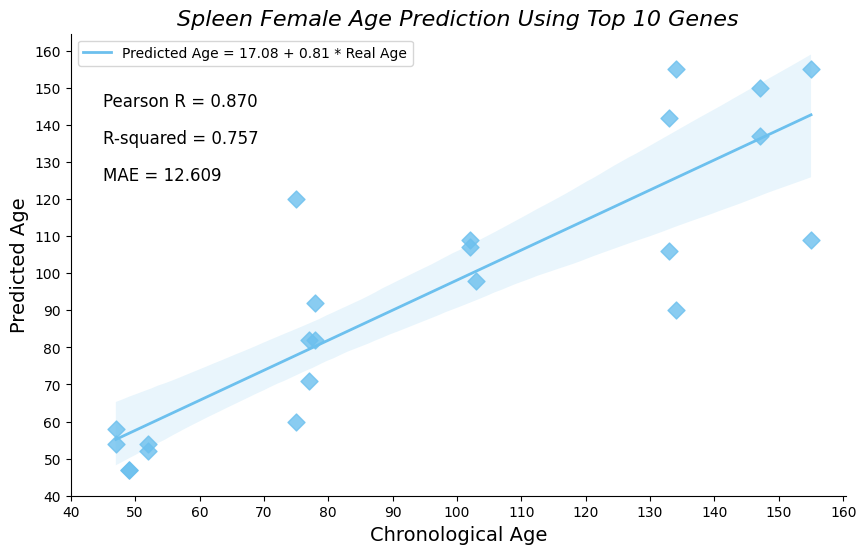


🔬 Performance for Gene Number: 15
Pearson R: 0.882
R-squared: 0.778
MAE: 12.913


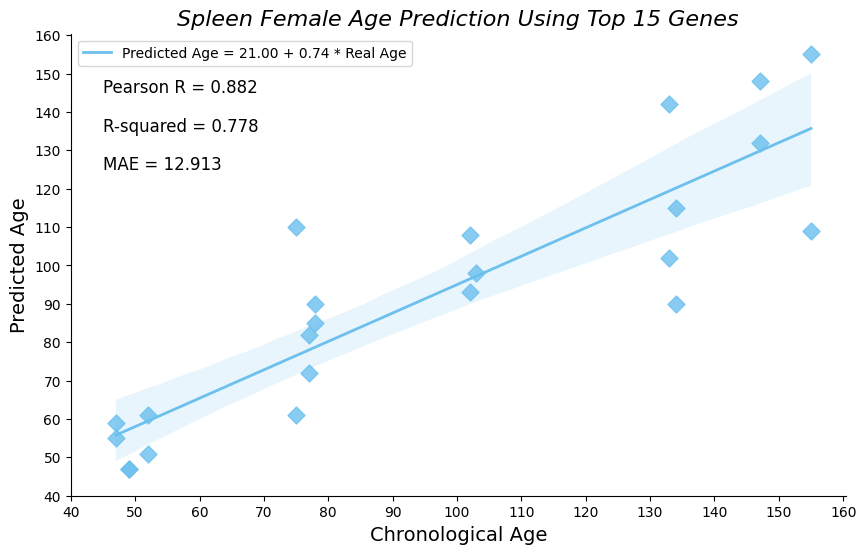


🔬 Performance for Gene Number: 20
Pearson R: 0.885
R-squared: 0.784
MAE: 12.348


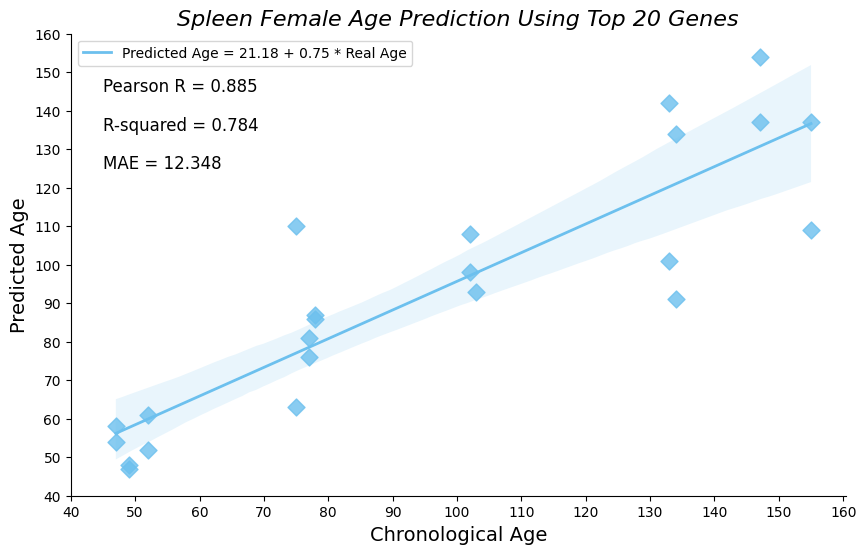


🔬 Performance for Gene Number: 25
Pearson R: 0.857
R-squared: 0.734
MAE: 15.652


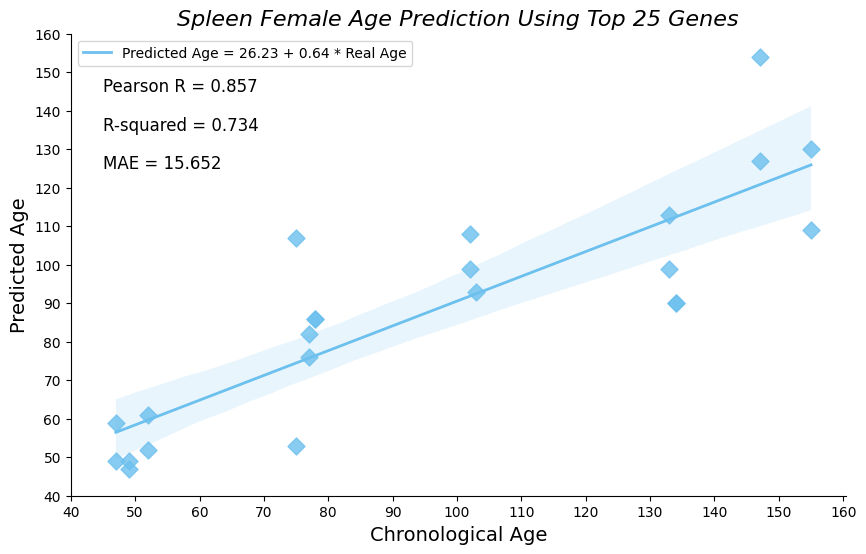


🔬 Performance for Gene Number: 30
Pearson R: 0.869
R-squared: 0.756
MAE: 14.478


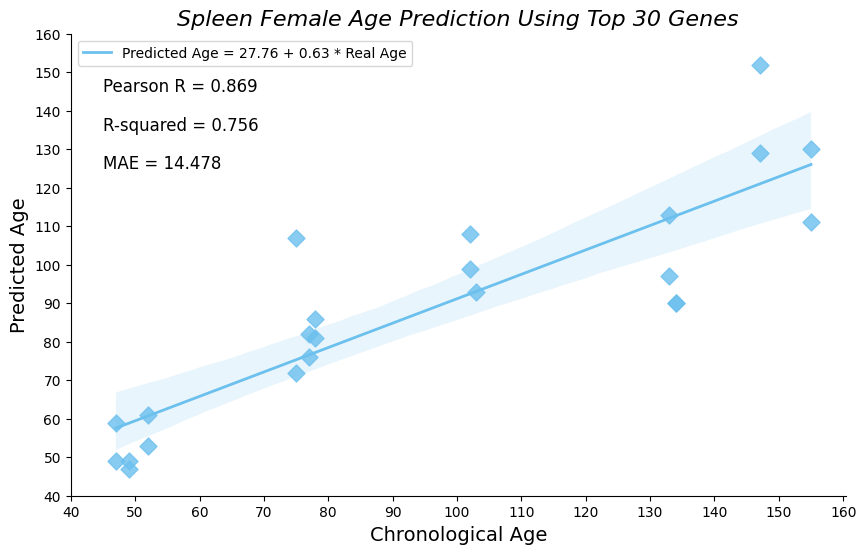


🔬 Performance for Gene Number: 35
Pearson R: 0.855
R-squared: 0.732
MAE: 14.957


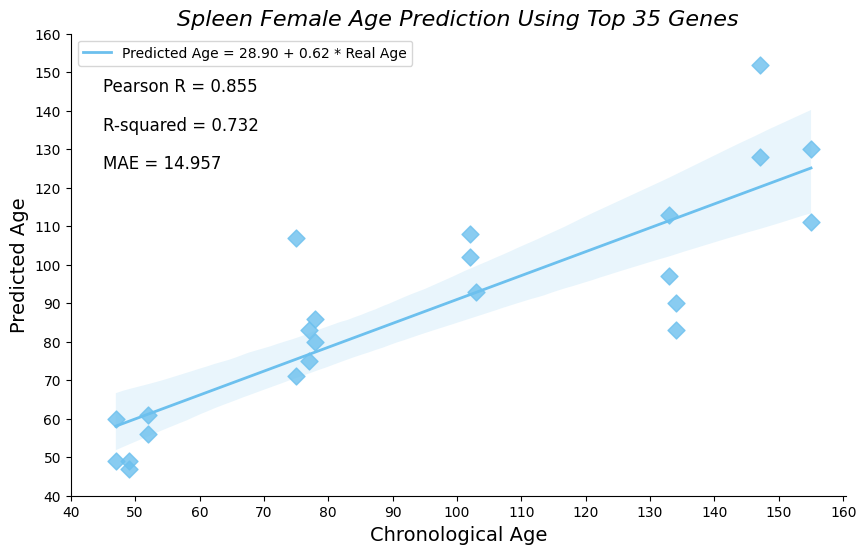


🔬 Performance for Gene Number: 40
Pearson R: 0.851
R-squared: 0.724
MAE: 15.870


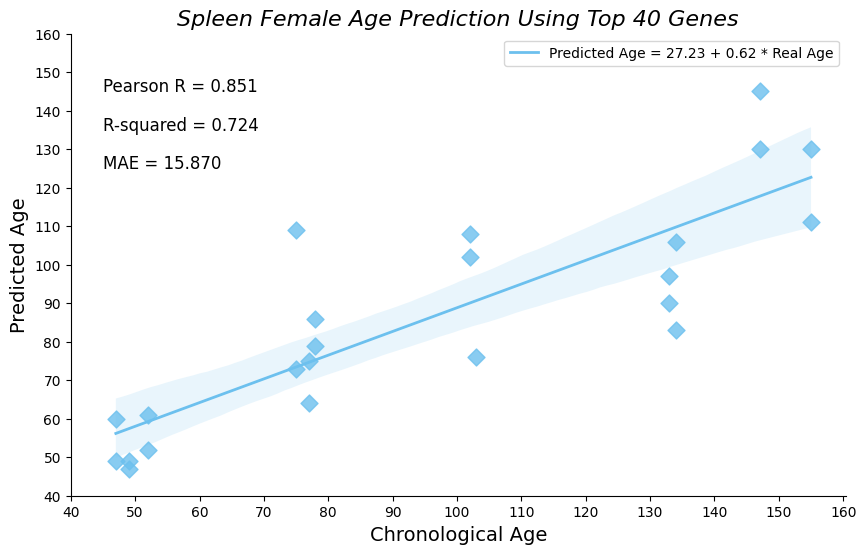


🔬 Performance for Gene Number: 45
Pearson R: 0.792
R-squared: 0.627
MAE: 19.957


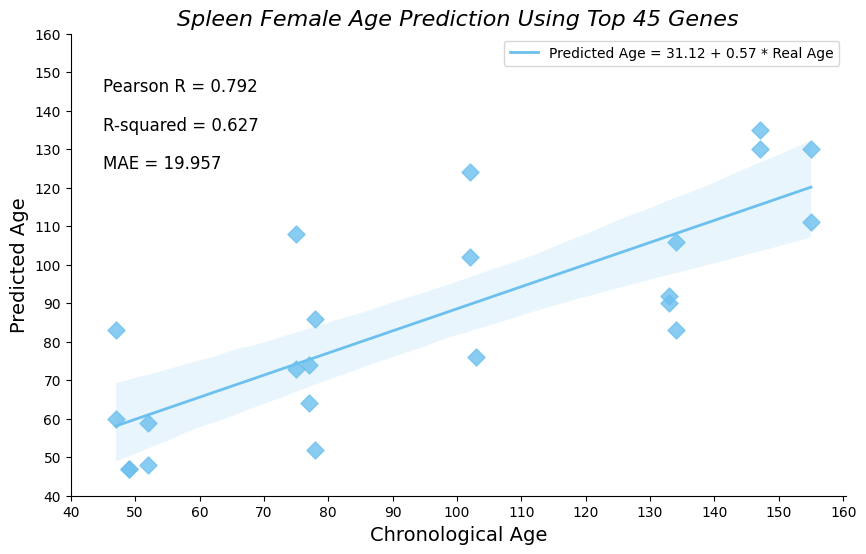


🔬 Performance for Gene Number: 50
Pearson R: 0.800
R-squared: 0.641
MAE: 18.783


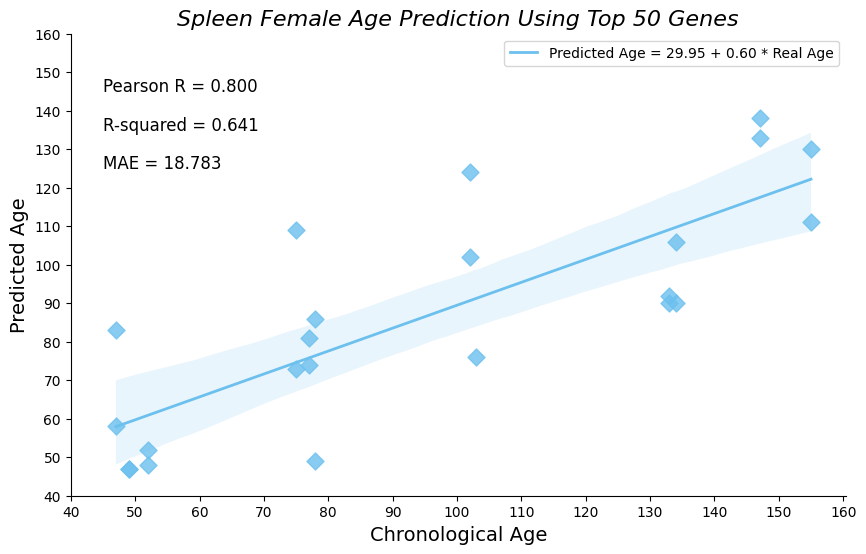


✅ Best Performing Clock (Based on Lowest MAE):
Top 20 Genes
Pearson R: 0.885
R-squared: 0.784
MAE: 12.348
Slope: 0.745
Intercept: 21.179


In [201]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    spleen_predicted_ages = pd.DataFrame(index=spleen_df_female_age.index, columns=["prediction"])

    for sample in spleen_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/spleen/reference/spleen_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_spleen_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_spleen_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        spleen_predicted_ages.loc[sample, "prediction"] = max_probability_age

    spleen_predicted_ages["true_age"] = spleen_df_female_age["age"].tolist()
    spleen_predicted_ages['age'] = pd.to_numeric(spleen_predicted_ages['true_age'], errors='coerce')
    spleen_predicted_ages['prediction'] = pd.to_numeric(spleen_predicted_ages['prediction'], errors='coerce')
    spleen_df_female_predictions = spleen_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        spleen_df_female_predictions['age'], spleen_df_female_predictions['prediction']
    )

    spleen_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(spleen_df_female_predictions['age'], spleen_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": spleen_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {spleen_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=spleen_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {spleen_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Spleen Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [202]:
spleen_df_male = spleen_df_counts.loc[spleen_df_counts.iloc[:,-3] == "M"]

spleen_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A18_2,184,815,128,647,588,997,3422,1386,815,1152,...,252,1499,24,914,6078,571,714,M,Spleen,152
A20_2,291,840,136,402,654,906,1414,729,716,1088,...,150,1835,207,492,2984,196,437,M,Spleen,47
B17_2,165,1017,158,308,703,969,2398,918,875,1099,...,379,1461,114,744,14961,721,590,M,Spleen,102
B19_2,128,1193,405,820,1561,1436,2968,2085,1385,1738,...,347,2802,139,1193,6287,446,1153,M,Spleen,78
B20_2,0,801,242,494,1049,737,1888,1089,851,1101,...,262,1565,40,713,4343,367,654,M,Spleen,161


In [203]:
age_days_value_counts_male = spleen_df_male["age_days"].value_counts().index.tolist()

In [204]:
spleen_age_steps_male = sorted(age_days_value_counts_male)

In [205]:
spleen_gene_expression_data_male = spleen_df_male.iloc[:,:-3]

In [206]:
spleen_df_male_age = spleen_gene_expression_data_male.copy()

In [207]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
spleen_df_male_age["age"] = spleen_df_male["age_days"].tolist()

In [208]:
#for sample in spleen_df_male_age.index.tolist():

#    new_df = spleen_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spleen/sample/spleen_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [209]:
spleen_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [210]:
new_spleen_age_steps_male = np.arange(min(spleen_age_steps_male), max(spleen_age_steps_male) + 1, 1)

In [211]:
#counter = 0

#for sample in spleen_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spleen/sample/spleen_male_{sample}.csv",
#                            reference_name=f"spleen_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spleen/reference/",
#                            age_prediction="list",
#                            age_list=new_spleen_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.712
R-squared: 0.507
MAE: 24.250


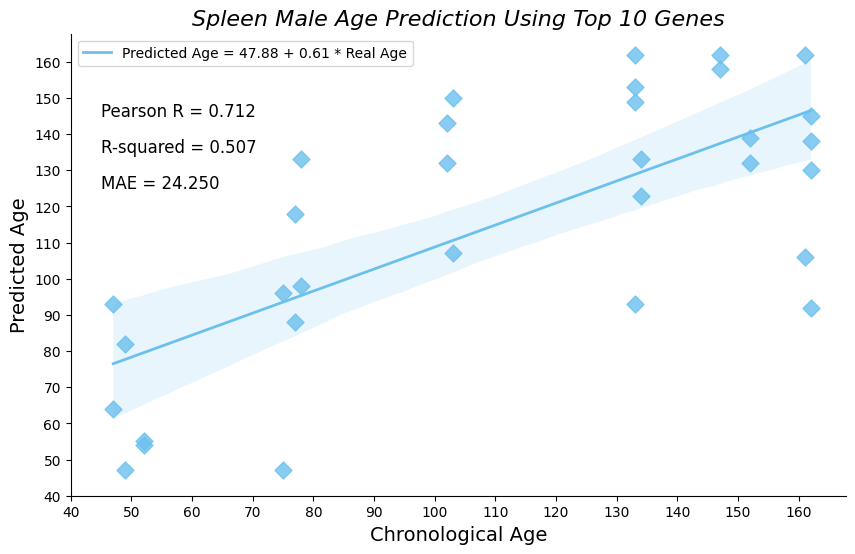


🔬 Performance for Gene Number: 15
Pearson R: 0.753
R-squared: 0.567
MAE: 20.875


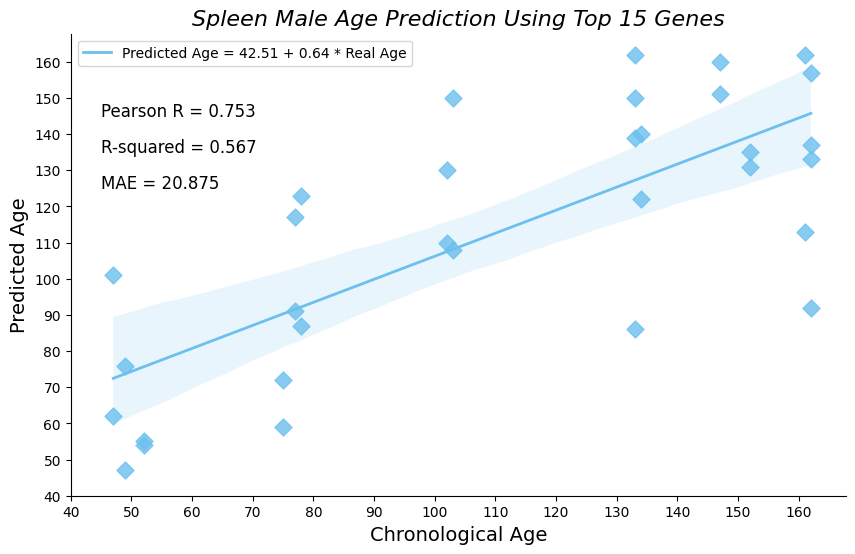


🔬 Performance for Gene Number: 20
Pearson R: 0.773
R-squared: 0.598
MAE: 19.219


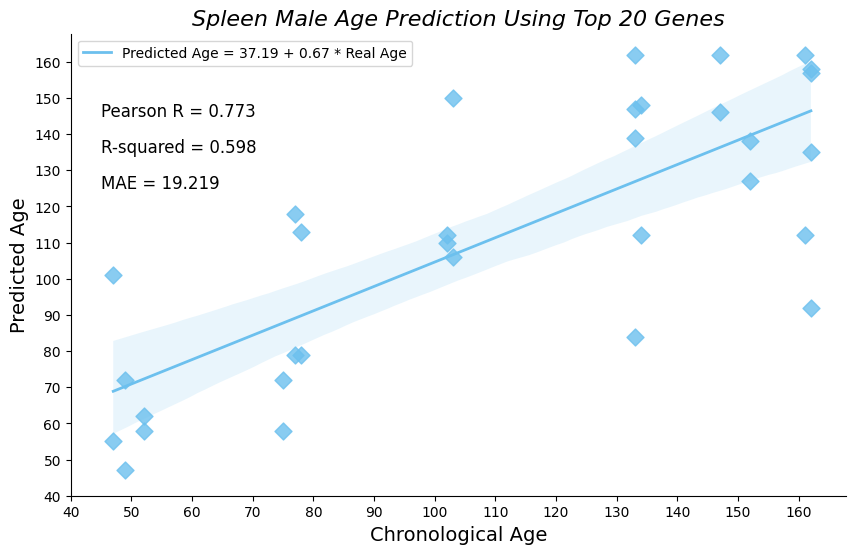


🔬 Performance for Gene Number: 25
Pearson R: 0.785
R-squared: 0.616
MAE: 18.094


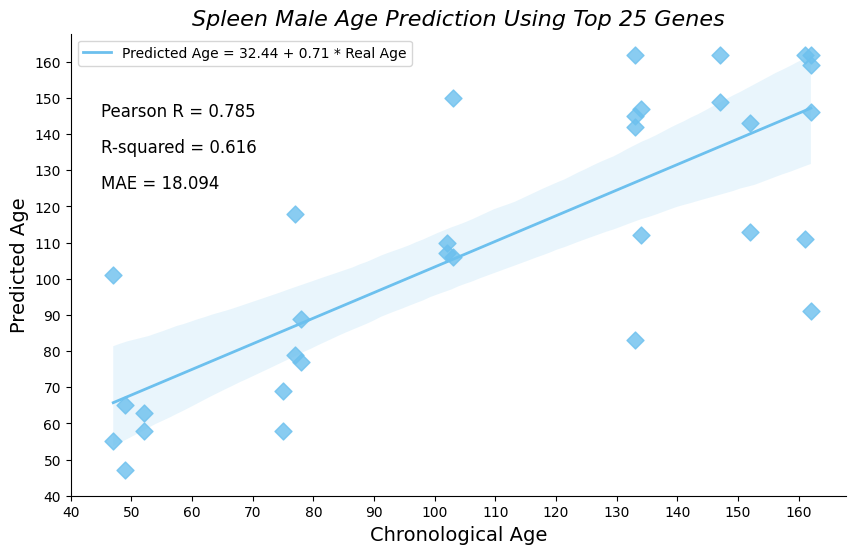


🔬 Performance for Gene Number: 30
Pearson R: 0.789
R-squared: 0.622
MAE: 17.312


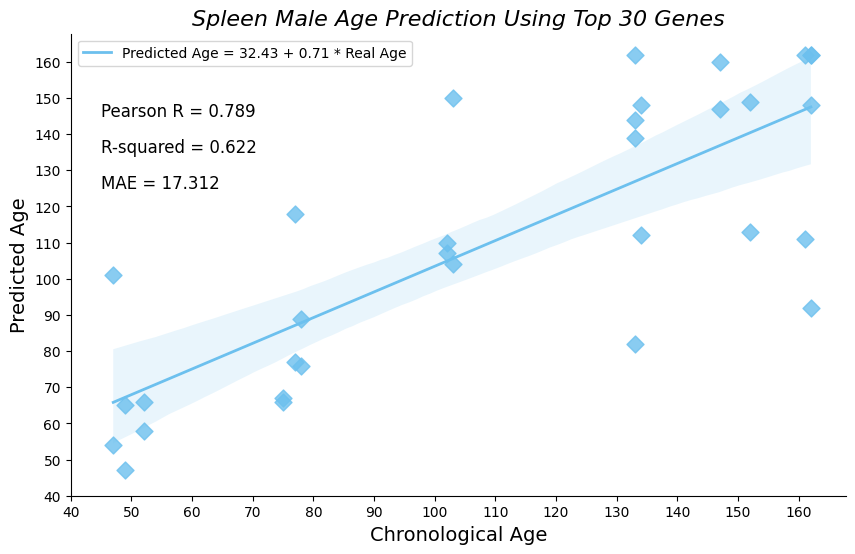


🔬 Performance for Gene Number: 35
Pearson R: 0.789
R-squared: 0.622
MAE: 17.125


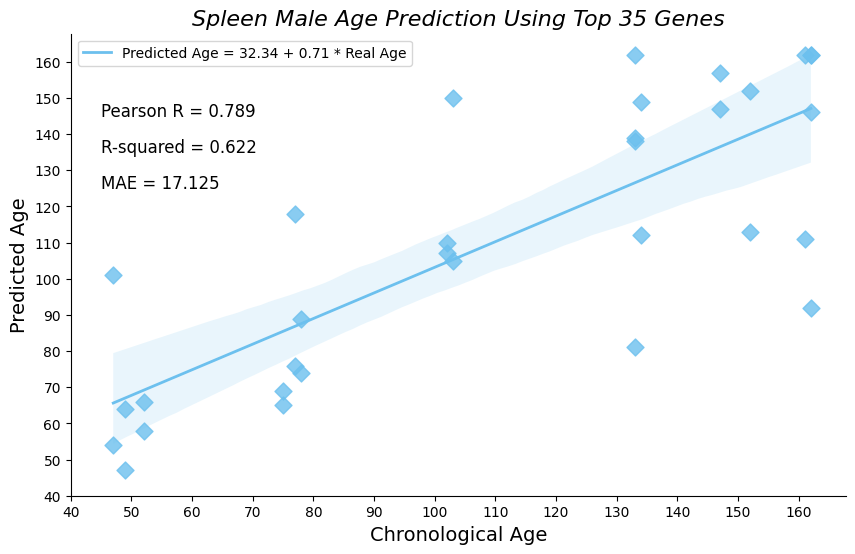


🔬 Performance for Gene Number: 40
Pearson R: 0.788
R-squared: 0.620
MAE: 17.250


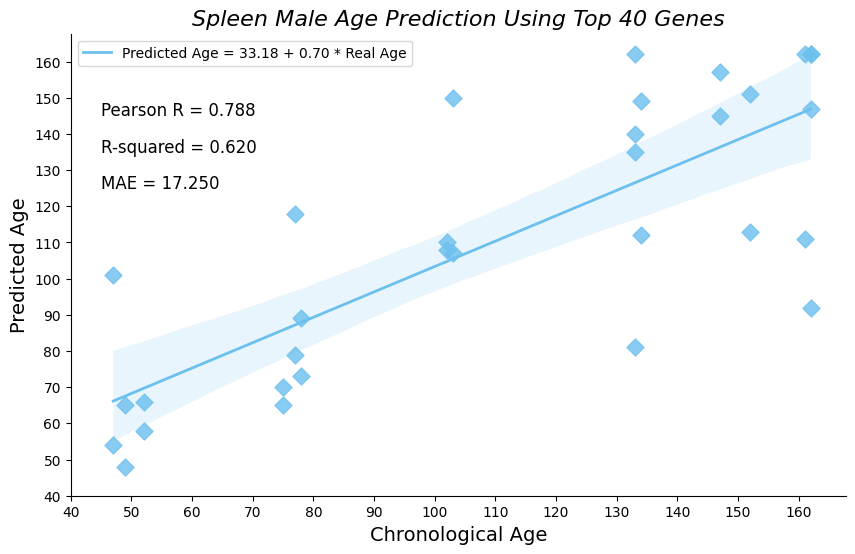


🔬 Performance for Gene Number: 45
Pearson R: 0.782
R-squared: 0.612
MAE: 17.719


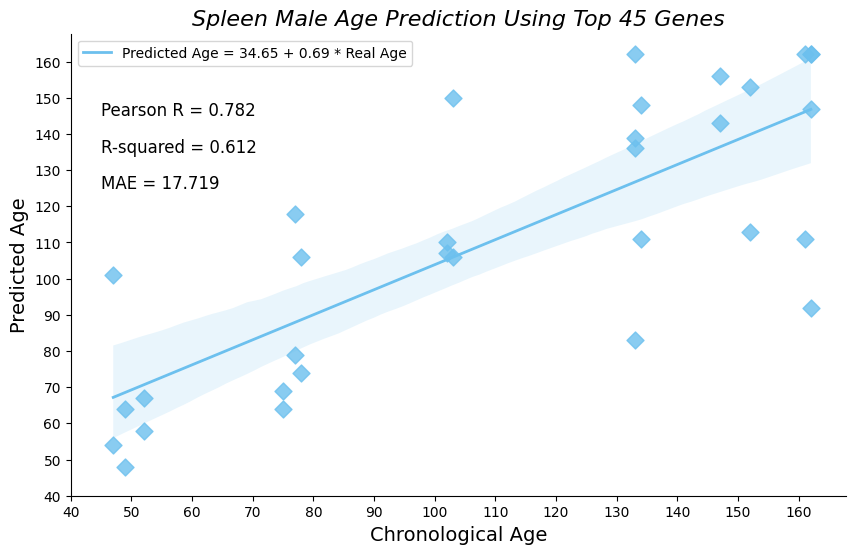


🔬 Performance for Gene Number: 50
Pearson R: 0.774
R-squared: 0.599
MAE: 18.125


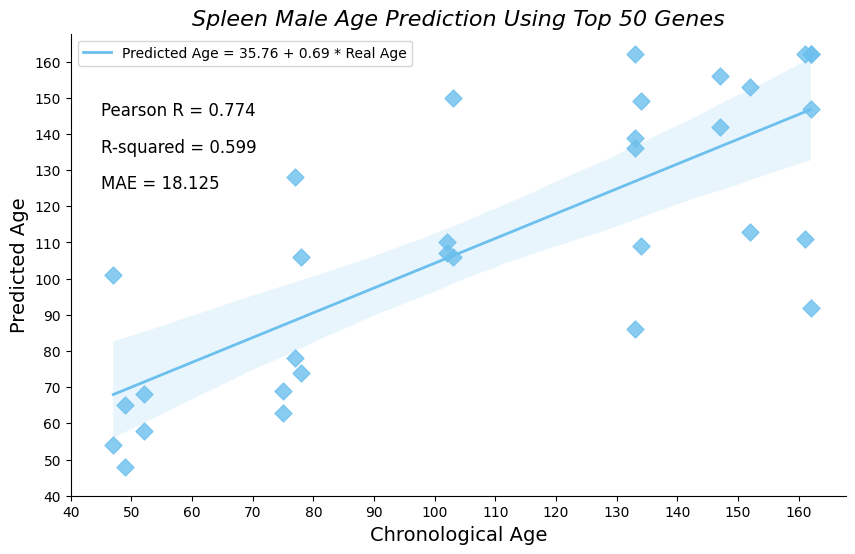


✅ Best Performing Clock (Based on Lowest MAE):
Top 35 Genes
Pearson R: 0.789
R-squared: 0.622
MAE: 17.125
Slope: 0.708
Intercept: 32.335


In [212]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    spleen_predicted_ages = pd.DataFrame(index=spleen_df_male_age.index, columns=["prediction"])

    for sample in spleen_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/spleen/reference/spleen_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_spleen_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_spleen_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        spleen_predicted_ages.loc[sample, "prediction"] = max_probability_age

    spleen_predicted_ages["true_age"] = spleen_df_male_age["age"].tolist()
    spleen_predicted_ages['age'] = pd.to_numeric(spleen_predicted_ages['true_age'], errors='coerce')
    spleen_predicted_ages['prediction'] = pd.to_numeric(spleen_predicted_ages['prediction'], errors='coerce')
    spleen_df_male_predictions = spleen_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        spleen_df_male_predictions['age'], spleen_df_male_predictions['prediction']
    )

    spleen_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(spleen_df_male_predictions['age'], spleen_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": spleen_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {spleen_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=spleen_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {spleen_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Spleen Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

# Liver

In [213]:
liver_df_counts = combined_df.loc[combined_df.iloc[:,-2] == "Liver"]

liver_df_counts.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A5_1,36508,206,3342,296,14,375,356,1593,339,202,...,36,414,0,185,928,108,162,M,Liver,134
A6_1,16717,324,7288,436,30,545,461,617,583,271,...,44,968,116,161,876,297,219,F,Liver,52
A7_1,13509,146,1092,252,36,333,395,486,282,188,...,11,884,0,120,930,170,192,F,Liver,133
A8_1,56721,239,1240,467,30,416,444,1032,402,261,...,52,470,8,229,1014,153,168,M,Liver,133
B5_1,13940,141,1006,154,8,288,292,461,316,172,...,6,558,0,103,648,158,115,F,Liver,102


In [214]:
liver_age_days_value_counts = liver_df_counts["age_days"].value_counts().index.tolist()

In [215]:
liver_age_steps = sorted(liver_age_days_value_counts)

print(liver_age_steps)

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 155, 161, 162]


In [216]:
liver_gene_expression_data = liver_df_counts.iloc[:, :-3]

In [217]:
liver_df_age = liver_gene_expression_data.copy()

In [218]:
liver_df_age["age"] = liver_df_counts["age_days"].tolist()

liver_df_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A5_1,36508,206,3342,296,14,375,356,1593,339,202,...,25,262,36,414,0,185,928,108,162,134
A6_1,16717,324,7288,436,30,545,461,617,583,271,...,72,383,44,968,116,161,876,297,219,52
A7_1,13509,146,1092,252,36,333,395,486,282,188,...,58,389,11,884,0,120,930,170,192,133


#### Female

In [219]:
liver_df_female = liver_df_counts.loc[liver_df_counts.iloc[:,-3] == "F"]

liver_df_female.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A6_1,16717,324,7288,436,30,545,461,617,583,271,...,44,968,116,161,876,297,219,F,Liver,52
A7_1,13509,146,1092,252,36,333,395,486,282,188,...,11,884,0,120,930,170,192,F,Liver,133
B5_1,13940,141,1006,154,8,288,292,461,316,172,...,6,558,0,103,648,158,115,F,Liver,102
B6_1,11838,99,783,134,16,251,210,353,172,166,...,8,702,0,110,425,114,123,F,Liver,134
B8_1,11255,74,917,136,12,150,200,246,202,120,...,16,395,6,95,252,82,93,F,Liver,133


In [220]:
age_days_value_counts_female = liver_df_female["age_days"].value_counts().index.tolist()

In [221]:
liver_age_steps_female = sorted(age_days_value_counts_female)

In [222]:
liver_gene_expression_data_female = liver_df_female.iloc[:,:-3]

In [223]:
liver_df_female_age = liver_gene_expression_data_female.copy()

In [224]:
#brain_df_female["age_days"] = pd.to_numeric(brain_df_female["age_days"], errors='coerce')
liver_df_female_age["age"] = liver_df_female["age_days"].tolist()

In [225]:
#for sample in liver_df_female_age.index.tolist():

#    new_df = liver_df_female_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/liver/sample/liver_female_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [226]:
liver_age_steps_female

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 155]

In [227]:
new_liver_age_steps_female = np.arange(min(liver_age_steps_female), max(liver_age_steps_female) + 1, 1)

In [228]:
new_liver_age_steps_female

array([ 47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,
        60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,
        73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
        86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,
        99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
       112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,
       125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137,
       138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150,
       151, 152, 153, 154, 155])

#### Reference Generation

In [229]:
#counter = 0

#for sample in liver_df_female_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/liver/sample/liver_female_{sample}.csv",
#                            reference_name=f"liver_reference_female_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/liver/reference/",
#                            age_prediction="list",
#                            age_list=new_liver_age_steps_female,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.849
R-squared: 0.721
MAE: 15.217


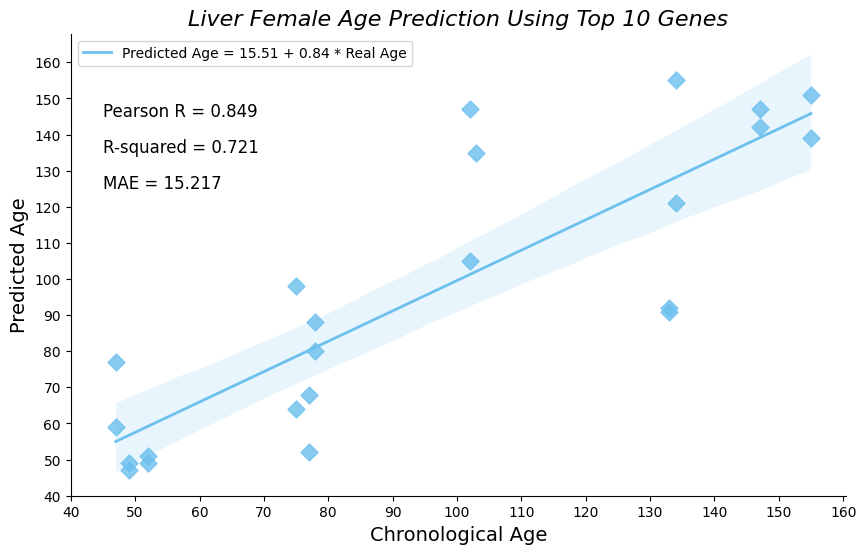


🔬 Performance for Gene Number: 15
Pearson R: 0.844
R-squared: 0.713
MAE: 15.739


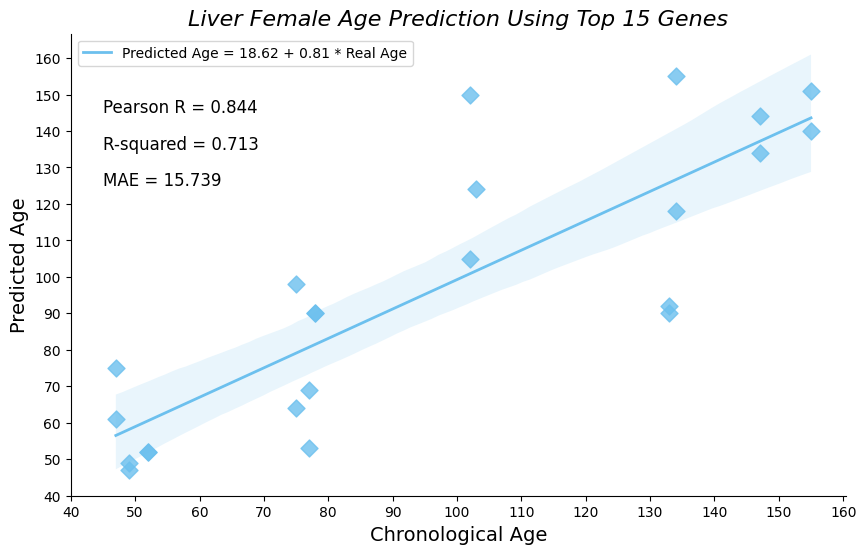


🔬 Performance for Gene Number: 20
Pearson R: 0.823
R-squared: 0.677
MAE: 16.739


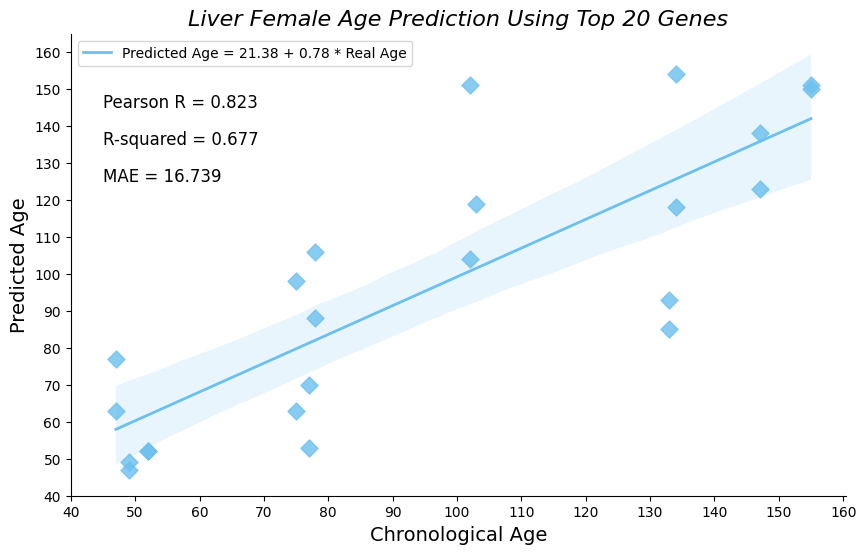


🔬 Performance for Gene Number: 25
Pearson R: 0.809
R-squared: 0.654
MAE: 18.043


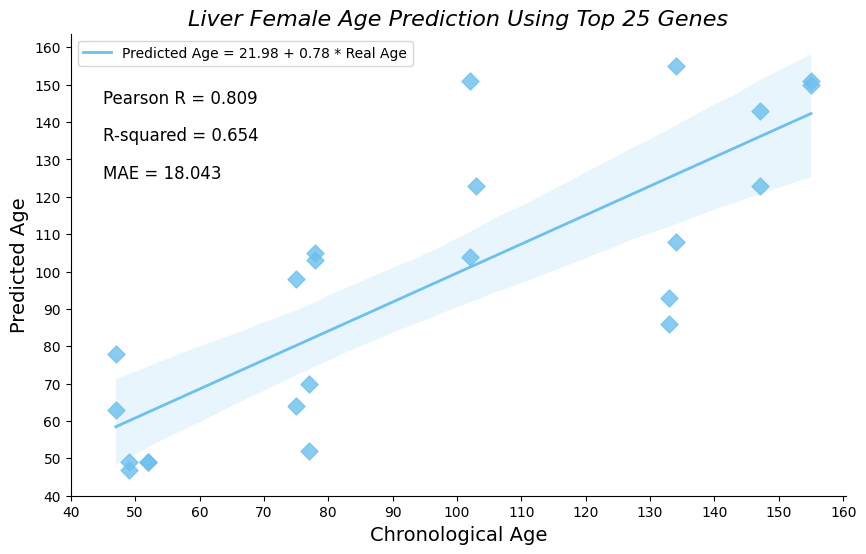


🔬 Performance for Gene Number: 30
Pearson R: 0.822
R-squared: 0.675
MAE: 17.217


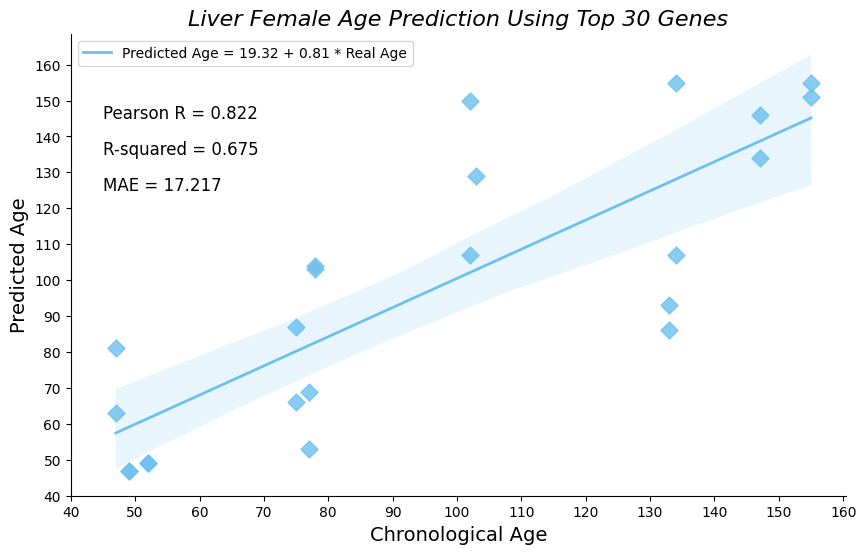


🔬 Performance for Gene Number: 35
Pearson R: 0.820
R-squared: 0.672
MAE: 16.870


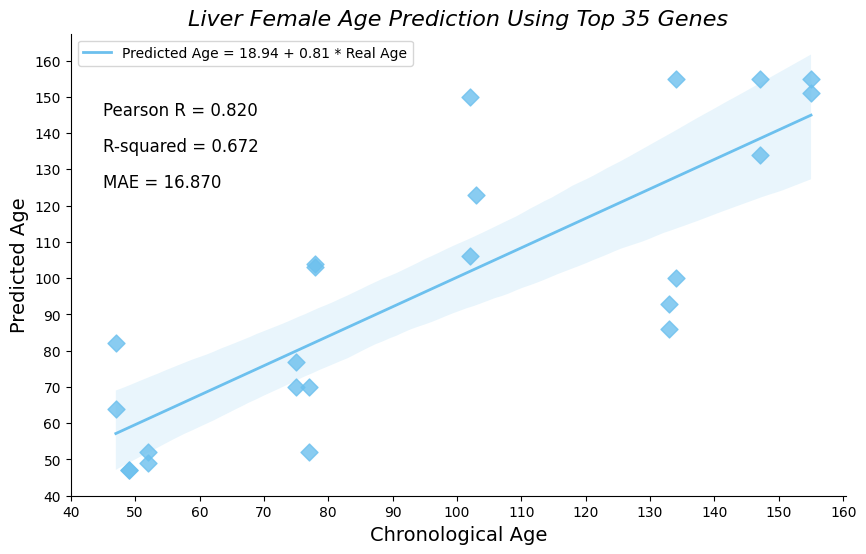


🔬 Performance for Gene Number: 40
Pearson R: 0.810
R-squared: 0.656
MAE: 17.870


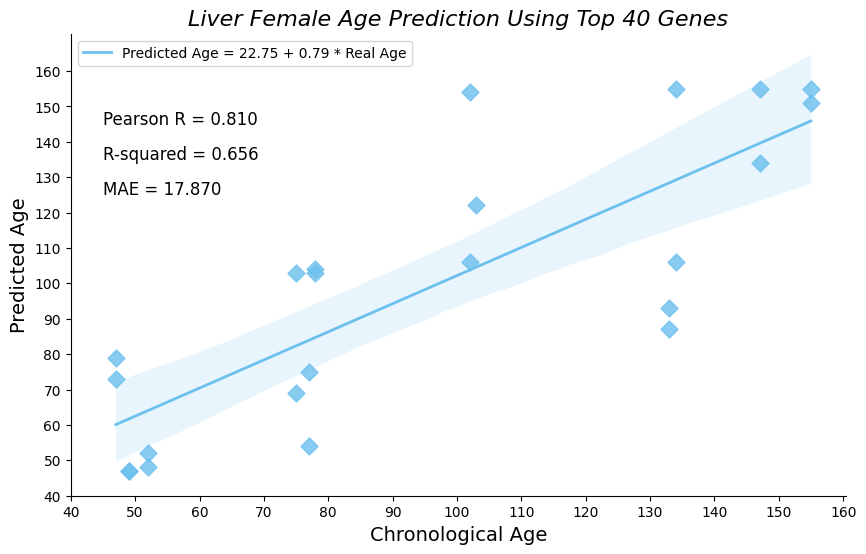


🔬 Performance for Gene Number: 45
Pearson R: 0.807
R-squared: 0.652
MAE: 18.087


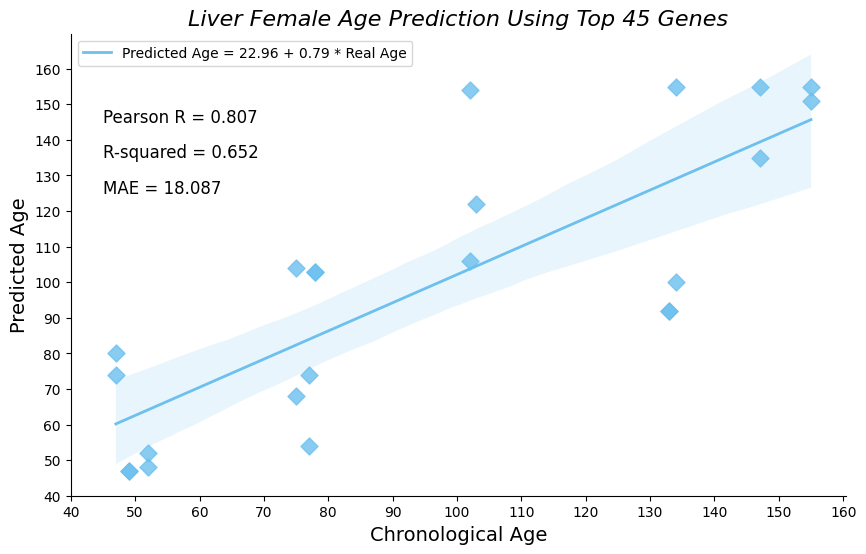


🔬 Performance for Gene Number: 50
Pearson R: 0.810
R-squared: 0.656
MAE: 17.391


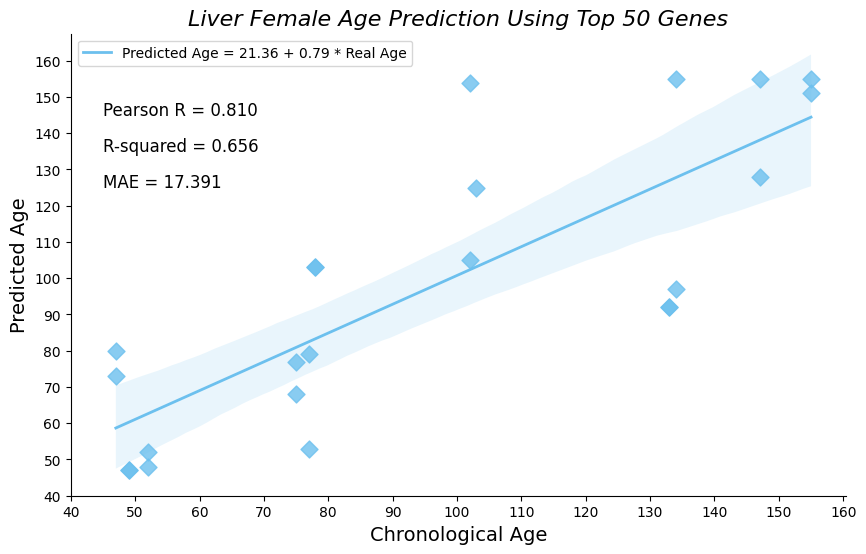


✅ Best Performing Clock (Based on Lowest MAE):
Top 10 Genes
Pearson R: 0.849
R-squared: 0.721
MAE: 15.217
Slope: 0.841
Intercept: 15.508


In [230]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    liver_predicted_ages = pd.DataFrame(index=liver_df_female_age.index, columns=["prediction"])

    for sample in liver_df_female_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/female/liver/reference/liver_reference_female_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_liver_age_steps_female:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_liver_age_steps_female)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        liver_predicted_ages.loc[sample, "prediction"] = max_probability_age

    liver_predicted_ages["true_age"] = liver_df_female_age["age"].tolist()
    liver_predicted_ages['age'] = pd.to_numeric(liver_predicted_ages['true_age'], errors='coerce')
    liver_predicted_ages['prediction'] = pd.to_numeric(liver_predicted_ages['prediction'], errors='coerce')
    liver_df_female_predictions = liver_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        liver_df_female_predictions['age'], liver_df_female_predictions['prediction']
    )

    liver_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(liver_df_female_predictions['age'], liver_df_female_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": liver_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {liver_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=liver_df_female_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {liver_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Liver Female Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

#### Male

In [231]:
liver_df_male = liver_df_counts.loc[liver_df_counts.iloc[:,-3] == "M"]

liver_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A5_1,36508,206,3342,296,14,375,356,1593,339,202,...,36,414,0,185,928,108,162,M,Liver,134
A8_1,56721,239,1240,467,30,416,444,1032,402,261,...,52,470,8,229,1014,153,168,M,Liver,133
B7_1,46082,190,5874,288,30,465,555,1129,332,306,...,14,576,2,235,1049,250,243,M,Liver,133
C5_1,41639,254,8813,231,22,423,336,1167,313,270,...,60,422,8,174,852,86,159,M,Liver,162
C7_1,46991,267,3752,349,38,556,637,1162,378,377,...,76,327,6,223,1268,156,190,M,Liver,152


In [232]:
age_days_value_counts_male = liver_df_male["age_days"].value_counts().index.tolist()

In [233]:
liver_age_steps_male = sorted(age_days_value_counts_male)

In [234]:
liver_gene_expression_data_male = liver_df_male.iloc[:,:-3]

In [235]:
liver_df_male_age = liver_gene_expression_data_male.copy()

In [236]:
#brain_df_male["age_days"] = pd.to_numeric(brain_df_male["age_days"], errors='coerce')
liver_df_male_age["age"] = liver_df_male["age_days"].tolist()

In [237]:
#for sample in liver_df_male_age.index.tolist():

#    new_df = liver_df_male_age.drop(sample)

#    new_df.to_csv(f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/liver/sample/liver_male_{sample}.csv", sep="\t")

    #print(new_df)

#    print(new_df.shape)

In [238]:
liver_age_steps_male

[47, 49, 52, 75, 77, 78, 102, 103, 133, 134, 147, 152, 161, 162]

In [239]:
new_liver_age_steps_male = np.arange(min(liver_age_steps_male), max(liver_age_steps_male) + 1, 1)

In [240]:
#counter = 0

#for sample in liver_df_male_age.index.tolist():

#    transcriptome_reference(training_matrix=f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/liver/sample/liver_male_{sample}.csv",
#                            reference_name=f"liver_reference_male_{sample}",
#                            output_path="/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/liver/reference/",
#                            age_prediction="list",
#                            age_list=new_liver_age_steps_male,
#                            min_age=1,
#                            max_age=24,
#                            age_step=1,
#                            tau=0.7)
    
#    counter += 1

#    print(counter)

#### Age Prediction


🔬 Performance for Gene Number: 10
Pearson R: 0.618
R-squared: 0.382
MAE: 26.194


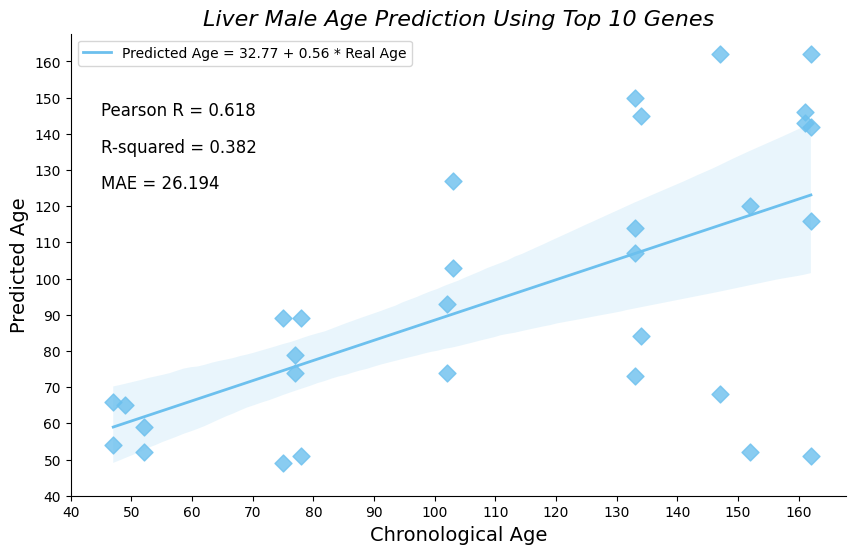


🔬 Performance for Gene Number: 15
Pearson R: 0.857
R-squared: 0.735
MAE: 16.419


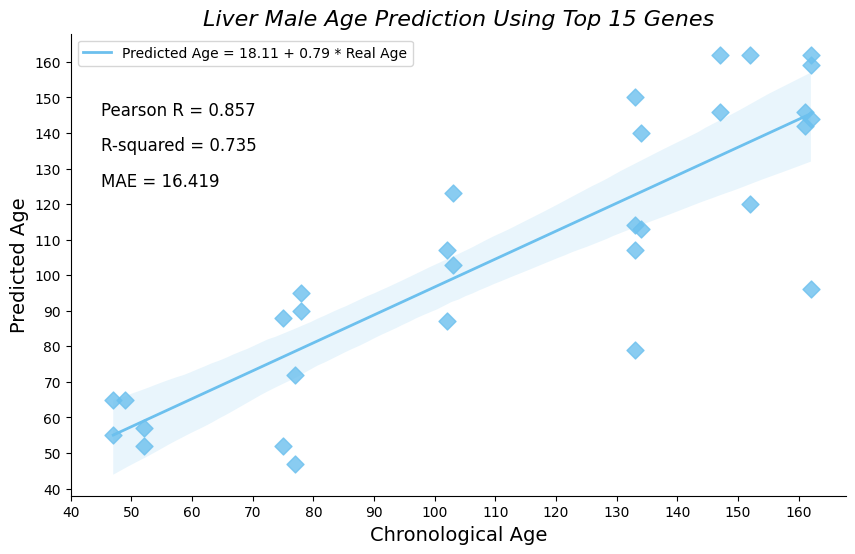


🔬 Performance for Gene Number: 20
Pearson R: 0.794
R-squared: 0.631
MAE: 17.710


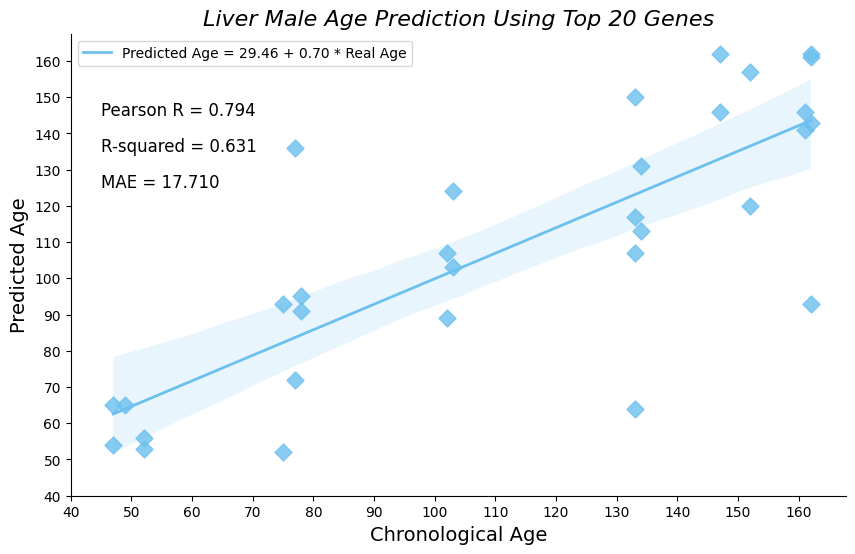


🔬 Performance for Gene Number: 25
Pearson R: 0.788
R-squared: 0.621
MAE: 17.710


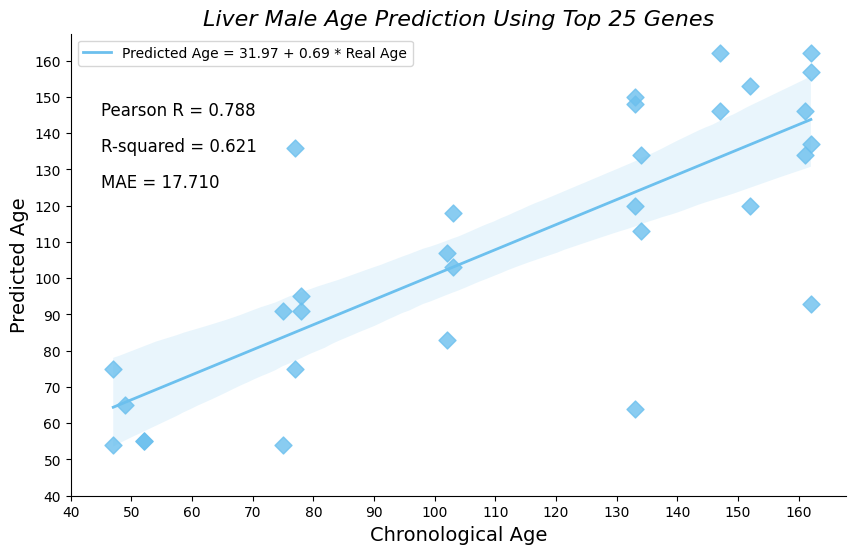


🔬 Performance for Gene Number: 30
Pearson R: 0.776
R-squared: 0.602
MAE: 18.419


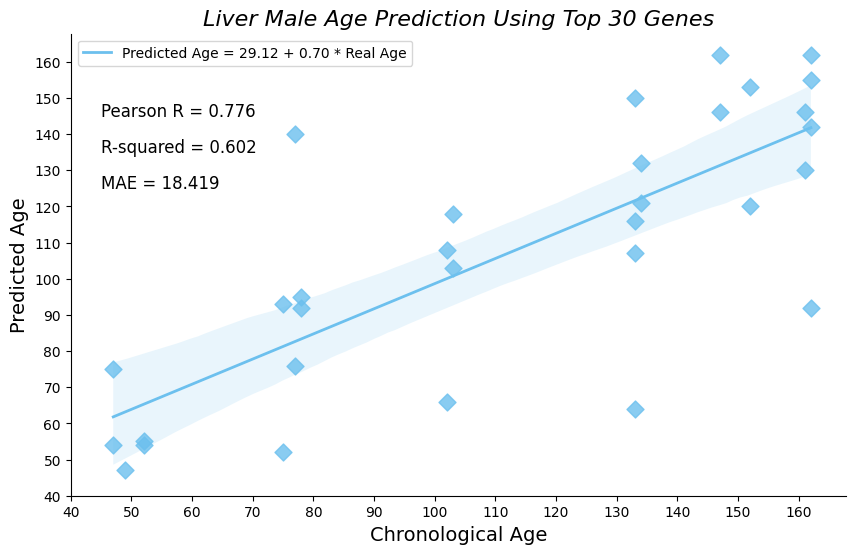


🔬 Performance for Gene Number: 35
Pearson R: 0.763
R-squared: 0.583
MAE: 19.032


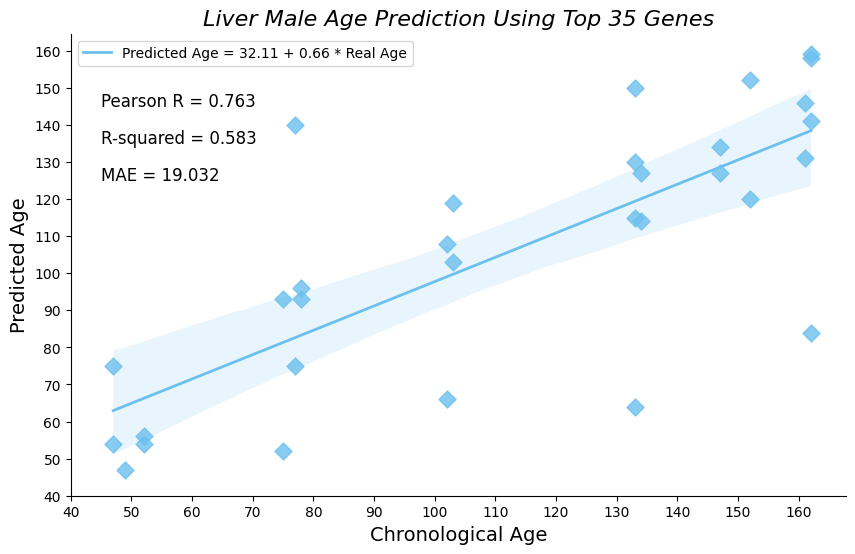


🔬 Performance for Gene Number: 40
Pearson R: 0.754
R-squared: 0.569
MAE: 19.774


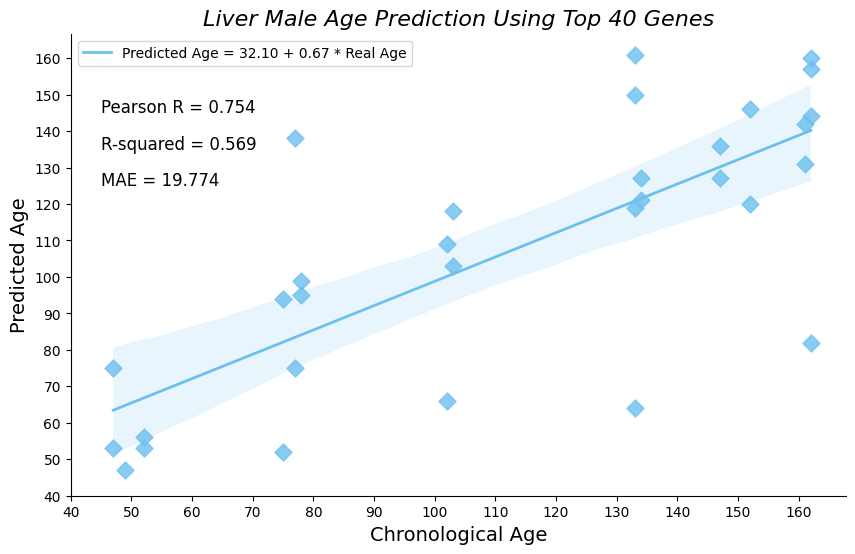


🔬 Performance for Gene Number: 45
Pearson R: 0.755
R-squared: 0.570
MAE: 20.032


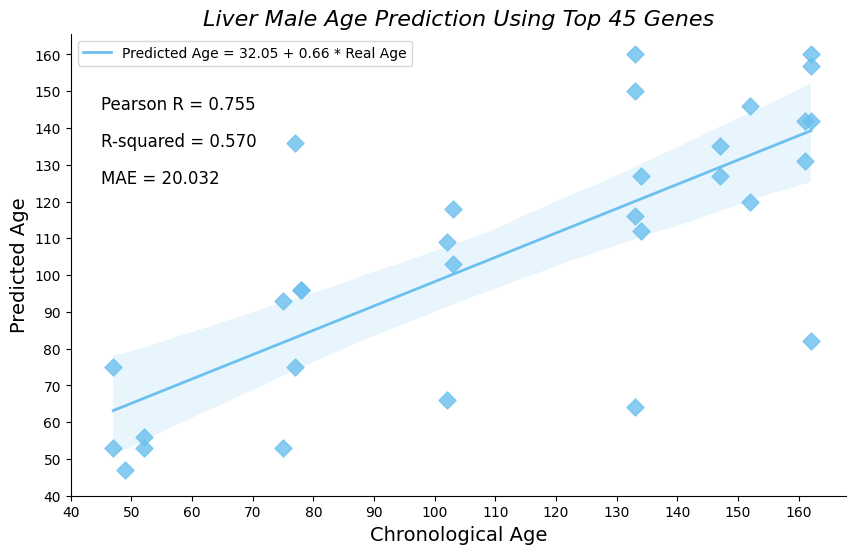


🔬 Performance for Gene Number: 50
Pearson R: 0.717
R-squared: 0.514
MAE: 21.419


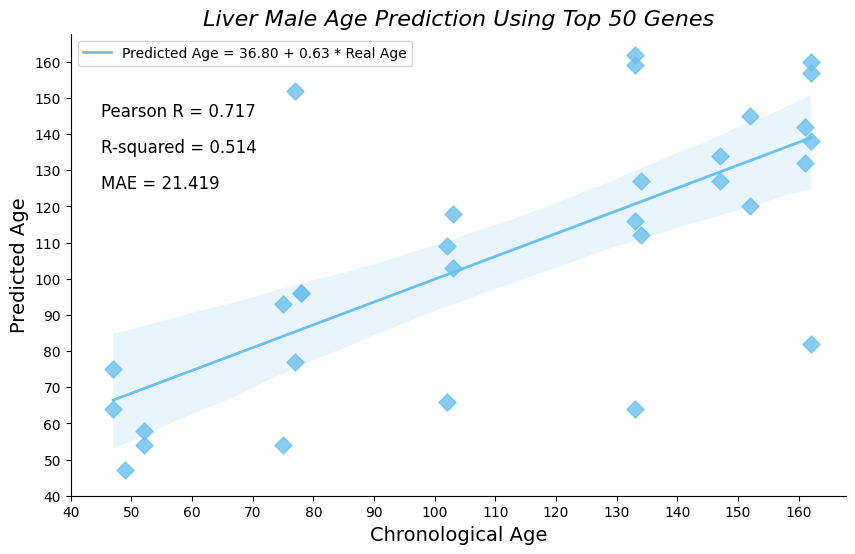


✅ Best Performing Clock (Based on Lowest MAE):
Top 15 Genes
Pearson R: 0.857
R-squared: 0.735
MAE: 16.419
Slope: 0.786
Intercept: 18.108


In [241]:
gene_number_test = [10, 15, 20, 25, 30, 35, 40, 45, 50]
performance_summary = []

counter = 0

for gene_number in gene_number_test:
    liver_predicted_ages = pd.DataFrame(index=liver_df_male_age.index, columns=["prediction"])

    for sample in liver_df_male_age.index.tolist():
        df_frequency = pd.read_csv(
            f"/home/lajoyce/Documents/african_killifish_atlas/revisions/BayesAge/male/liver/reference/liver_reference_male_{sample}",
            sep="\t"
        )
        df_frequency.set_index("Gene", inplace=True)

        top_absolute_spearman_correlation = df_frequency["spearman_rank"].abs().nlargest(gene_number)
        top_genes = top_absolute_spearman_correlation.index.tolist()
        total_reads_sample = df_unnorm.loc[sample].sum()
        list_of_profile_probabilities_per_age = []

        for age in new_liver_age_steps_male:
            probability_list_one_age = []

            for gene in top_genes:
                gene_frequency = df_frequency.loc[gene, f"{age}"]
                if gene_frequency < 0:
                    gene_frequency = 1e-10

                sample_expected_counts = gene_frequency * total_reads_sample
                sample_observed_counts = df_unnorm.loc[sample, gene]
                poisson_probability = poisson.pmf(k=sample_observed_counts, mu=sample_expected_counts)

                if np.isnan(poisson_probability) or poisson_probability == 0:
                    poisson_probability = 0.001

                probability_list_one_age.append(np.log(poisson_probability))

            list_of_profile_probabilities_per_age.append(np.sum(probability_list_one_age))

        age_probability_df = pd.DataFrame({"Pr": list_of_profile_probabilities_per_age}, index=new_liver_age_steps_male)
        max_probability_age = round(float(age_probability_df.idxmax().iloc[0]), 2)
        liver_predicted_ages.loc[sample, "prediction"] = max_probability_age

    liver_predicted_ages["true_age"] = liver_df_male_age["age"].tolist()
    liver_predicted_ages['age'] = pd.to_numeric(liver_predicted_ages['true_age'], errors='coerce')
    liver_predicted_ages['prediction'] = pd.to_numeric(liver_predicted_ages['prediction'], errors='coerce')
    liver_df_male_predictions = liver_predicted_ages.dropna(subset=['age', 'prediction'])

    slope, intercept, r_value, p_value, std_err = linregress(
        liver_df_male_predictions['age'], liver_df_male_predictions['prediction']
    )

    liver_correlation_coefficient = r_value
    cod = r_value ** 2
    MAE = mae(liver_df_male_predictions['age'], liver_df_male_predictions['prediction'])

    # Save to performance tracker
    performance_summary.append({
        "gene_number": gene_number,
        "pearson_r": liver_correlation_coefficient,
        "r_squared": cod,
        "mae": MAE,
        "slope": slope,
        "intercept": intercept
    })

    # Print performance
    print(f"\n🔬 Performance for Gene Number: {gene_number}")
    print(f"Pearson R: {liver_correlation_coefficient:.3f}")
    print(f"R-squared: {cod:.3f}")
    print(f"MAE: {MAE:.3f}")

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.regplot(
        x="age",
        y="prediction",
        data=liver_df_male_predictions,
        marker="D",
        color="#6cc0ee",
        scatter_kws={'s': 75},
        line_kws={'label': f"Predicted Age = {intercept:.2f} + {slope:.2f} * Real Age", 'linewidth': 2}
    )
    sns.despine(right=True)

    x_tick = np.arange(40, 170, 10)
    y_tick = np.arange(40, 170, 10)
    plt.xticks(x_tick)
    plt.yticks(y_tick)

    plt.text(45, 145, f"Pearson R = {liver_correlation_coefficient:.3f}", fontsize=12, color="black")
    plt.text(45, 135, f"R-squared = {cod:.3f}", fontsize=12, color="black")
    plt.text(45, 125, f'MAE = {MAE:.3f}', fontsize=12, color='black')

    plt.xlabel('Chronological Age', fontsize=14)
    plt.ylabel('Predicted Age', fontsize=14)
    plt.title(f'Liver Male Age Prediction Using Top {gene_number} Genes', fontsize=16, fontstyle="italic")
    plt.legend()
    plt.show()

    counter += 1

# --- After all iterations ---
performance_df = pd.DataFrame(performance_summary)
best_model = performance_df.loc[performance_df["mae"].idxmin()]

print("\n✅ Best Performing Clock (Based on Lowest MAE):")
print(f"Top {int(best_model['gene_number'])} Genes")
print(f"Pearson R: {best_model['pearson_r']:.3f}")
print(f"R-squared: {best_model['r_squared']:.3f}")
print(f"MAE: {best_model['mae']:.3f}")
print(f"Slope: {best_model['slope']:.3f}")
print(f"Intercept: {best_model['intercept']:.3f}")

In [242]:
os.getcwd()

'/home/lajoyce/Documents/african_killifish_atlas/revisions'